In [1]:
from __future__ import division, unicode_literals, print_function  # for compatibility with Python 2 and 3

import PIL
from sklearn.cluster import KMeans
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.special import factorial
from scipy.stats import poisson
from itertools import chain
import matplotlib.cbook as cbook
from matplotlib_scalebar.scalebar import ScaleBar

import numpy
import scipy.cluster.hierarchy as hcluster

# change the following to %matplotlib notebook for interactive plotting
%matplotlib notebook
from scipy.signal import find_peaks
# Optionally, tweak styles.
mpl.rc('figure',  figsize=(10, 5))
mpl.rc('image', cmap='gray')
import numpy as np
import pandas as pd
from pandas import DataFrame, Series  # for convenience

import pims
import trackpy as tp

## import images
V_moving_list=[]


### function to find msd, returns list of msd values and plots the individual particles msds when called

def find_msd(data,max_lag_time):  ## takes in dataframe and a max lag time
    matrix_msd=[] ## to store all particle trajectories (each row a particle trajectory)
    d_t=[]
    ## see all particle numbers that have trajectory 
    part_temp=list(data['particle'])
    part = list(set(part_temp))
    for i in part: ## loop over all trajectories
        del_t=[]
        msd_part_i=[]
        df=data.loc[data['particle'] ==i]  ## dataframe of all rows with particle =i
        x_list=list(df['x'])## x positions of particle i
        y_list=list(df['y'])## y positions of particle i
        for t in range(1,max_lag_time):  ## loop over lag times
            del_t.append(t)
            dx=[(x_list[j+t]-x_list[j]) for j in range(len(x_list)-int(max_lag_time))]
            dy=[(y_list[j+t]-y_list[j]) for j in range(len(y_list)-int(max_lag_time))]
            disp=[np.sqrt(dx[i]**2+dy[i]**2) for i in range(len(dx))] ## find displacement
            msd_temp=np.mean(disp)## mean 
            msd_part_i.append(msd_temp)
        #plt.loglog(del_t,msd_part_i,alpha=0.1,color='black')
        matrix_msd.append(msd_part_i)
        d_t.append(del_t)
        plt.xlabel('lag_time')
        plt.ylabel('msd')
        
        #plt.show() ###shows individual particle msds while calling the function
    matrix_msd_arr = np.array(matrix_msd)
    # delete all the rows with any NaN value( some rows become nan as there are too less trajectory frames compared to max lag time)
    indexList = [np.any(i) for i in np.isnan(matrix_msd_arr )]
    matrix_msd_corrected  = np.delete(matrix_msd_arr , indexList, axis=0)
    msd = np.average(matrix_msd_corrected, axis=0)  ## average columns of the matrix(ie over all positions for a lag time)
    return msd,del_t
    
def find_traj_data(frames,conect,mem,size,mass,filt):
    ## locate features in all frames( fluroscent bleach after 200 frames)
    f = tp.batch(frames[:500],size, minmass=mass); ### locate features with radius 7 and minimum brightness 100 from frame 100

    ## link different frames
    t = tp.link(f,conect, memory=mem) ### features must uptot 5 pixels in the next frame to be considered a trajectory (memory incase it disapears for some frames)

    #### trajectories that last fewer than 30 frames are disguarded
    t1 = tp.filter_stubs(t,filt)
    # Compare the number of particles in the unfiltered and filtered data.
    #print('Before:', t['particle'].nunique())
    #print('After:', t1['particle'].nunique())

     #tp.plot_traj(t1);

    ## subtract any drift in image(look at image from the center of mass)
    d = tp.compute_drift(t1)
    tm = tp.subtract_drift(t1.copy(), d) 
    tm.rename(columns = {'size':'area'}, inplace = True)
    data = pd.DataFrame()

    for item in set(tm.particle):
    
        sub = tm[tm.particle==item]
        
        dx = m_p*np.diff(sub.x)/1. # differnece between to frame for X postion
        dy = m_p*np.diff(sub.y)/1. #wdiffernece between to frame for Y postion
        dt = np.diff(sub.frame)/Fps #to calcul the time
        dr=((np.sqrt(dy**2 + dx**2)))
        tan = (dy/dx) # to calcul the slope
        ang_d=abs((np.arctan(tan)*57.2958))
        #print(np.diff(sub.frame))
        #v = (((np.sqrt(dy**2 + dx**2)))/dt)
        v = (((np.sqrt(dy**2 + dx**2)))/dt)
        
        dx_total=sub.x.tolist()[-1]-sub.x.tolist()[0]
        dy_total=sub.y.tolist()[-1]-sub.y.tolist()[0]
        dt_total=sub.frame.tolist()[-1]-sub.frame.tolist()[0]
        
        #s = [41.7*(((np.sqrt(dy_total**2 + dx_total**2)))/dt_total) for _ in range(len(v))]
        s = [2*41.7*(((np.sqrt(dy_total**2 + dx_total**2)))/dt_total) for _ in range(len(v))]
        
        for x, y, dx, dy,disp, v,s,ang_disp,area, dt, frame in zip(sub.x[:-1], sub.y[:-1], abs(dx), abs(dy),dr ,v,s,ang_d,sub.area[:-1] ,dt,sub.frame[:-1],):
            data = data.append([{'dx': dx,
            'dy': dy,
             'x': x,
             'y': y,
            'frame': frame,
             'particle': item,
              'disp':disp,                  
             'dt' : dt,
             'area':area,
              'ang_disp':ang_disp,  
            's':s,  
             'v' : v,}])
       
    
    
    utraj = np.unique(tm.particle)
    num_traj = utraj.size
    cdict = {}

   
    return tm,data




def find_ee_distance(data):  ## takes in dataframe and a max lag time
    disp_part_i=[]
    xi=[]
    yi=[]
    part_id=[]
    ## see all particle numbers that have trajectory 
    part_temp=list(data['particle'])
    part = list(set(part_temp))
    for i in part: ## loop over all trajectories
        del_t=[]
        msd_part_i=[]
        df=data.loc[data['particle'] ==i]  ## dataframe of all rows with particle =i
        x_list=list(df['x'])## x positions of particle i
        y_list=list(df['y'])## y positions of particle i
        dx=(x_list[0]-x_list[-1])
        dy=(y_list[0]-y_list[-1])
        disp=np.sqrt(dx**2+dy**2) ## find displacement
        disp_part_i.append(disp)
        xi.append(x_list[-1])
        yi.append(y_list[-1])
        part_id.append(i)
    return disp_part_i,xi,yi,part_id

def find_rad_distance(data,xc,yc):  ## takes in dataframe and a max lag time
    disp_part_i=[]
    ri_list=[]
    rf_list=[]
    part_id=[]
    r_list=[]
    ## see all particle numbers that have trajectory 
    part_temp=list(data['particle'])
    part = list(set(part_temp))
    for i in part: ## loop over all trajectories
        del_t=[]
        msd_part_i=[]
        df=data.loc[data['particle'] ==i]  ## dataframe of all rows with particle =i
        r_part_i=[]
        x_list=list(df['x'])## x positions of particle i
        y_list=list(df['y'])## y positions of particle i
        
       
        dxi=(x_list[0]-xc)
        dyi=(y_list[0]-yc)
        dxf=(x_list[-1]-xc)
        dyf=(y_list[-1]-yc)  
        ri=np.sqrt(dxi**2+dyi**2) ## find displacement
        rf=np.sqrt(dxf**2+dyf**2) ## find displacement
        ri_list.append(ri)
        rf_list.append(rf)
        part_id.append(i)
    return ri_list,rf_list,part_id

def find_rad_distance2(data,xc,yc):  ## takes in dataframe and a max lag time
    disp_part_i=[]
    ri_list=[]
    rf_list=[]
    part_id=[]
    r_list=[]
    ## see all particle numbers that have trajectory 
    part_temp=list(data['particle'])
    part = list(set(part_temp))
    for i in part: ## loop over all trajectories
        del_t=[]
        msd_part_i=[]
        df=data.loc[data['particle'] ==i]  ## dataframe of all rows with particle =i
        r_part_i=[]
        x_list=list(df['x'])## x positions of particle i
        y_list=list(df['y'])## y positions of particle i
        for xi,yi in zip(x_list,y_list):
            r_part_i.append(np.sqrt((xi-xc)**2+(yi-yc)**2))
        r_list.append(r_part_i)
        dxi=(x_list[0]-xc)
        dyi=(y_list[0]-yc)
        dxf=(x_list[-1]-xc)
        dyf=(y_list[-1]-yc)  
        ri=np.sqrt(dxi**2+dyi**2) ## find displacement
        rf=np.sqrt(dxf**2+dyf**2) ## find displacement
        ri_list.append(ri)
        rf_list.append(rf)
        part_id.append(i)
    return ri_list,rf_list,part_id,r_list

def in_out(min_dist,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax):
    iid_in=[]
    iid_out=[]
    %matplotlib notebook
    V_filtered_list=[]
    fig, ax = plt.subplots()
    ax.axis("off")
    for ind,i in enumerate(iidr):
        
        if ee[ind]>min_dist and ri[ind]>rmin and ri[ind]<rmax:
            #plt.scatter(xe[i],ye[i],color='yellow',s=10)
            df=data.loc[data['particle'] ==i]
            trajx=df['x'].tolist()
            trajy=df['y'].tolist()
            x=trajx
            y=trajy
            c_map = plt.cm.get_cmap('cool')

            # Normalize the color values between 0 and 1
            norm = plt.Normalize(0, len(x) - 1)
    
            # Plot the trajectories with a colormap
            for i in range(len(x) - 1):
                color = c_map(norm(i))
                plt.plot([x[i], x[i+1]], [y[i], y[i+1]], color=color)


            # Add a colorbar to show the fade in between
            sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
            sm.set_array([])
            #cbar = plt.colorbar(sm)


            #plt.xlabel('X')
            #plt.ylabel('Y')
            #plt.title('Particle Trajectories')
       
            for i in range(0,len(iidr)):
        
                if ri[i]>rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                    iid_in.append(i)
                
          
                if ri[i]<rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                
                    iid_out.append(i)
         
    scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


    ax.add_artist(scalebar)


    plt.plot()
    sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm)
    plt.imshow(frames[0]);
    if (len(iid_out)+len(iid_in))!=0:
        ratio_in_out=len(iid_in)/(len(iid_out)+len(iid_in))
    else:
        ratio_in_out=0
    return ratio_in_out,V_filtered_list


def in_out_vels(min_dist,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax):
    iid_in=[]
    iid_out=[]
    %matplotlib notebook
    V_filtered_list=[]
    V_in=[]
    V_out=[]
    fig, ax = plt.subplots()
    ax.axis("off")
    for ind,i in enumerate(iidr):
        
        if ee[ind]>min_dist and ri[ind]>rmin and ri[ind]<rmax:
            #plt.scatter(xe[i],ye[i],color='yellow',s=10)
            df=data.loc[data['particle'] ==i]
            trajx=df['x'].tolist()
            trajy=df['y'].tolist()
            x=trajx
            y=trajy
            c_map = plt.cm.get_cmap('cool')

            # Normalize the color values between 0 and 1
            norm = plt.Normalize(0, len(x) - 1)
    
            # Plot the trajectories with a colormap
            for i in range(len(x) - 1):
                color = c_map(norm(i))
                plt.plot([x[i], x[i+1]], [y[i], y[i+1]], color=color)


            # Add a colorbar to show the fade in between
            sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
            sm.set_array([])
            #cbar = plt.colorbar(sm)


            #plt.xlabel('X')
            #plt.ylabel('Y')
            #plt.title('Particle Trajectories')
       
            for i in range(0,len(iidr)):
        
                if ri[i]>rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                    iid_in.append(i)
                    df=data.loc[data['particle'] ==i]
                    vel=df['v'].tolist()
                    for velocity in vel:
                        V_in.append(velocity)
                    
                
          
                if ri[i]<rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                
                    iid_out.append(i)
                    df=data.loc[data['particle'] ==i]
                    vel=df['v'].tolist()
                    for velocity in vel:
                        V_out.append(velocity)
         
    scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


    ax.add_artist(scalebar)


    plt.plot()
    sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm)
    plt.imshow(frames[0]);
    if (len(iid_out)+len(iid_in))!=0:
        ratio_in_out=len(iid_in)/(len(iid_out)+len(iid_in))
    else:
        ratio_in_out=0
    return ratio_in_out,[V_in,V_out]





m_p=2*41.7
Fps=1
def find_cm(frames,tm,size):
    ##finding center of cell, is taking center of mass ok? how to define the center from image?
    f = tp.batch(frames[:2],size, minmass=100); ### locate features with radius 7 and minimum brightness 100 from frame 100
    x_vals=f['x'].tolist()
    y_vals=f['y'].tolist()
    mass=f['raw_mass'].tolist()
    x_cm=0
    y_cm=0
    for i in range(0,len(mass)):## takin
        x_cm+=(x_vals[i]*mass[i])/np.sum(mass)
        y_cm+=(y_vals[i]*mass[i])/np.sum(mass)
    
     
    return x_cm,y_cm

      
ratios=[]
vel_list=[]
label=[]
vel_avg=[]
c=3.5  #### end to end displacement cutoff

<IPython.core.display.Javascript object>


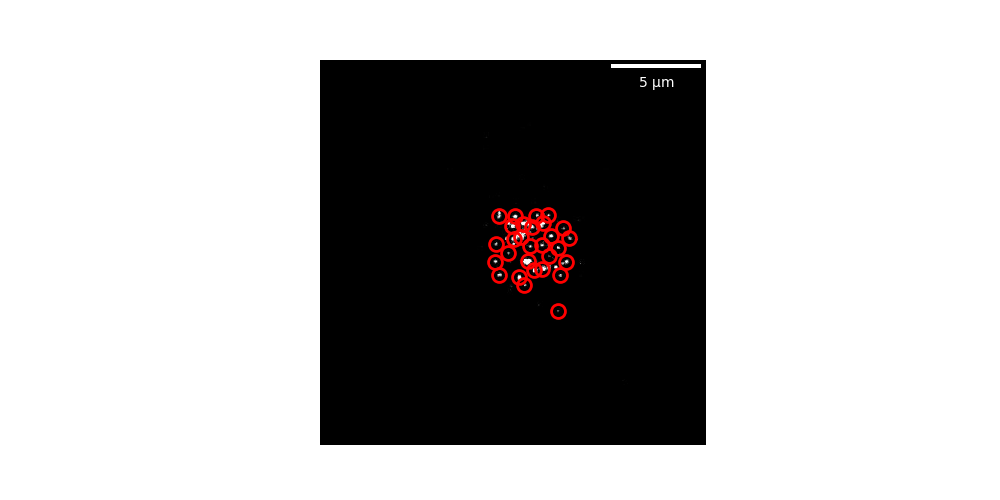

In [2]:
import matplotlib.pyplot as plt
import pims
import trackpy as tp
from matplotlib_scalebar.scalebar import ScaleBar

# Load your frames and set other parameters
frames = pims.open('../Documents/more actin inhib/J wt 4/*.jpg')
conect = 4
mem = 5
size = 9
mass = 100
filt = 8

fig, ax = plt.subplots()
ax.axis("off")

n = 100
f = tp.locate(frames[n], size, minmass=mass)
plt.imshow(frames[n])
tp.annotate(f, frames[n],plot_style={'markersize':10})
# Create a white scale bar with a smaller width
scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


ax.add_artist(scalebar)


# Hide the scale bar number
#ax.get_xaxis().set_visible(False)
#ax.get_yaxis().set_visible(False)

plt.show()


Frame 1: 50 features
278.930313256181 242.38826347309032


<IPython.core.display.Javascript object>


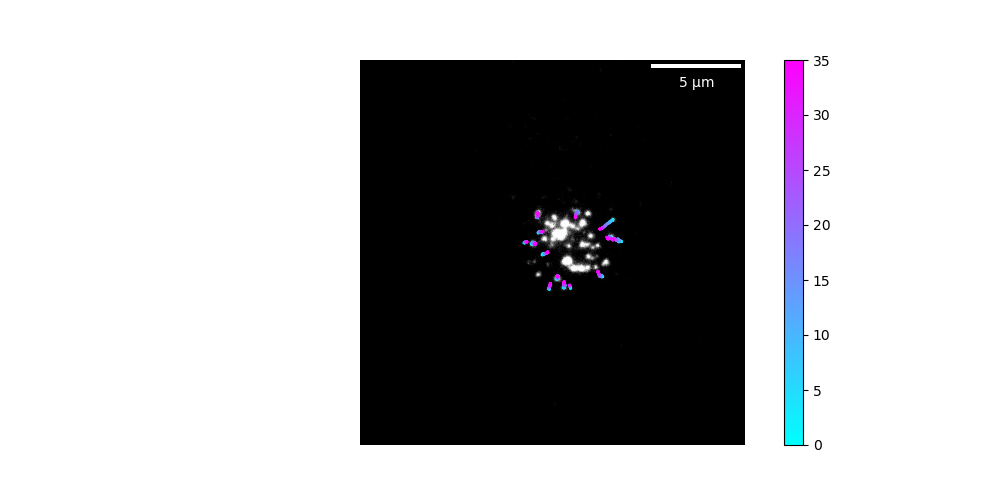

[0.9285714285714286]


<IPython.core.display.Javascript object>


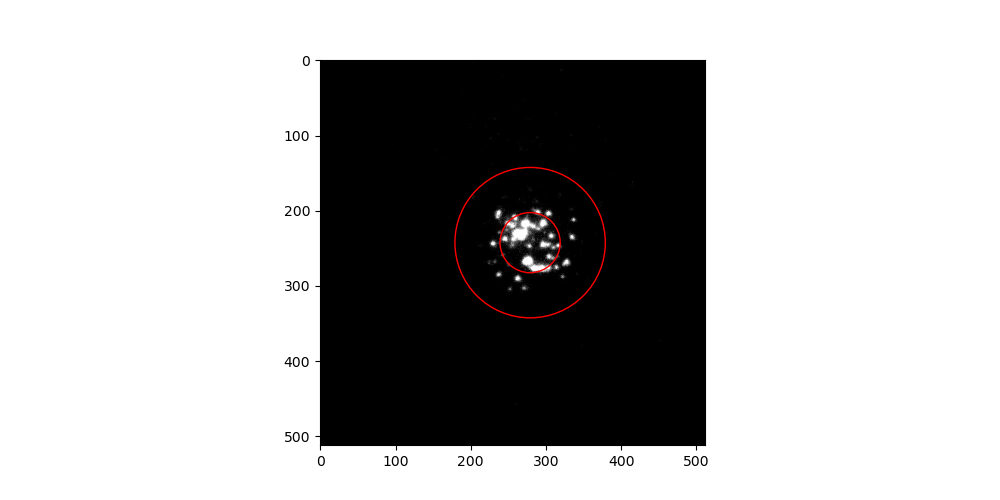

333.9953831276336
0.014323613605054502


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [3]:
ratio_list=[]
rmin=40
rmax=100
conect=4
mem=4
size=5
mass=30
filt=6
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c+1,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)   
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]

vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


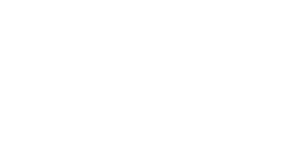

<IPython.core.display.Javascript object>


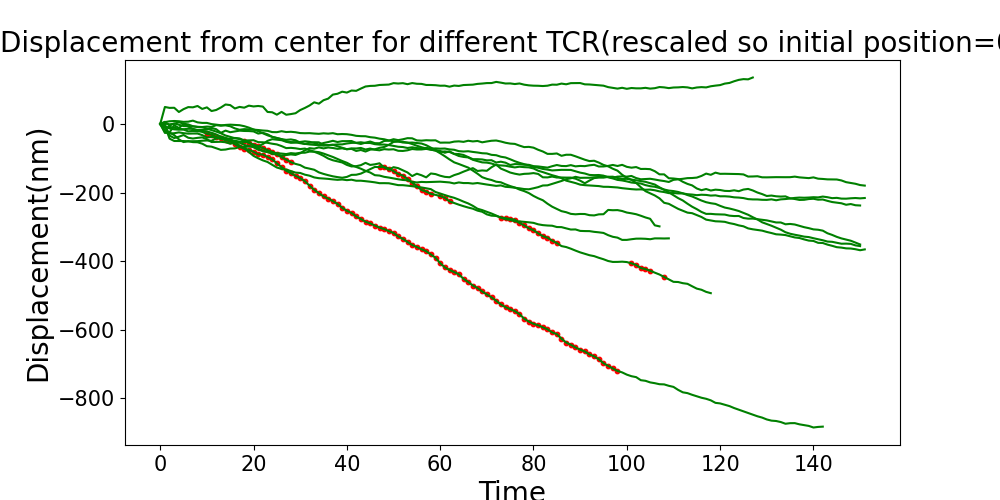

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [5]:
def smooth_list(lst, window_size):
    smoothed = []
    for i in range(len(lst)):
        window_start = max(0, i - window_size + 1)
        window_end = i + 1
        window_values = lst[window_start:window_end]
        window_average = sum(window_values) / len(window_values)
        smoothed.append(window_average)
    return smoothed
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    
    if len( r_tot[pi])>100 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=c:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>40:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

Frame 1: 50 features
278.930313256181 242.38826347309032


<IPython.core.display.Javascript object>


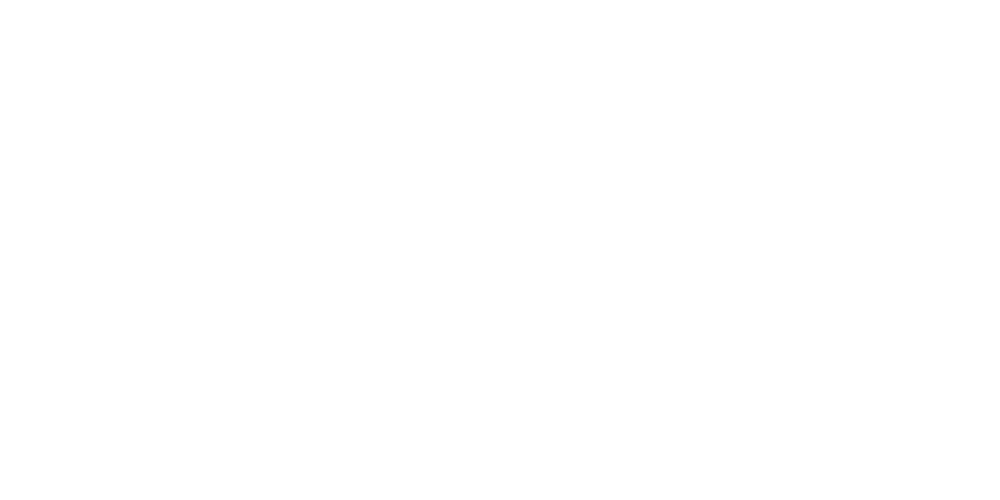

[0.9473684210526315]


<IPython.core.display.Javascript object>


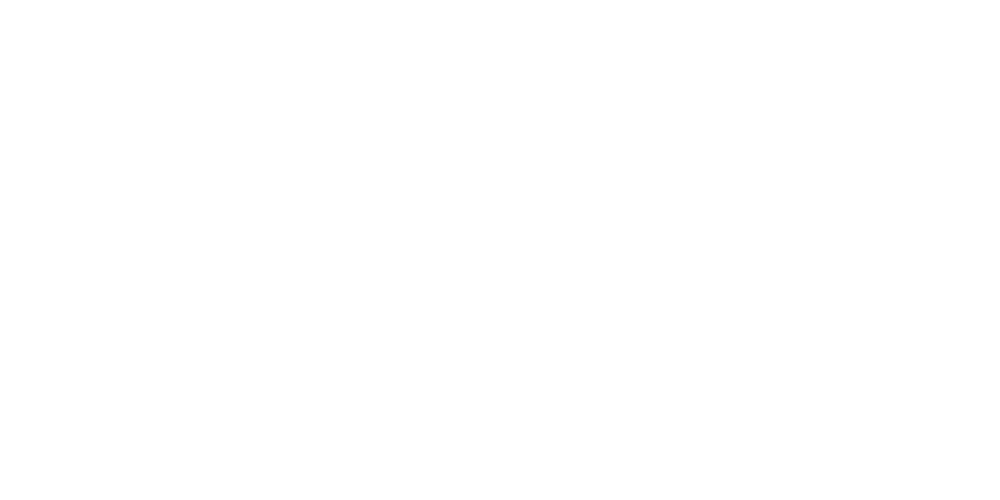

333.9953831276336
0.014323613605054502


In [6]:

#%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 4/*.jpg'))
conect=4
mem=5
size=7
mass=40
filt=8

#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=30
rmax=120

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ratio_list=[]
rmin=40
rmax=100
conect=4
mem=4
size=5
mass=30
filt=6
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)   
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]

vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)


<IPython.core.display.Javascript object>


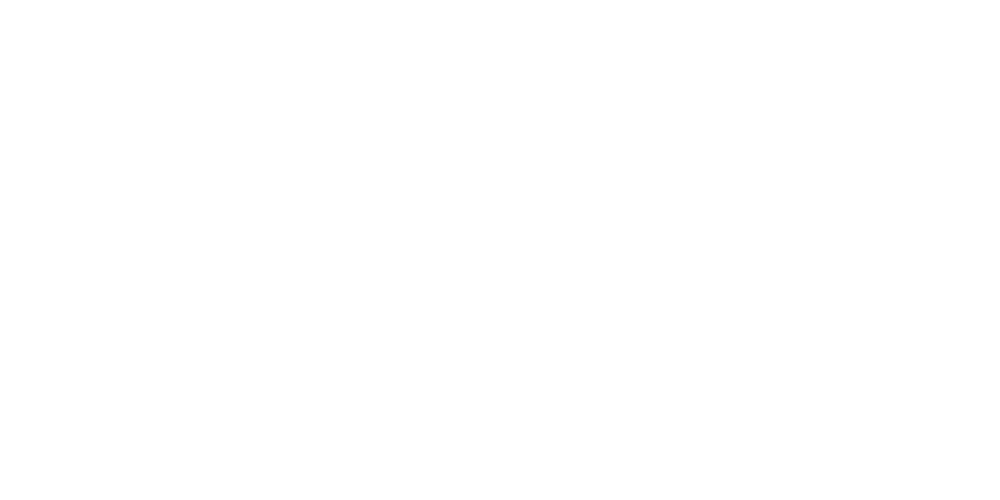

<IPython.core.display.Javascript object>


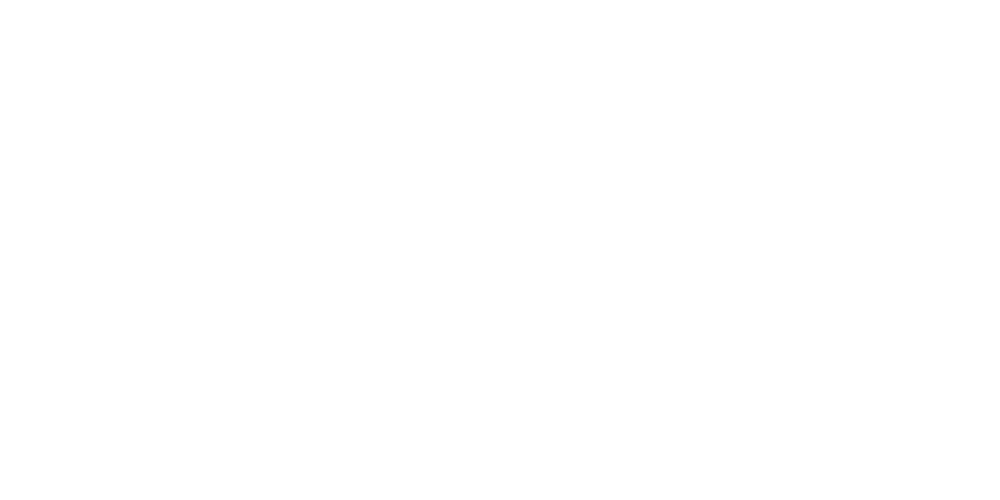

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [7]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
      if len( r_tot[pi])>1 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=3:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>10:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

#plt.show() 

<IPython.core.display.Javascript object>


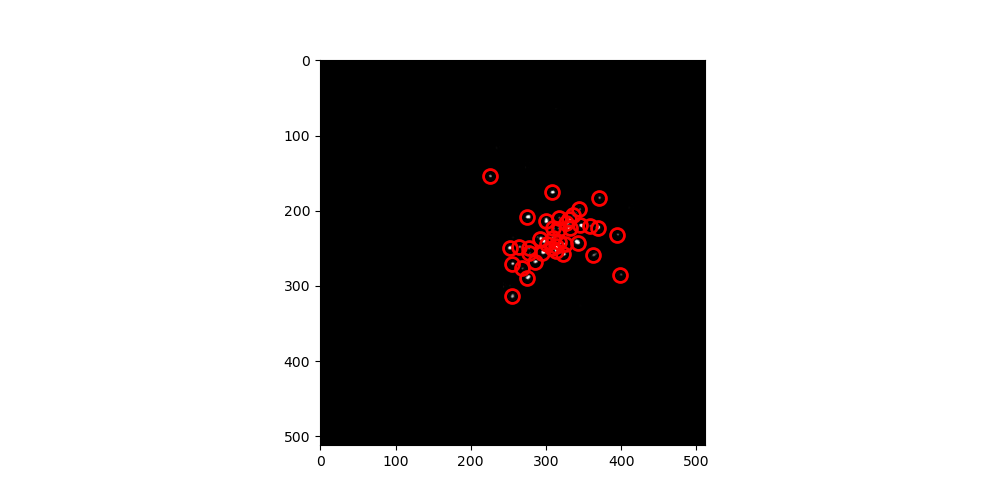

In [8]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 5/*.jpg'))


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=100
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])



Frame 1: 42 features
308.5796782205292 233.85295329890198


<IPython.core.display.Javascript object>


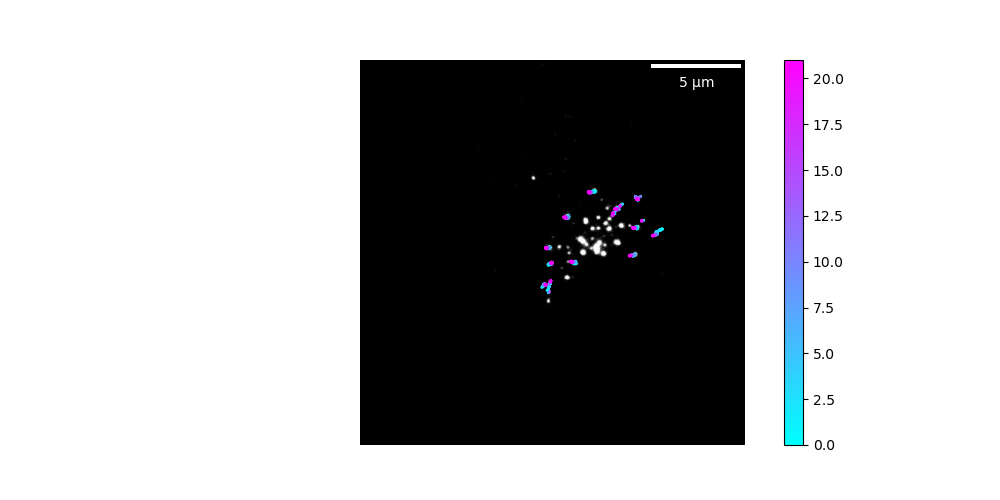

[0.8421052631578947]


<IPython.core.display.Javascript object>


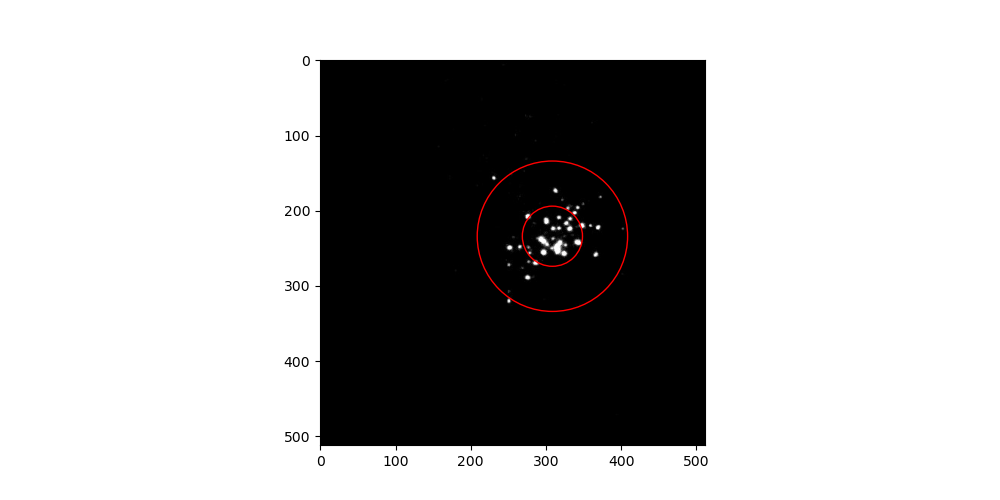

342.538726939729
0.01675189621761464


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [8]:
ratio_list=[]
rmin=40
rmax=100
conect=4
mem=4
size=5
mass=30
filt=6
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)   
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]

vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


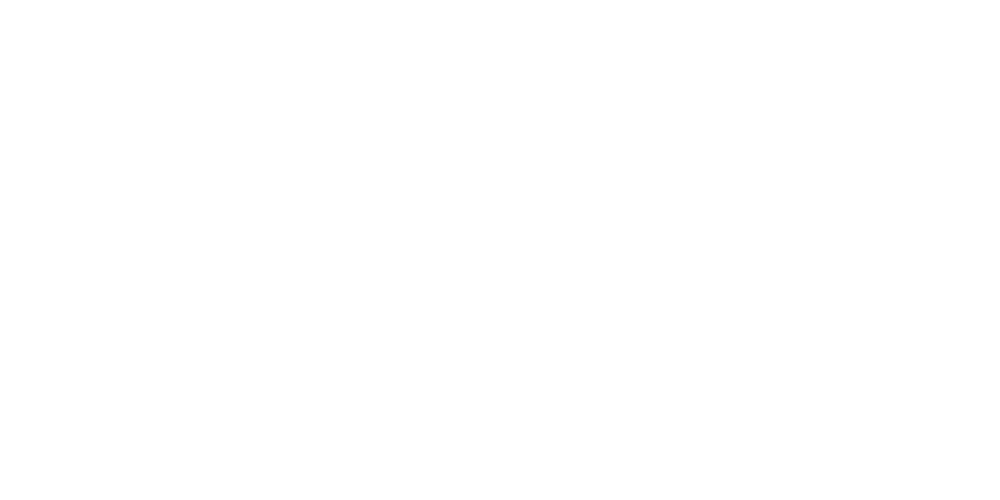

<IPython.core.display.Javascript object>


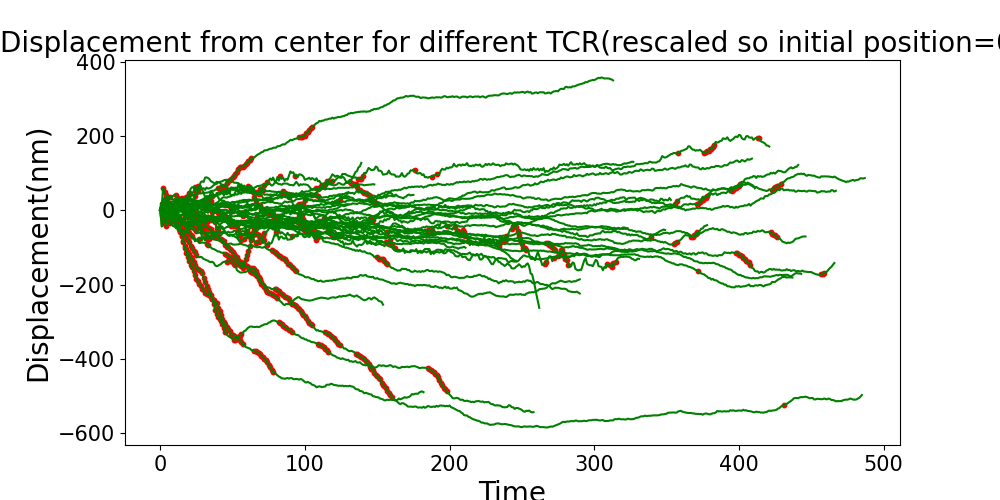

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [9]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    if len( r_tot[pi])>120:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>10:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

#plt.show() 

<IPython.core.display.Javascript object>


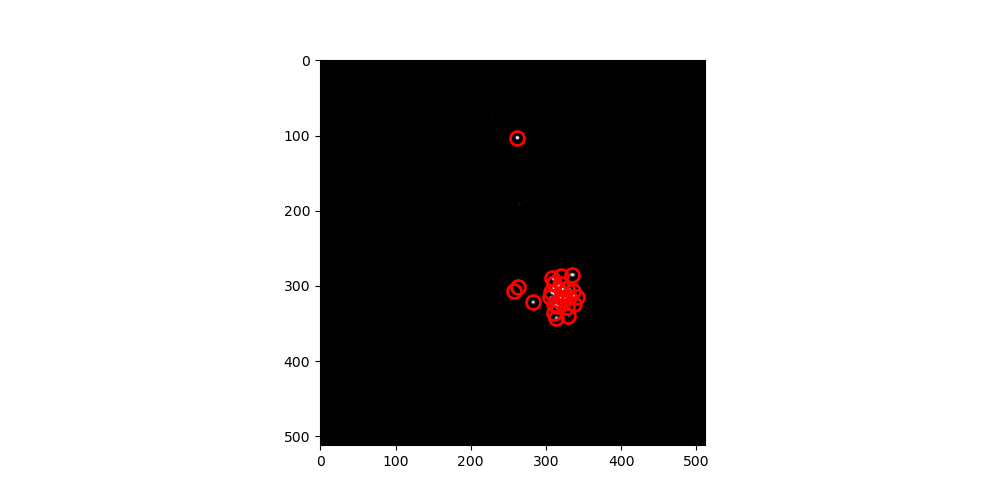

In [10]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 6/*.jpg'))


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])


Frame 1: 13 features
314.3975213868784 299.6264815598828


<IPython.core.display.Javascript object>


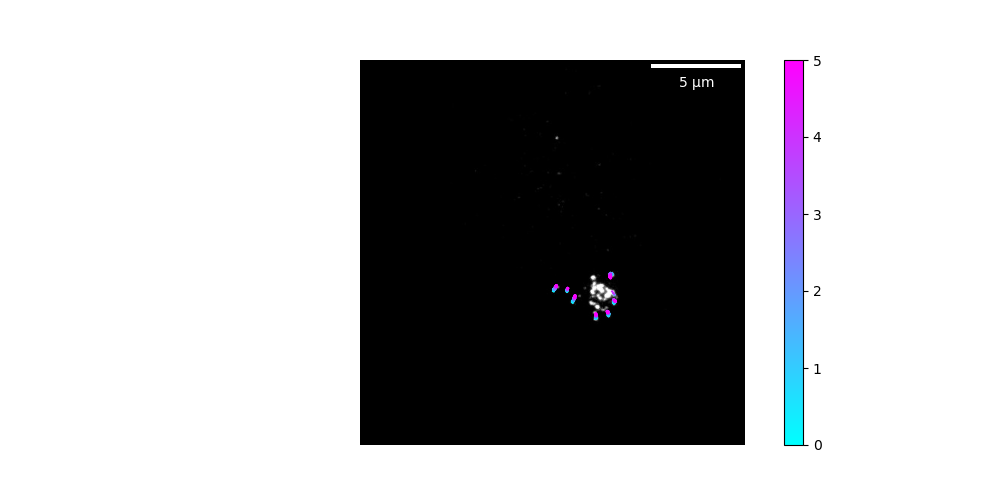

[1.0]


<IPython.core.display.Javascript object>


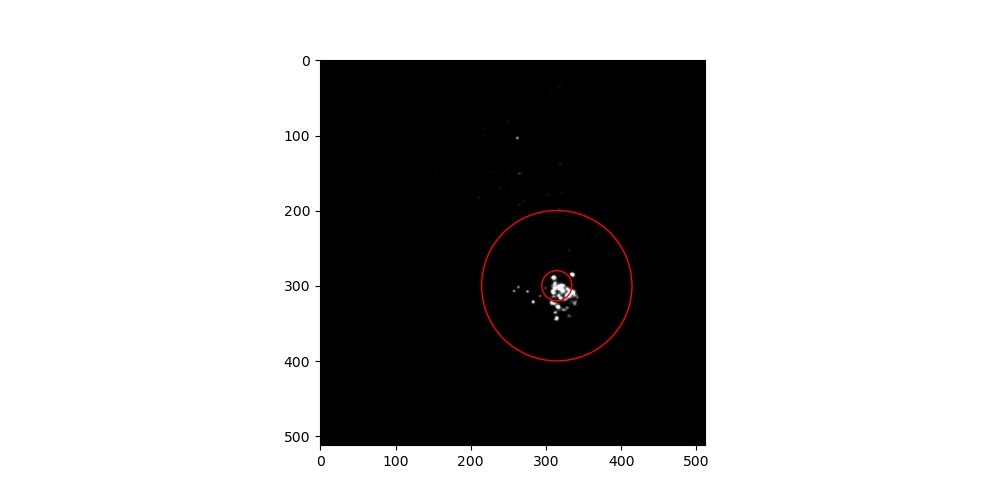

/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [11]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 6/*.jpg'))

conect=4
mem=4
size=9
mass=60
filt=6

#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=20
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


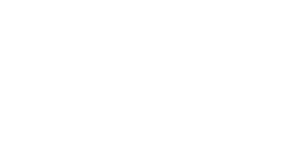

<IPython.core.display.Javascript object>


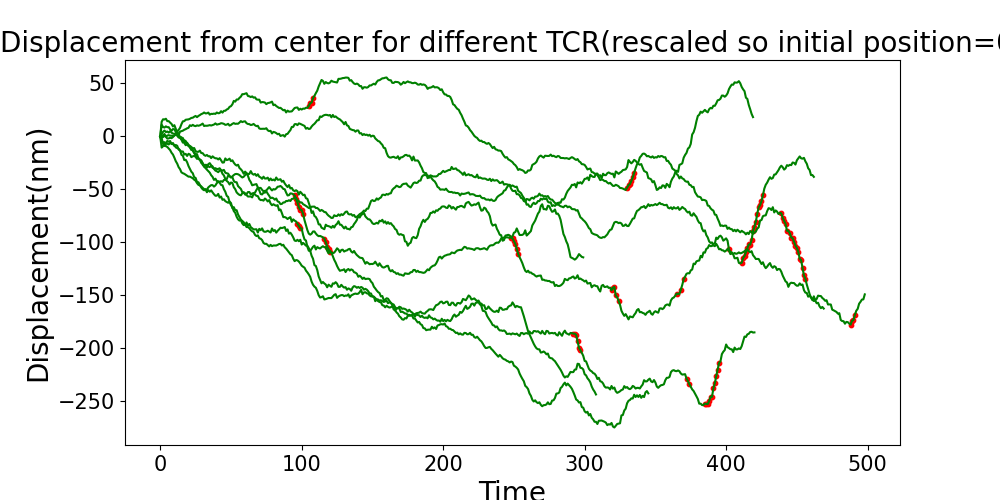

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [14]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    if len( r_tot[pi])>220:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

#plt.show() 

Frame 1: 19 features
229.7254256600951 222.99036822828592


<IPython.core.display.Javascript object>


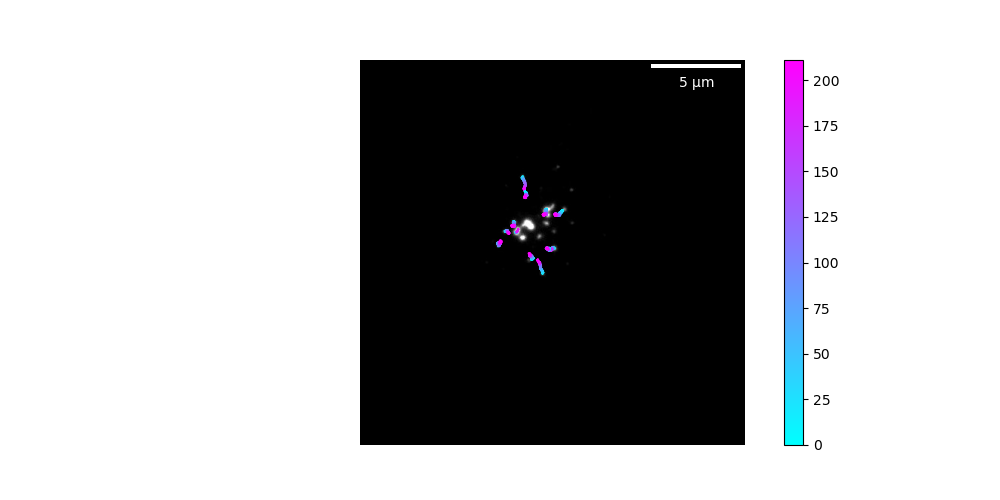

[0.9166666666666666]


<IPython.core.display.Javascript object>


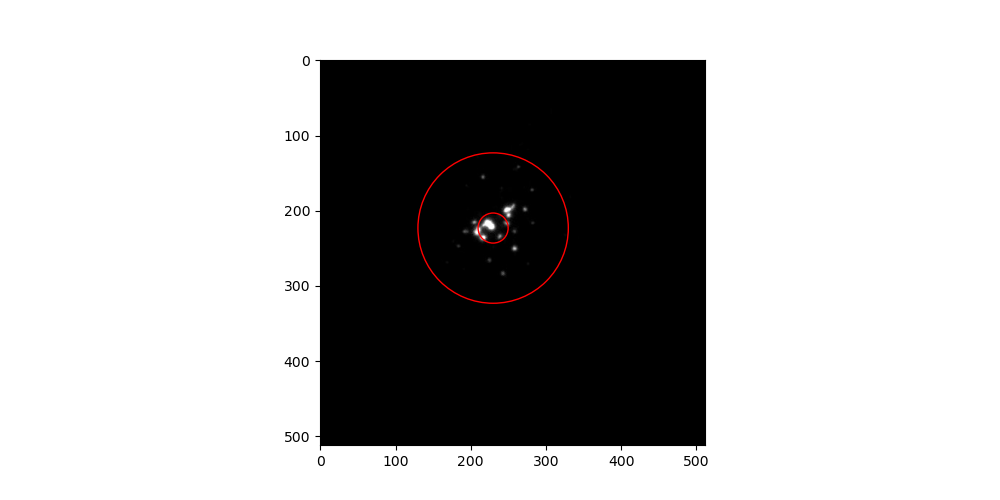

294.014567478157
0.02092239420875093


In [15]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 7/*.jpg'))


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])


ratio_list=[]
rmin=20
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


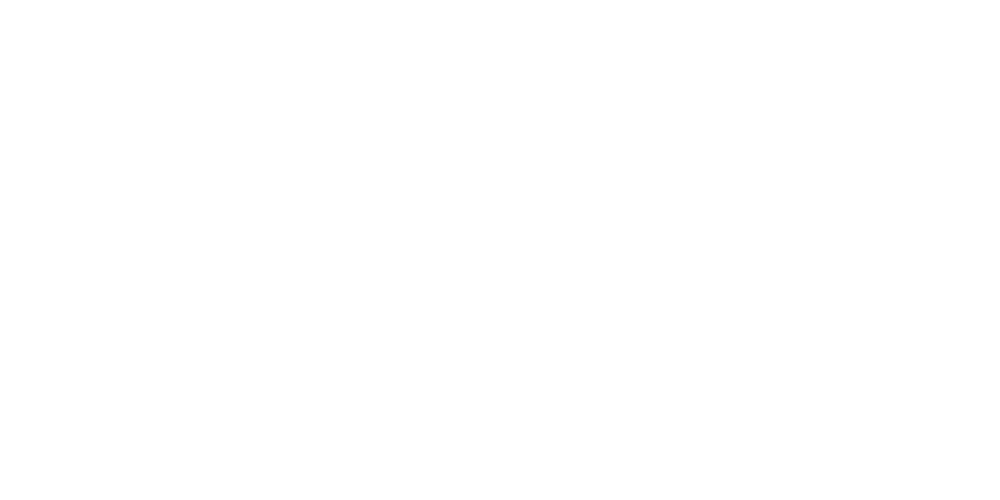

<IPython.core.display.Javascript object>


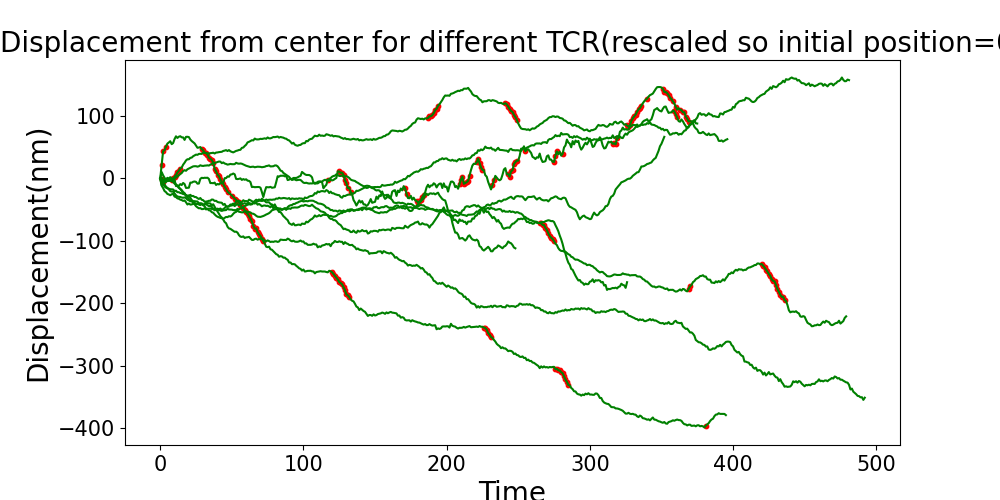

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [16]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    if len( r_tot[pi])>220:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

#plt.show() 

Frame 1: 27 features
300.03321386888763 254.33324607880704


<IPython.core.display.Javascript object>


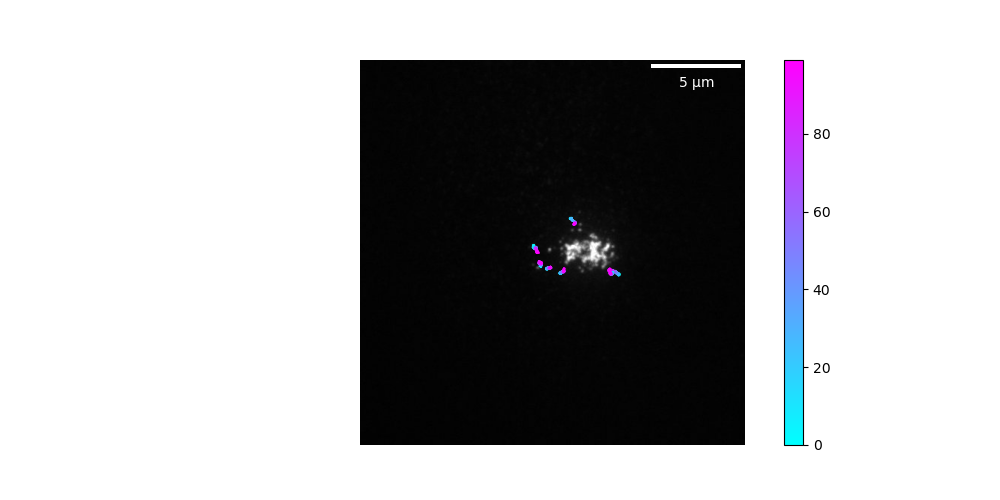

[1.0]


<IPython.core.display.Javascript object>


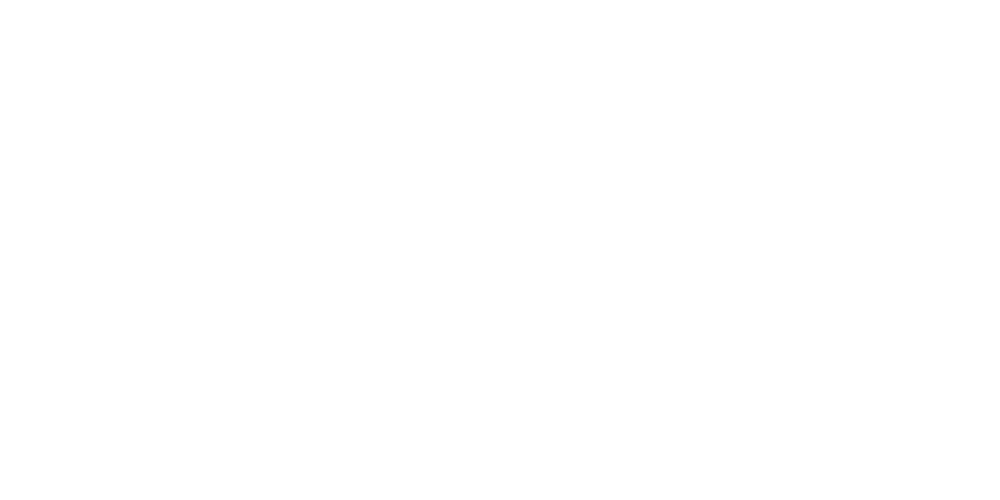

395.9278111838503
0.017522972674163955


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [17]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 8/*.jpg'))
conect=4
mem=5
size=7
mass=80
filt=8


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=40
rmax=90

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()


#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)


<IPython.core.display.Javascript object>


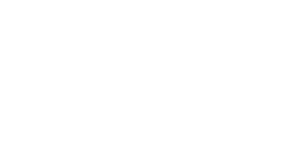

<IPython.core.display.Javascript object>


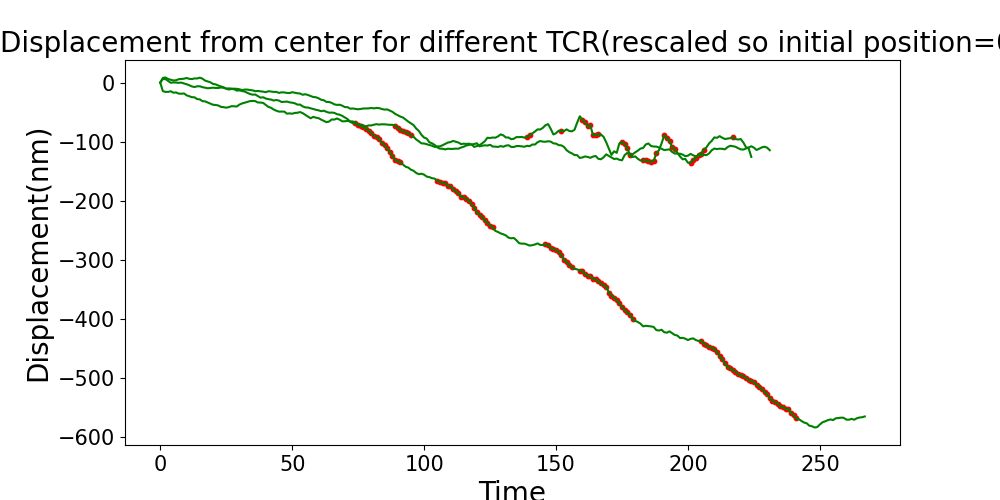

(array([-50.,   0.,  50., 100., 150., 200., 250., 300.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [19]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    
    if len( r_tot[pi])>220 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=c:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

#plt.show() 

In [13]:
print(label)
print(vel_avg)

['Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT']
[61.875012323555985, 61.875012323555985, 49.406882349846605, 37.61168082938814, 38.719786745747776, 49.37142898640791]


Frame 1: 36 features
277.98452053331215 242.89378648178226


<IPython.core.display.Javascript object>


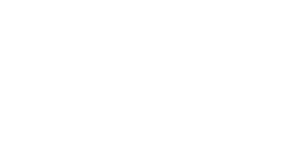

[0.8260869565217391]


<IPython.core.display.Javascript object>


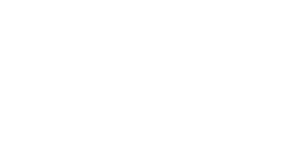

328.62911831436065
0.01863814528062528


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [14]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 3/*.jpg'))
conect=4
mem=5
size=7
mass=60
filt=8


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=40
rmax=80

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()


#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)


Frame 1: 14 features
268.29393362670163 228.45705337923243


<IPython.core.display.Javascript object>


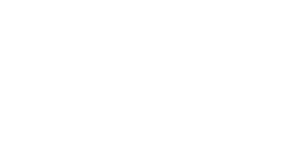

[0.7916666666666666]


<IPython.core.display.Javascript object>


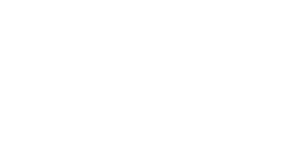

293.93515557675534
0.019807500139445187


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [15]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 2/*.jpg'))
conect=4
mem=4
size=7
mass=70
filt=8


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=20
rmax=70

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()


#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)


Frame 1: 33 features
266.1254259358167 228.4073418511652


<IPython.core.display.Javascript object>


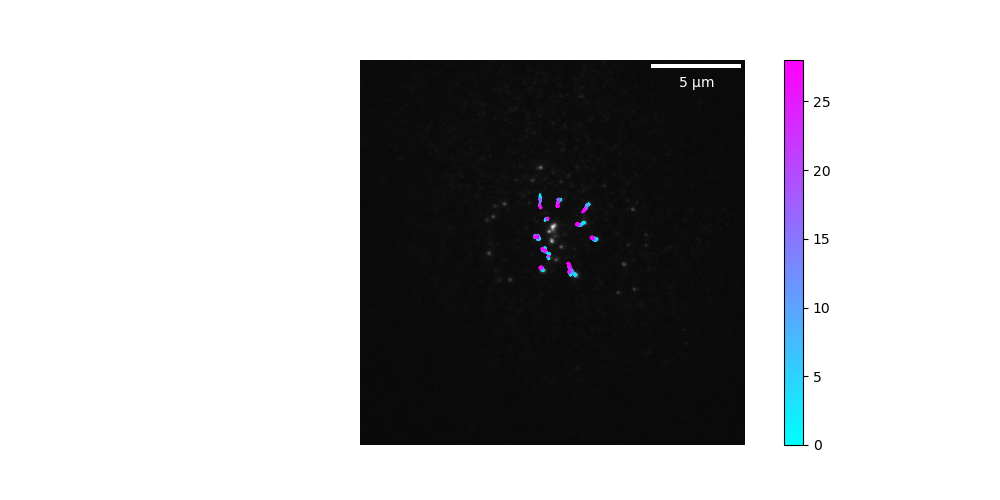

[0.8461538461538461]


<IPython.core.display.Javascript object>


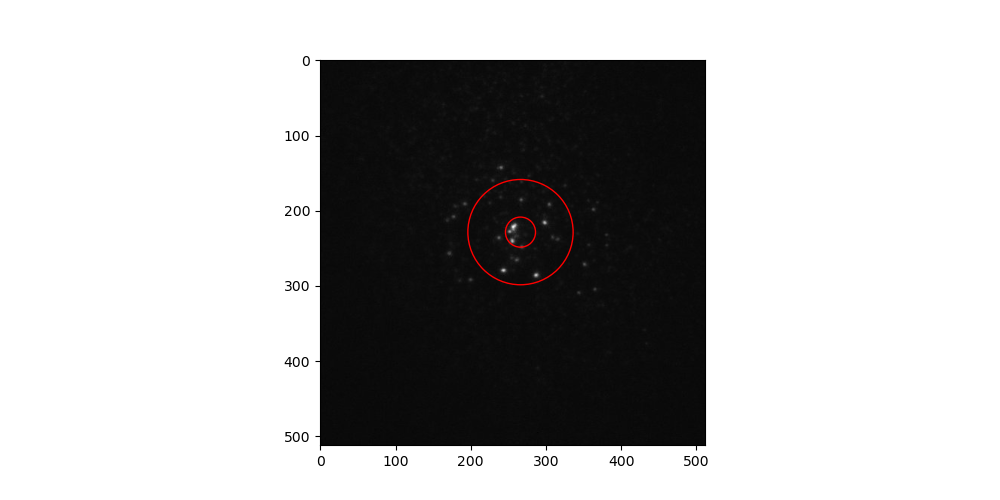

330.83648990660885
0.018220862008405496


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [9]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 1/*.jpg'))
conect=4
mem=4
size=7
mass=70
filt=8


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=20
rmax=70

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()


#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)



<IPython.core.display.Javascript object>


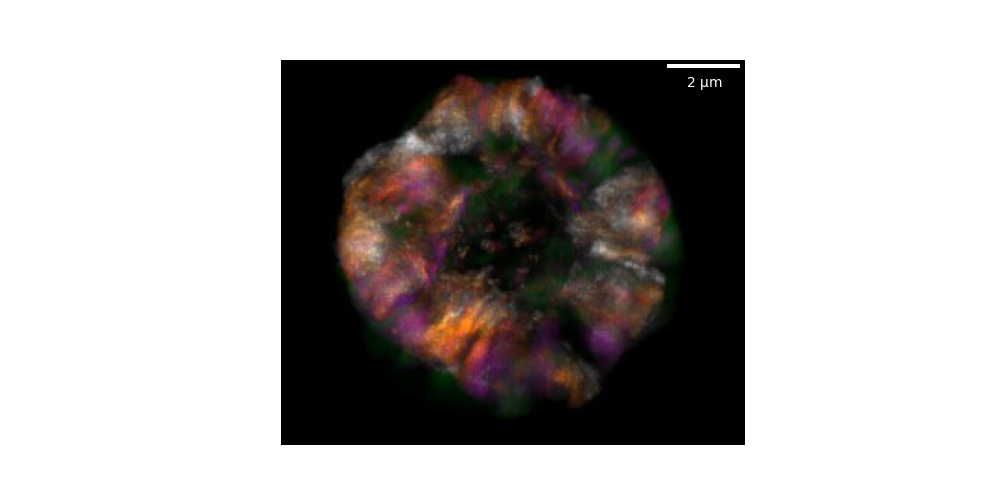

In [4]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 11 d/*.jpg'))

actin = (pims.open('../Documents/more actin inhib/J wt 11 actin/*.jpg'))
conect=4
mem=4
size=7
mass=100
filt=8
fig, ax = plt.subplots()
ax.axis("off")


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(actin[n])
scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


ax.add_artist(scalebar)



Frame 1: 79 features
269.66010761727256 273.664032143072


<IPython.core.display.Javascript object>


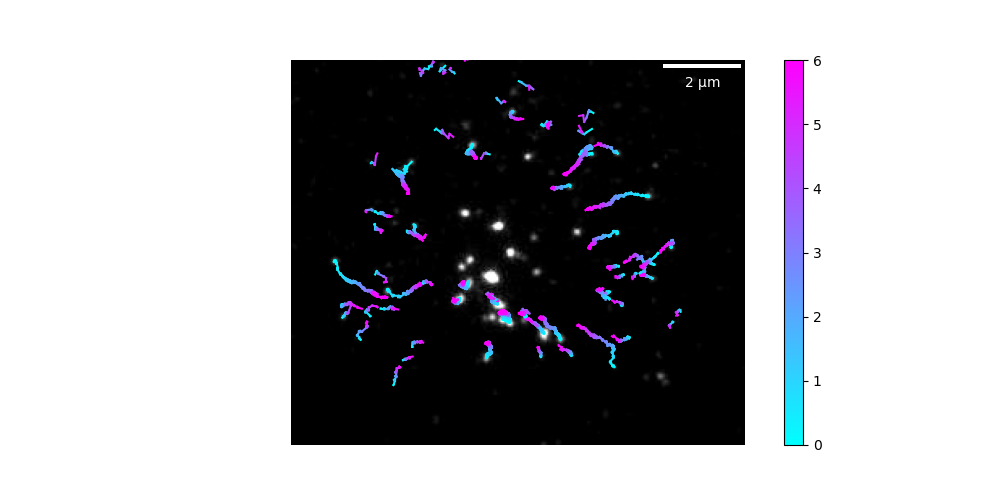

[0.8636363636363636]


<IPython.core.display.Javascript object>


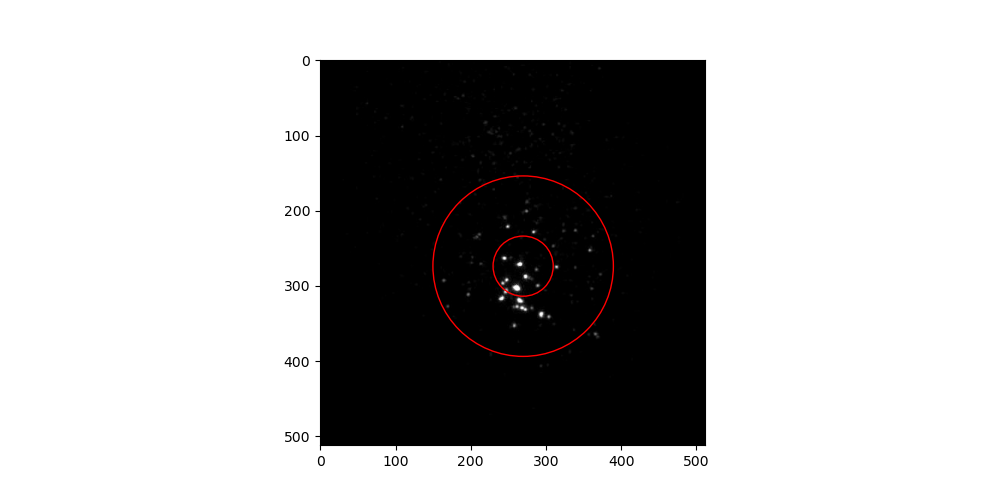

421.92063929023715
0.01597015149529444


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [12]:
def in_out2(min_dist,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax):
    iid_in=[]
    iid_out=[]
    %matplotlib notebook
    V_filtered_list=[]
    fig, ax = plt.subplots()
    ax.axis("off")
    for ind,i in enumerate(iidr):
        
        if ee[ind]>min_dist and ri[ind]>rmin and ri[ind]<rmax:
            #plt.scatter(xe[i],ye[i],color='yellow',s=10)
            df=data.loc[data['particle'] ==i]
            trajx=df['x'].tolist()
            trajy=df['y'].tolist()
            x=trajx
            y=trajy
            c_map = plt.cm.get_cmap('cool')

            # Normalize the color values between 0 and 1
            norm = plt.Normalize(0, len(x) - 1)
    
            # Plot the trajectories with a colormap
            for i in range(len(x) - 1):
                color = c_map(norm(i))
                plt.plot([x[i], x[i+1]], [y[i], y[i+1]], color=color)


            # Add a colorbar to show the fade in between
            sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
            sm.set_array([])
            #cbar = plt.colorbar(sm)


            #plt.xlabel('X')
            #plt.ylabel('Y')
            #plt.title('Particle Trajectories')
       
            for i in range(0,len(iidr)):
        
                if ri[i]>rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                    iid_in.append(i)
                
          
                if ri[i]<rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                
                    iid_out.append(i)
         
    scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


    ax.add_artist(scalebar)


    plt.plot()
    sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm)
    plt.imshow(actin[0]);
    if (len(iid_out)+len(iid_in))!=0:
        ratio_in_out=len(iid_in)/(len(iid_out)+len(iid_in))
    else:
        ratio_in_out=0
    return ratio_in_out,V_filtered_list


%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:,1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/J wt 11/*.jpg'))
conect=5
mem=4
size=7
mass=90
filt=8
fig, ax = plt.subplots()
ax.axis("off")


#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


ax.add_artist(scalebar)


ratio_list=[]
rmin=40
rmax=120

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio_list)
ratios.append(ratio_list[0])
label.append('Jurkat WT')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()


#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))
print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)


y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)




<IPython.core.display.Javascript object>


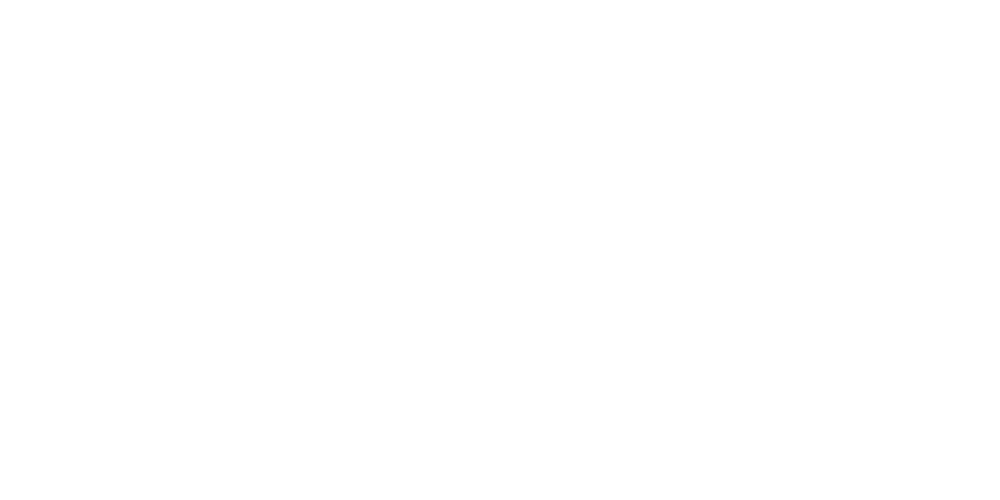

<IPython.core.display.Javascript object>


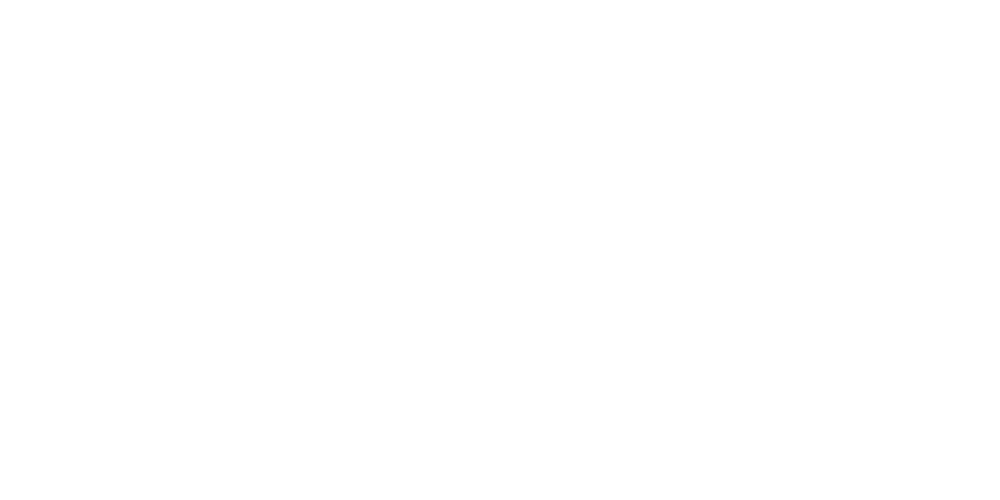

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [19]:
def smooth_list(lst, window_size):
    smoothed = []
    for i in range(len(lst)):
        window_start = max(0, i - window_size + 1)
        window_end = i + 1
        window_values = lst[window_start:window_end]
        window_average = sum(window_values) / len(window_values)
        smoothed.append(window_average)
    return smoothed
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook
ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    if len( r_tot[pi])>100:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='gray')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-5):
            gradient=abs((smoothed_r_rescaled[ind+5]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>50:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
       
        plt.scatter(time,push,color='blue',s=10)

plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

#plt.show() 

In [20]:
print(len(label))
print(len(ratios))
print(label)
print(vel_avg)

10
10
['Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT']
[61.875012323555985, 61.875012323555985, 49.406882349846605, 37.61168082938814, 38.719786745747776, 49.37142898640791, 44.533847596511556, 40.962278527162134, 42.73375668776297, 51.80232127211088]


Frame 1: 46 features
247.23945664103582 216.11034440498196


<IPython.core.display.Javascript object>


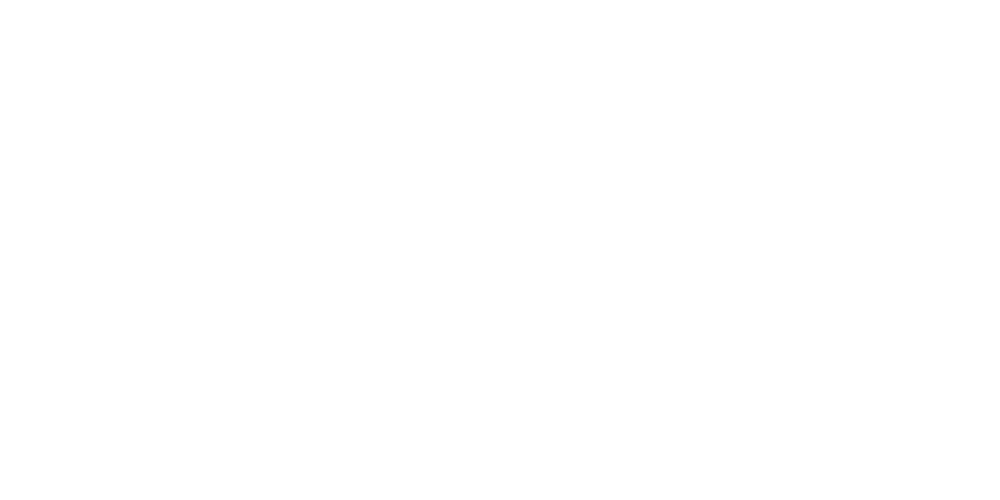

0.8


<IPython.core.display.Javascript object>


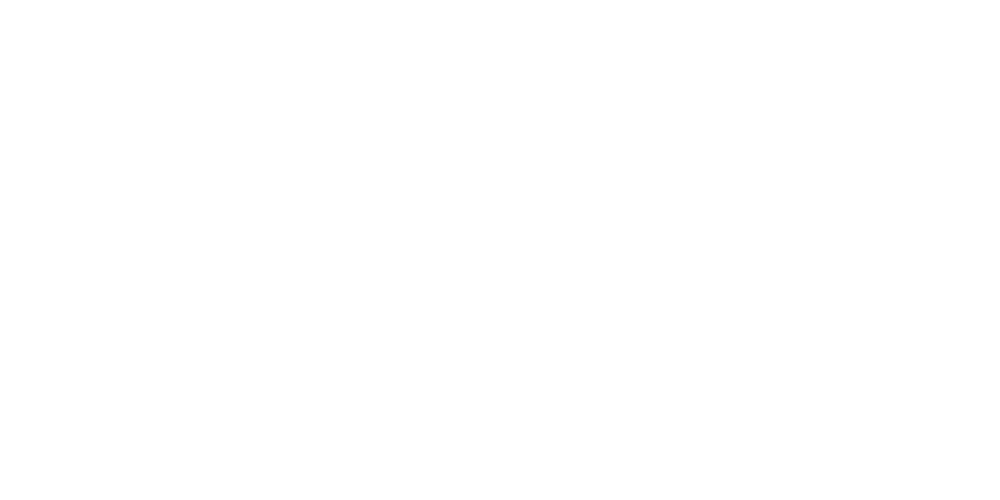

177.39861555782383
0.019305109458249203


In [21]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/jurkat 142232 tcr/*.jpg'))
conect=2
mem=5
size=9
mass=100
filt=7


n=100
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=40
rmax=120

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Jurkat ck666')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 137 features
235.46351006183957 147.1808290564949


<IPython.core.display.Javascript object>


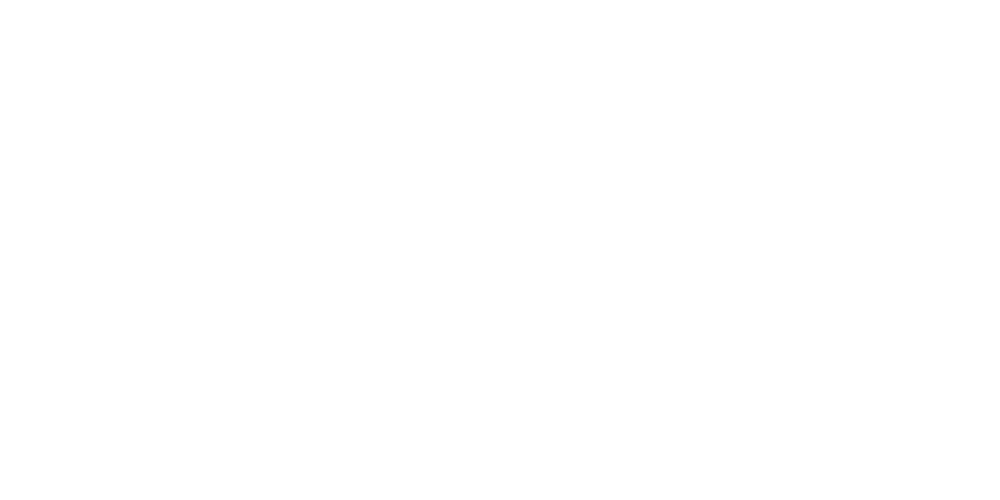

1.0


<IPython.core.display.Javascript object>


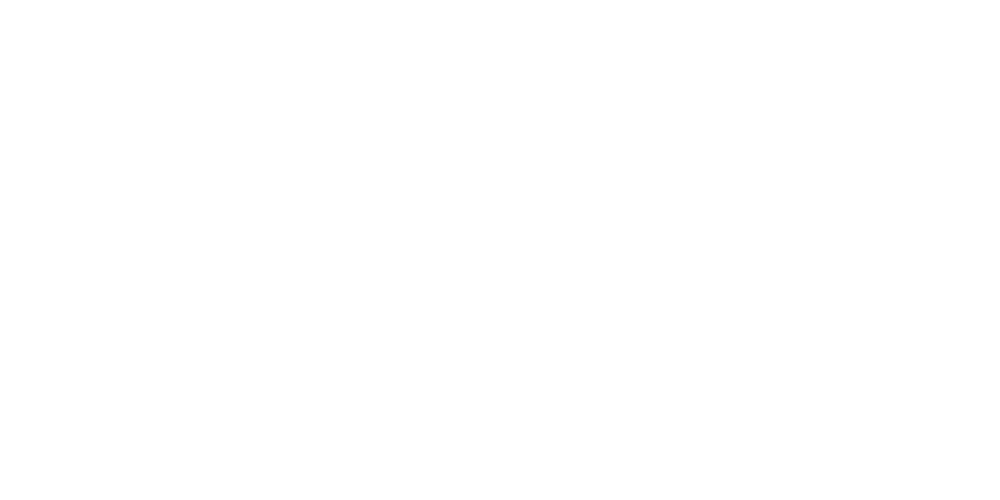

254.6023124786365
0.01806351725910707


In [22]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/jurkat 142500 tcr/*.jpg'))
conect=3
mem=5
size=7
mass=100
filt=5

#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=100
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=80
rmax=160

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Jurkat ck666')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 22 features
140.06316815653057 126.22406590412452


<IPython.core.display.Javascript object>


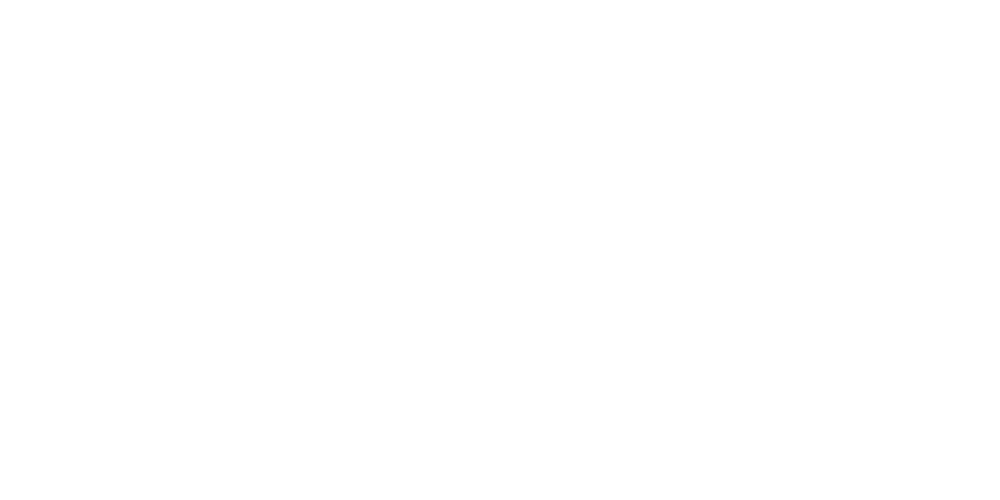

1.0


<IPython.core.display.Javascript object>


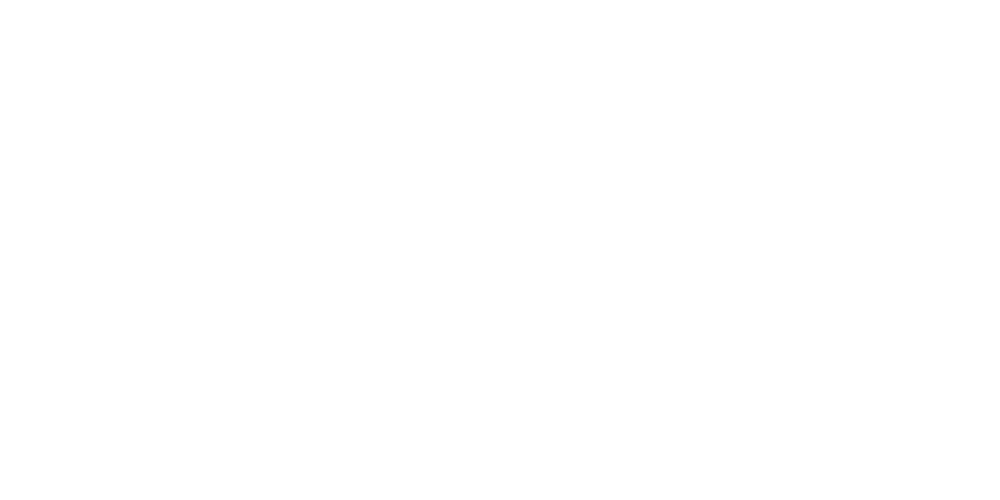

236.41351737860583
0.02267981607453084


In [23]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/jurkat 141818 tcr/*.jpg'))
conect=3
mem=5
size=7
mass=100
filt=5

#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=100
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])


ratio_list=[]
rmin=60
rmax=120

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Jurkat ck666')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)
vel_avg.append(np.mean(Vel))


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 25 features
248.21208651040922 144.5190751389151


<IPython.core.display.Javascript object>


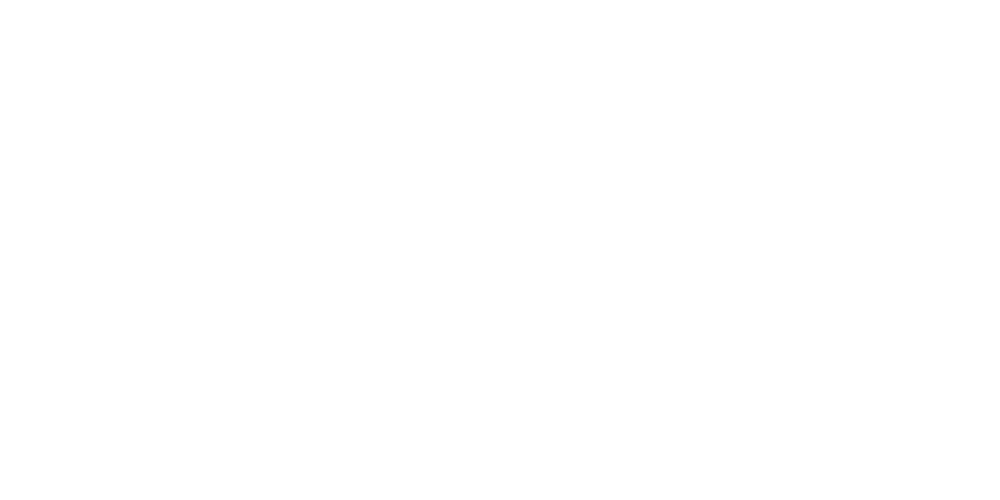

1.0


<IPython.core.display.Javascript object>


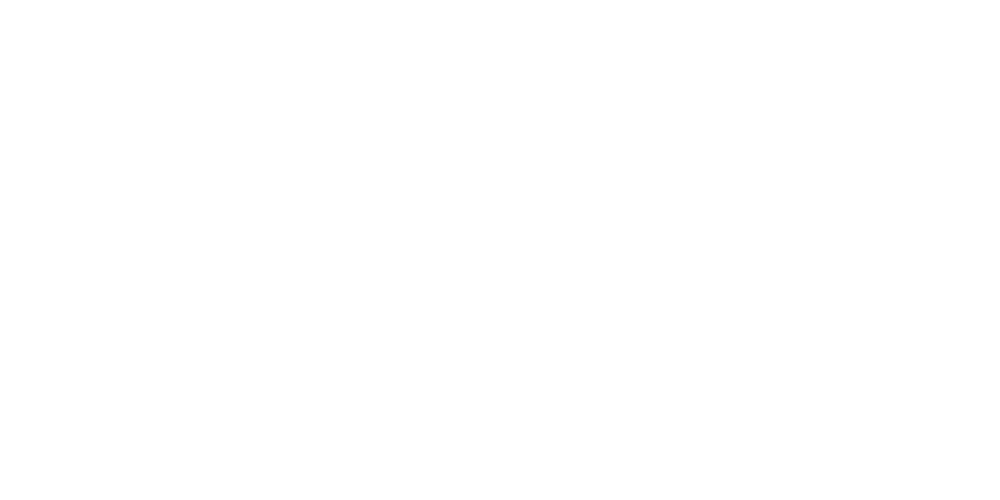

240.53547502552914
0.020107730133111835


In [24]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/jurkat 142752 tcr/*.jpg'))
conect=3
mem=5
size=7
mass=40
filt=5

#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=100
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=60
rmax=120

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Jurkat ck666')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)


In [25]:
print(len(ratios))
print(len(label))
print(len(vel_avg))

14
14
14


In [10]:
##########################################################################################
##########################################################################################
###########################################################################################

 ####                  MOUSE CELLS           #################

#############################################################
print(vel_list)

vel_inout=[]
vel_label=[]

[array([8.6481989]), array([8.6481989])]


<IPython.core.display.Javascript object>


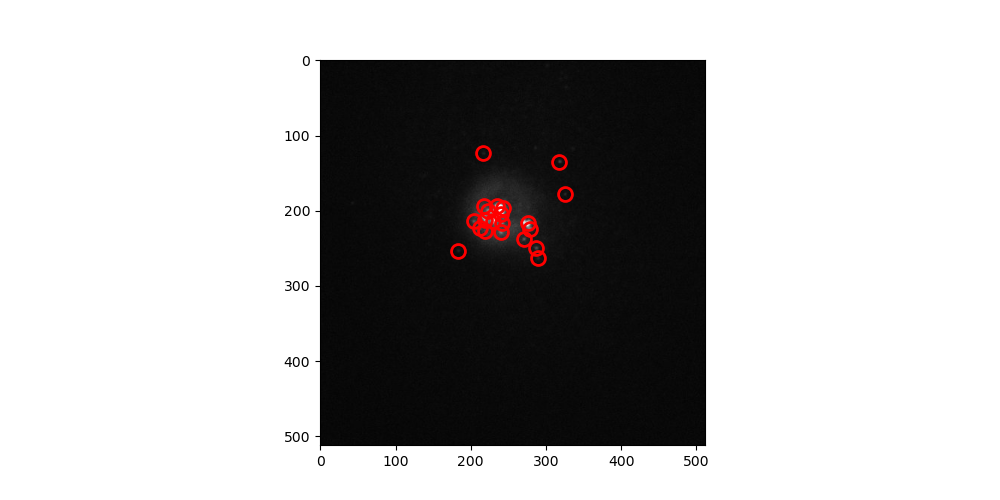

In [11]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 1/*.jpg'))

conect=2
mem=5
size=7
mass=100
filt=10
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

Frame 1: 25 features
237 203


<IPython.core.display.Javascript object>


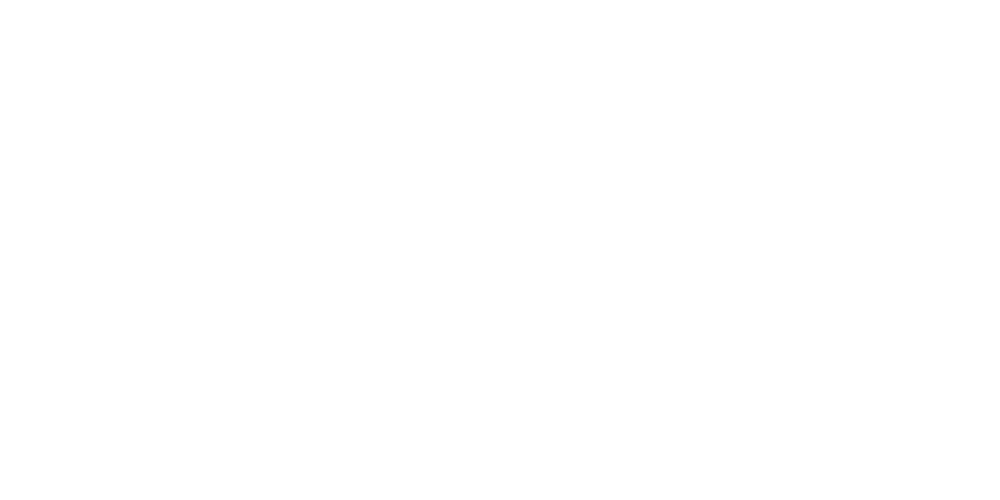

0.6363636363636364


<IPython.core.display.Javascript object>


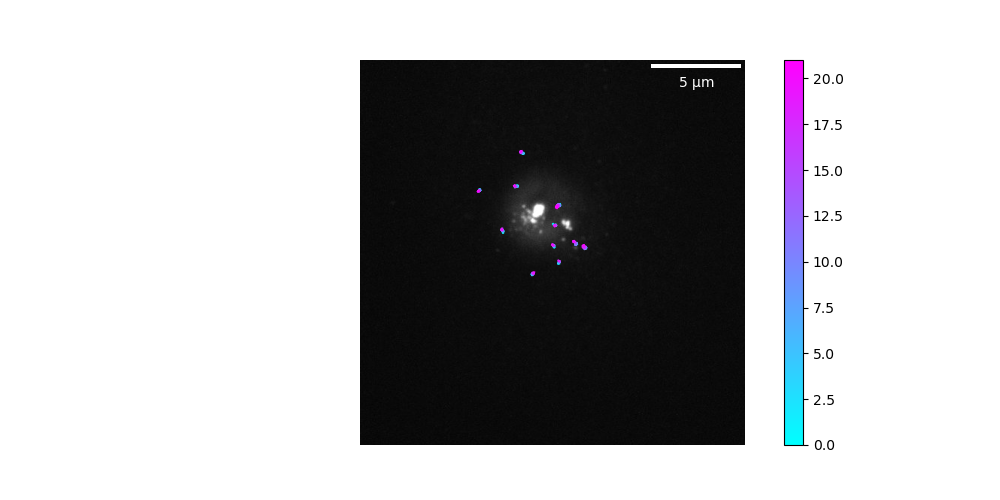

/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


<IPython.core.display.Javascript object>


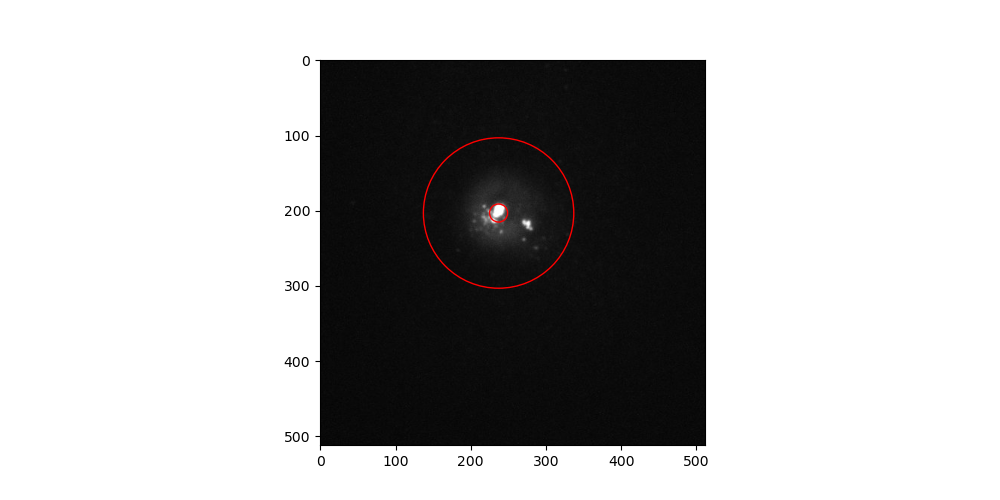

174.26650848143692
0.016713774484286698


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [12]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 1/*.jpg'))

conect=2
mem=5
size=9
mass=30
filt=10
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=12
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
x_cm=237
y_cm=203

plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)

ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)
 
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')

_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')

figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()

y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


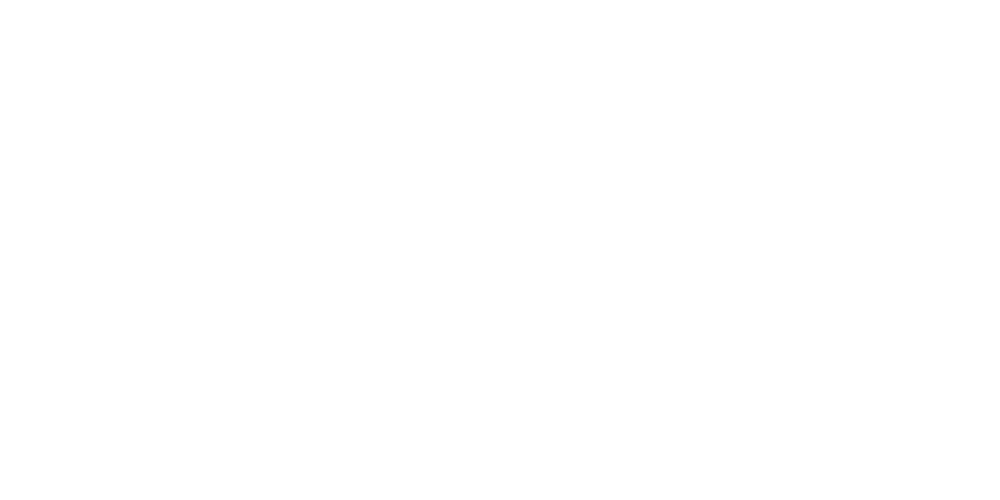

<IPython.core.display.Javascript object>


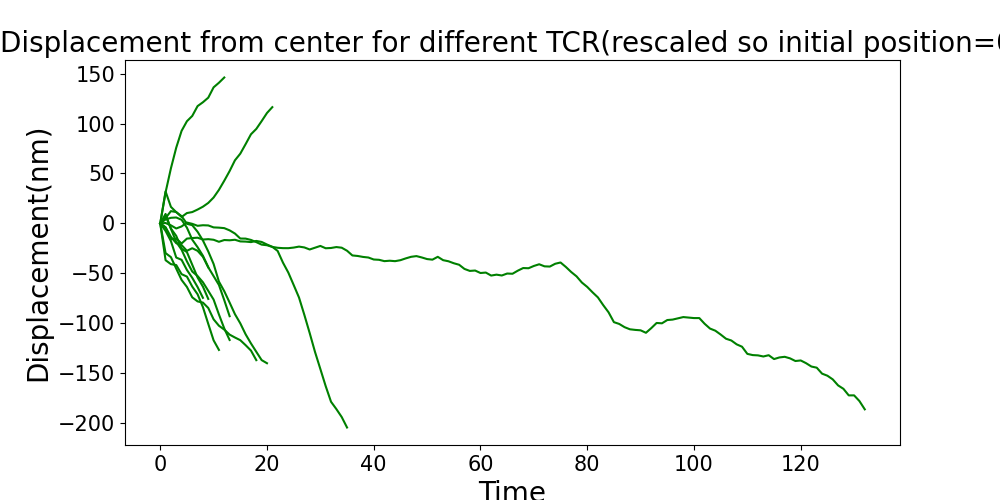

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120., 140.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [13]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    
    if len( r_tot[pi])>3 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=c:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

<IPython.core.display.Javascript object>


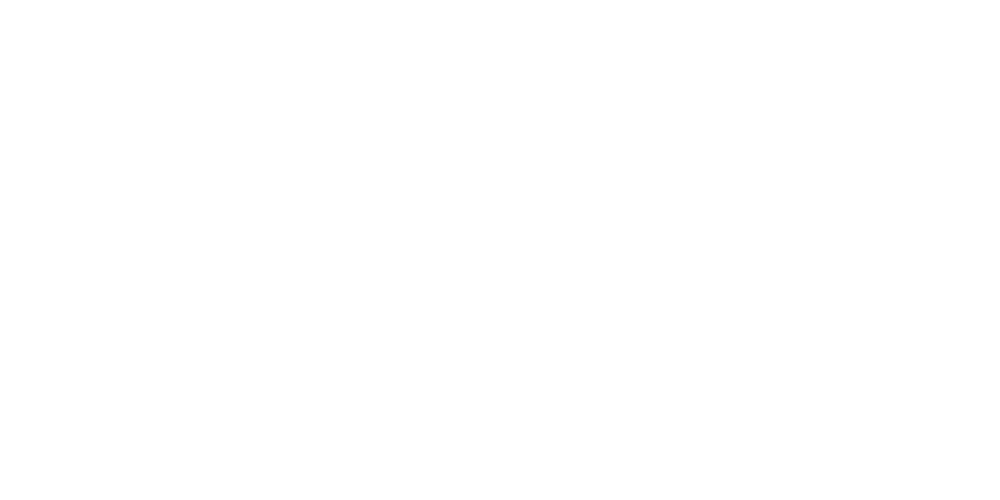

<IPython.core.display.Javascript object>


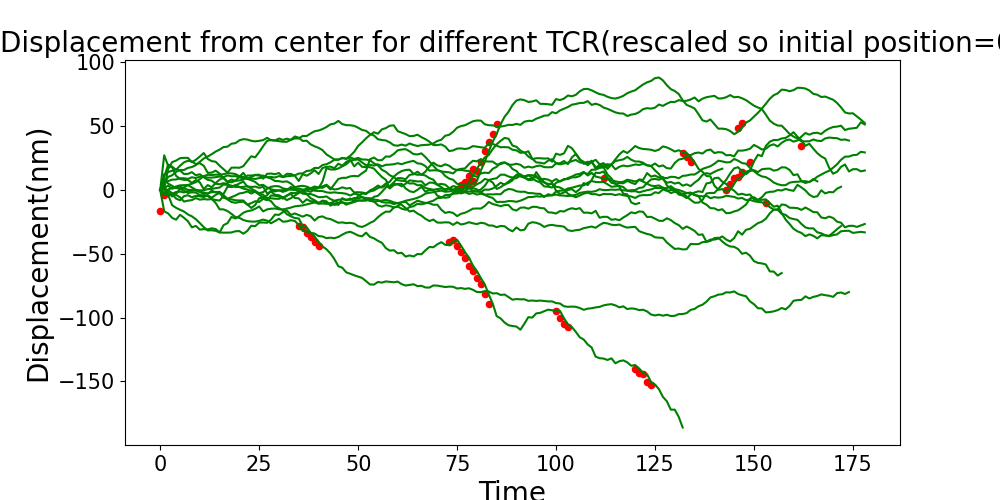

(array([-25.,   0.,  25.,  50.,  75., 100., 125., 150., 175., 200.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [14]:
def smooth_list(lst, window_size):
    smoothed = []
    for i in range(len(lst)):
        window_start = max(0, i - window_size + 1)
        window_end = i + 1
        window_values = lst[window_start:window_end]
        window_average = sum(window_values) / len(window_values)
        smoothed.append(window_average)
    return smoothed
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    if len( r_tot[pi])>120:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>25:
                time.append(ind)
                push.append( smoothed_r_rescaled[ind+1] )
       
        plt.scatter(time,push,color='r',s=20)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

#plt.show() 

Frame 1: 18 features
237 203


<IPython.core.display.Javascript object>


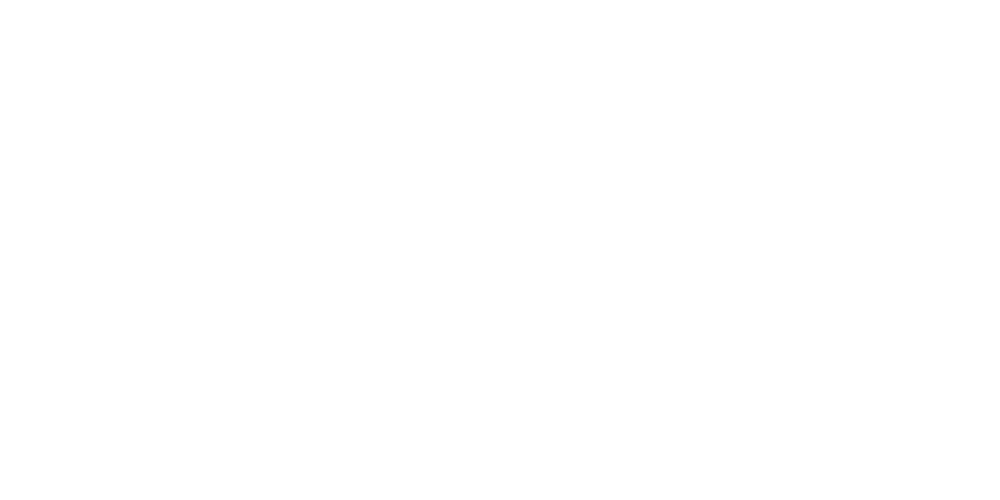

0.6666666666666666


<IPython.core.display.Javascript object>


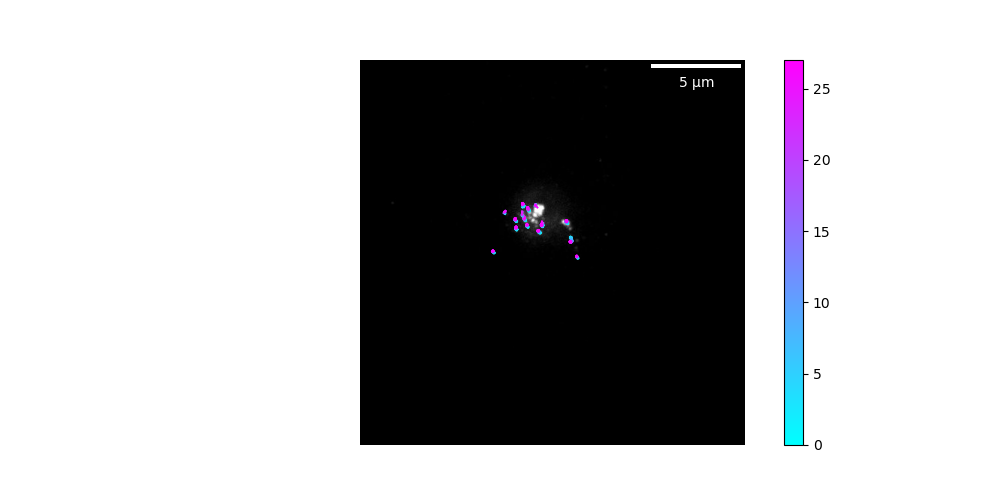

<IPython.core.display.Javascript object>


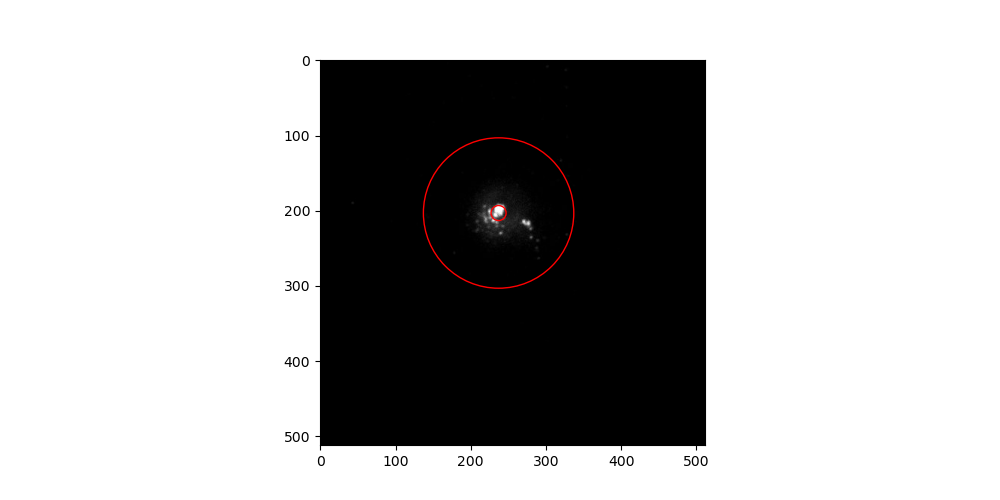

307.98460884810686
0.019976407659925137


In [15]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 2/*.jpg'))

conect=4
mem=5
size=7
mass=70
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=10
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
x_cm=237
y_cm=203
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')

_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)


<IPython.core.display.Javascript object>


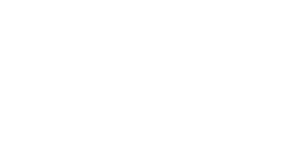

<IPython.core.display.Javascript object>


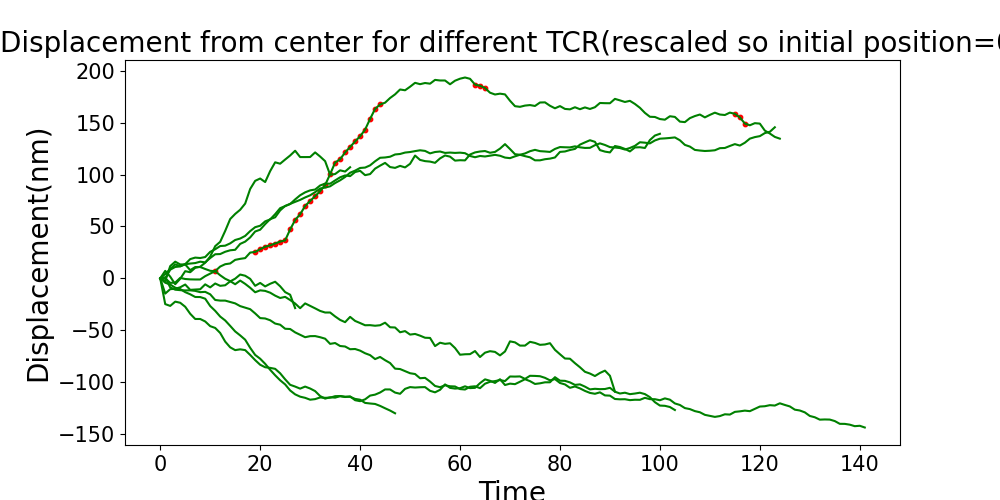

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [39]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    
    if len( r_tot[pi])>1 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=3:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

Frame 1: 52 features
286 266


<IPython.core.display.Javascript object>


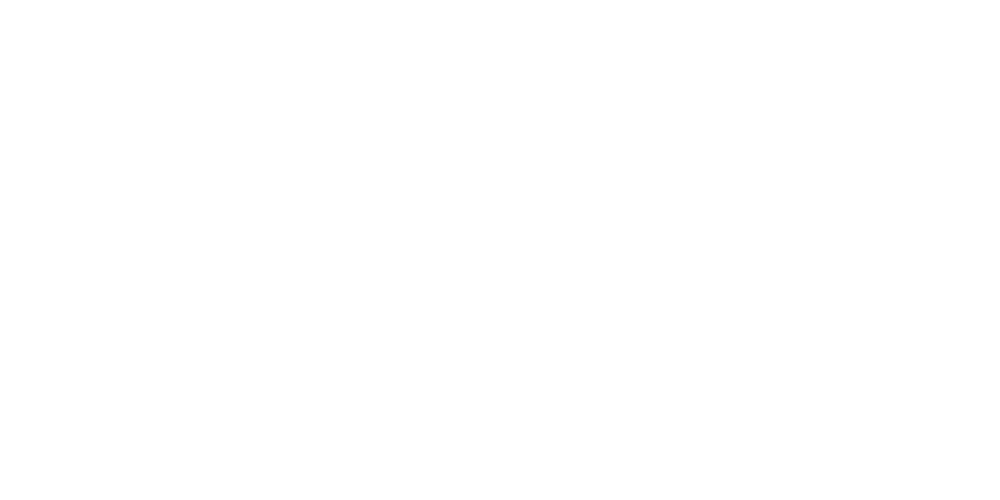

0.41935483870967744


<IPython.core.display.Javascript object>


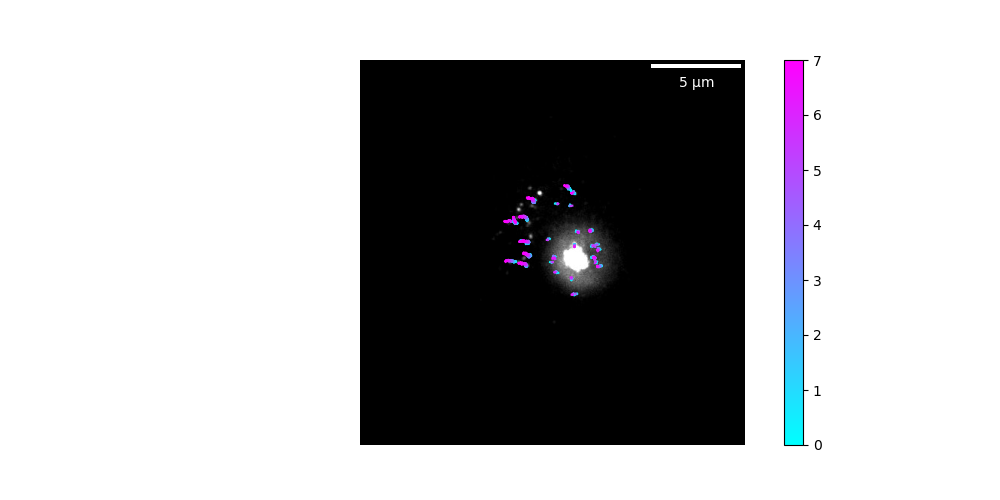

<IPython.core.display.Javascript object>


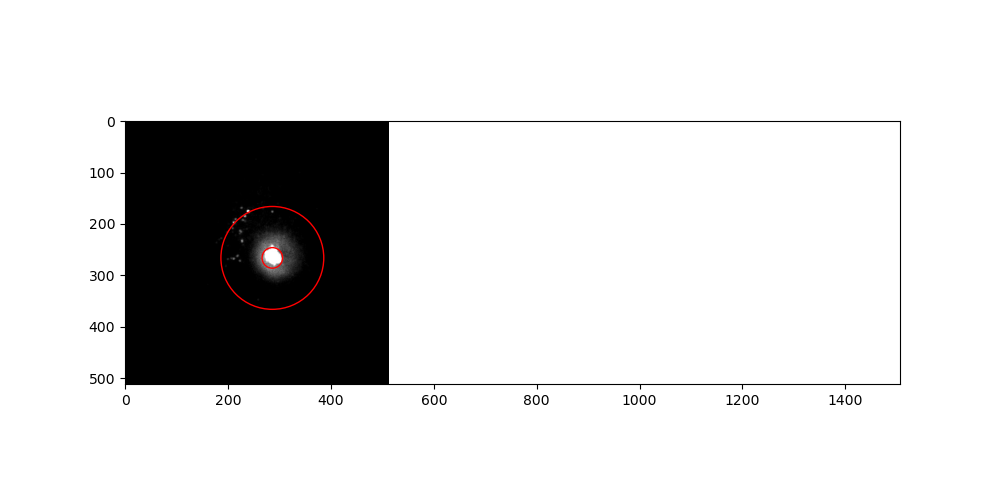

1434.7083867519018
0.01515045409161544


In [40]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 3/*.jpg'))

conect=2
mem=5
size=9
mass=30
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=20
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
x_cm=286
y_cm=266
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')

_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


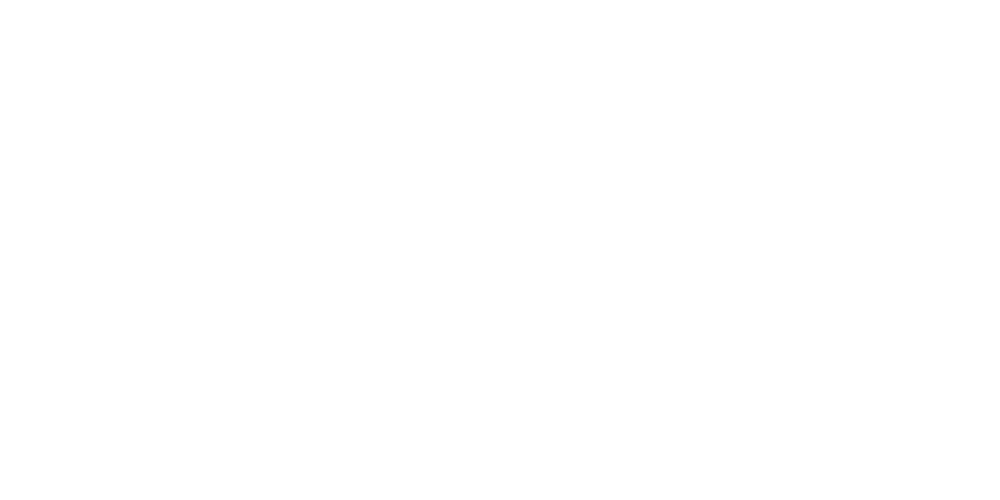

<IPython.core.display.Javascript object>


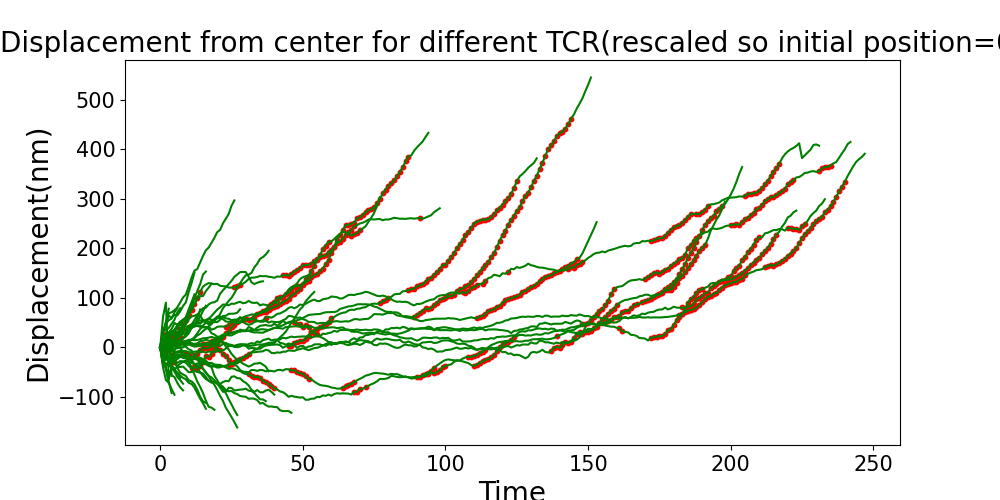

(array([-50.,   0.,  50., 100., 150., 200., 250., 300.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [41]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    
    if len( r_tot[pi])>1 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=3:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

<IPython.core.display.Javascript object>


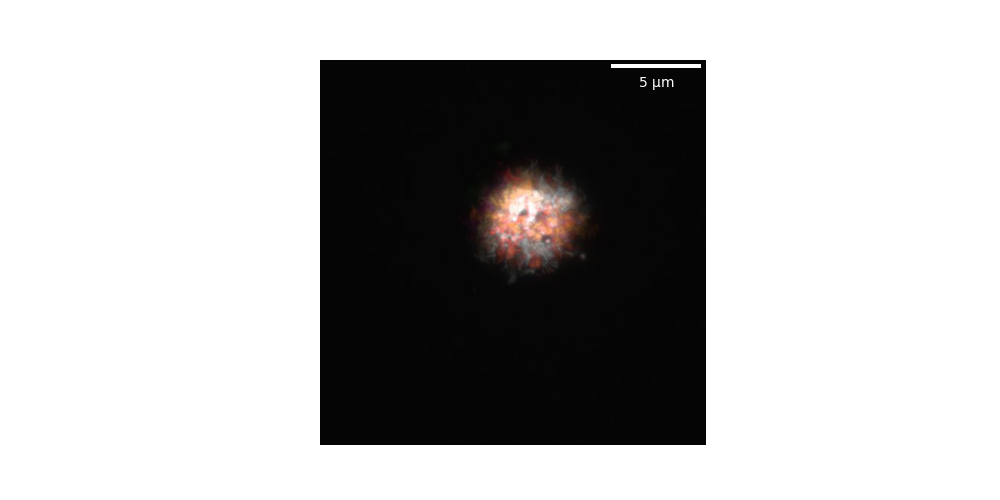

<Frames>
Source: /home/samuel/Documents/more actin inhib/mouse wt 4/*.jpg
Length: 900 frames
Frame Shape: (512, 512)
Pixel Datatype: uint8


In [42]:


%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 4/*.jpg'))
actin=(pims.open('../Documents/more actin inhib/mouse_actin1/*.jpg'))
conect=4
mem=5
size=7
mass=100
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)


fig, ax = plt.subplots()
ax.axis("off")

n=1
f = tp.locate(frames[n],size,minmass=mass)
print(frames)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(actin[n])
# Create scale bar
scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)
ax.add_artist(scalebar)




Frame 1: 40 features
309.0717847728309 234.63406958269002


<IPython.core.display.Javascript object>


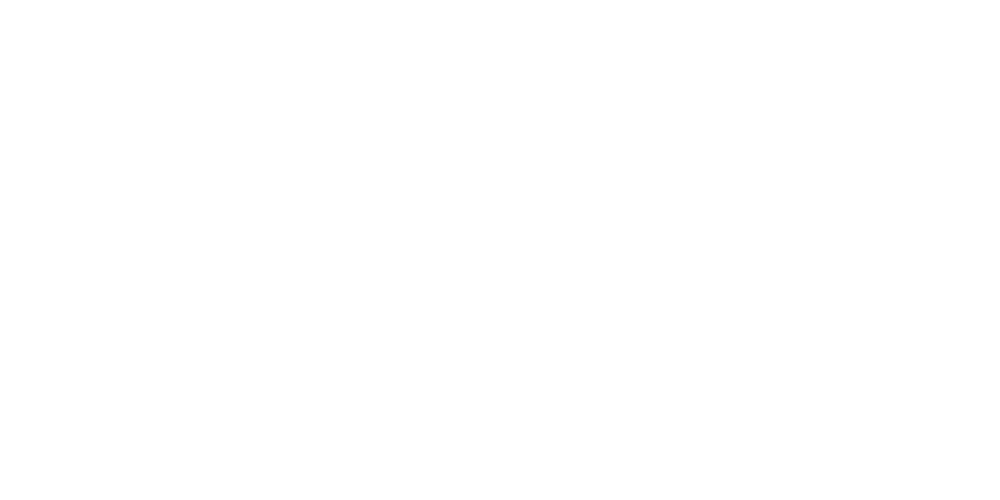

0.8888888888888888


<IPython.core.display.Javascript object>


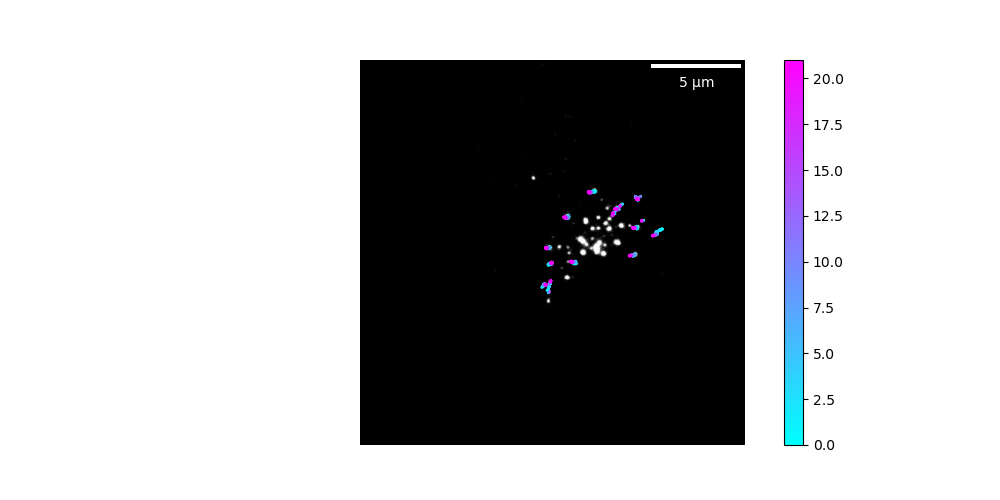

NameError: name 'vel_inout' is not defined

In [9]:
def in_out2(min_dist,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax):
    iid_in=[]
    iid_out=[]
    %matplotlib notebook
    V_filtered_list=[]
    fig, ax = plt.subplots()
    ax.axis("off")
    for ind,i in enumerate(iidr):
        
        if ee[ind]>min_dist and ri[ind]>rmin and ri[ind]<rmax:
            #plt.scatter(xe[i],ye[i],color='yellow',s=10)
            df=data.loc[data['particle'] ==i]
            trajx=df['x'].tolist()
            trajy=df['y'].tolist()
            x=trajx
            y=trajy
            c_map = plt.cm.get_cmap('cool')

            # Normalize the color values between 0 and 1
            norm = plt.Normalize(0, len(x) - 1)
    
            # Plot the trajectories with a colormap
            for i in range(len(x) - 1):
                color = c_map(norm(i))
                plt.plot([x[i], x[i+1]], [y[i], y[i+1]], color=color)


            # Add a colorbar to show the fade in between
            sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
            sm.set_array([])
            #cbar = plt.colorbar(sm)


            #plt.xlabel('X')
            #plt.ylabel('Y')
            #plt.title('Particle Trajectories')
       
            for i in range(0,len(iidr)):
        
                if ri[i]>rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                    iid_in.append(i)
                
          
                if ri[i]<rf[i] and ee[i]>min_dist and ri[i]>rmin and ri[i]<rmax:
                
                    iid_out.append(i)
         
    scalebar = ScaleBar(41.7, "nm", scale_loc='bottom', length_fraction=0.25, color='white', box_alpha=0)


    ax.add_artist(scalebar)


    plt.plot()
    sm = plt.cm.ScalarMappable(cmap=c_map, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm)
    plt.imshow(actin[0]);
    if (len(iid_out)+len(iid_in))!=0:
        ratio_in_out=len(iid_in)/(len(iid_out)+len(iid_in))
    else:
        ratio_in_out=0
    return ratio_in_out,V_filtered_list


ratio_list=[]
rmin=40
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)
conect=5
mem=4
size=7
mass=80
filt=11
ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)


plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c+1,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')


_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')

figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)



In [ ]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 4/*.jpg'))

conect=4
mem=5
size=9
mass=70
filt=11
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=40
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
x_cm=286

plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()


_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


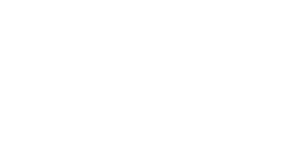

<IPython.core.display.Javascript object>


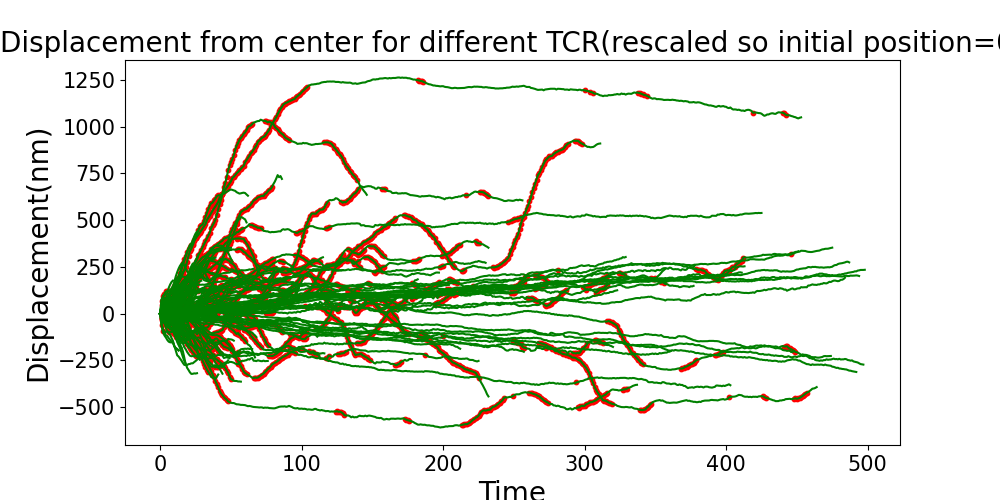

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [46]:
def smooth_list(lst, window_size):
    smoothed = []
    for i in range(len(lst)):
        window_start = max(0, i - window_size + 1)
        window_end = i + 1
        window_values = lst[window_start:window_end]
        window_average = sum(window_values) / len(window_values)
        smoothed.append(window_average)
    return smoothed
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    
    if len( r_tot[pi])>1 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=3.5:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

Frame 1: 17 features
237.13087255248206 229.8573282063431


<IPython.core.display.Javascript object>


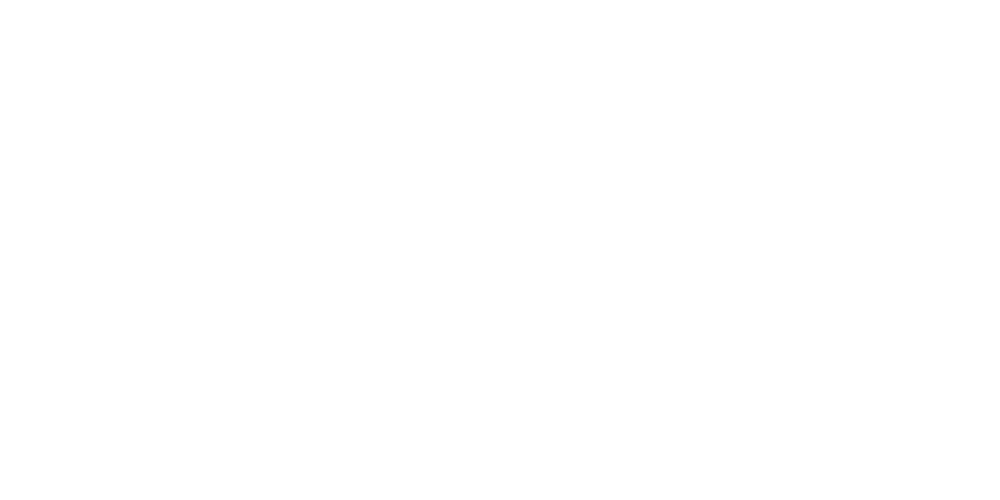

0.8888888888888888


<IPython.core.display.Javascript object>


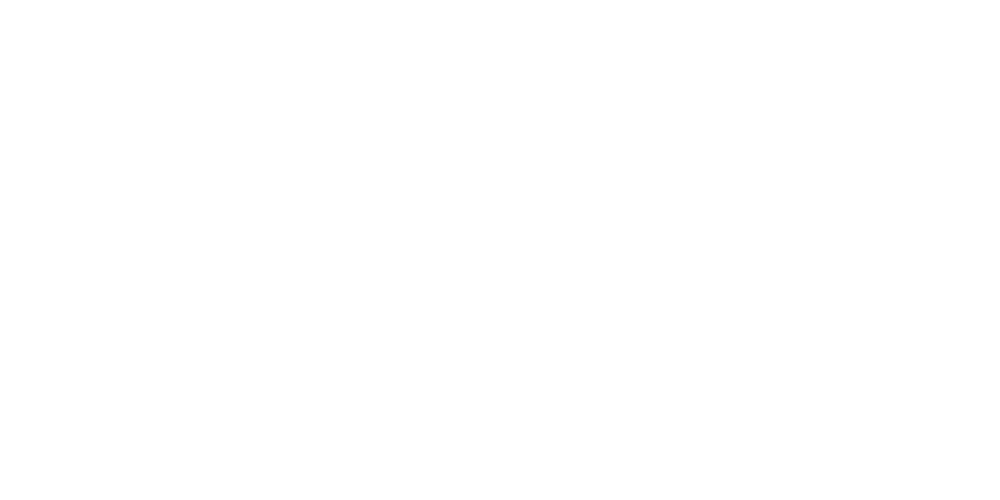

<IPython.core.display.Javascript object>


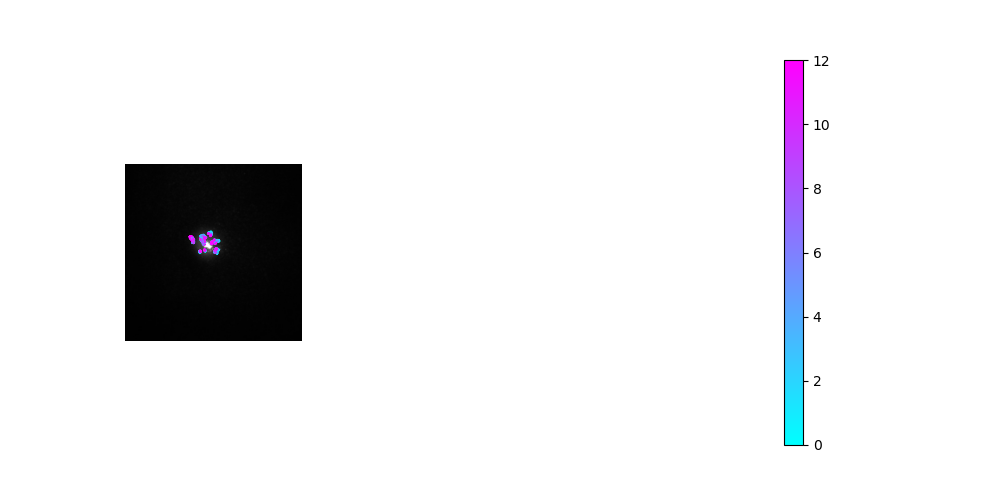

61.88864906683489


In [49]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 6/*.jpg'))

conect=3
mem=5
size=7
mass=80
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=20
rmax=80

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)

ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)



<IPython.core.display.Javascript object>


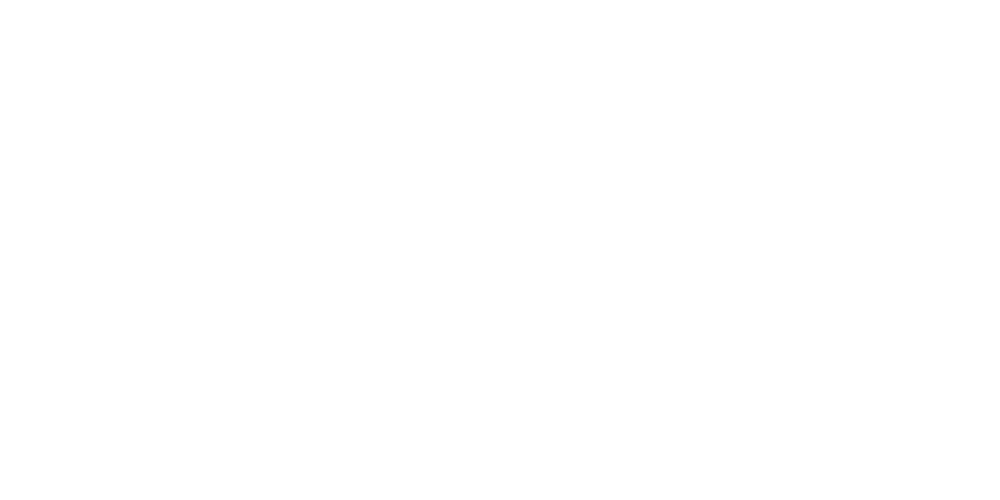

<IPython.core.display.Javascript object>


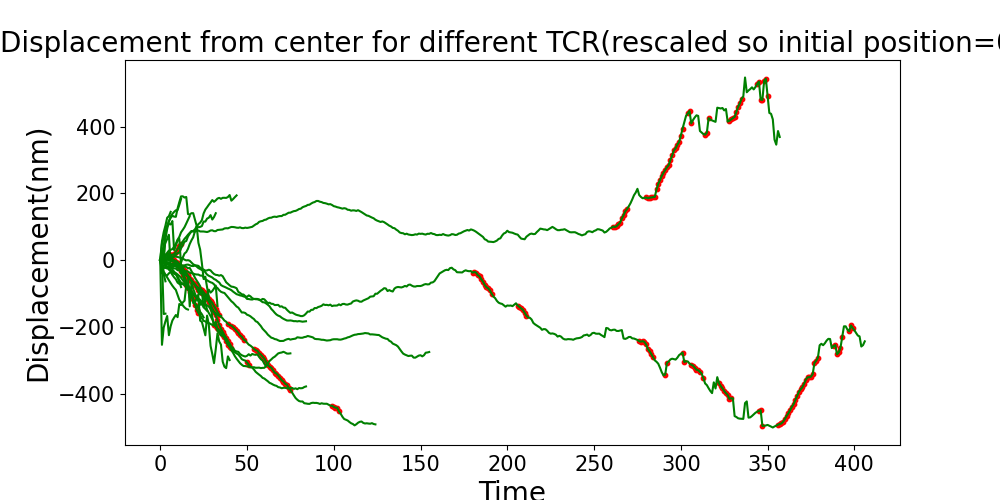

(array([-50.,   0.,  50., 100., 150., 200., 250., 300., 350., 400., 450.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [52]:
def smooth_list(lst, window_size):
    smoothed = []
    for i in range(len(lst)):
        window_start = max(0, i - window_size + 1)
        window_end = i + 1
        window_values = lst[window_start:window_end]
        window_average = sum(window_values) / len(window_values)
        smoothed.append(window_average)
    return smoothed
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    
    if len( r_tot[pi])>1 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=3:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>40:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>30:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

Frame 1: 15 features
243.7149595390869 303.8687678546815


<IPython.core.display.Javascript object>


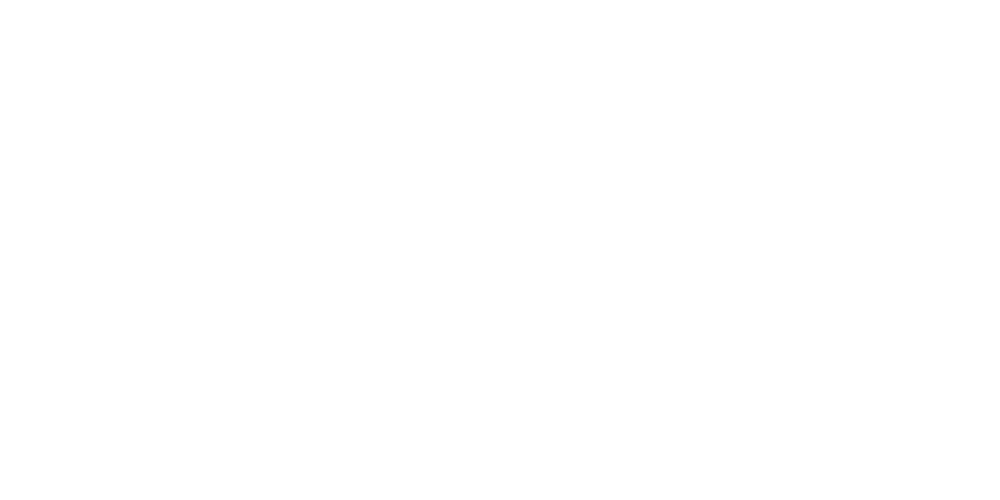

0.5


<IPython.core.display.Javascript object>


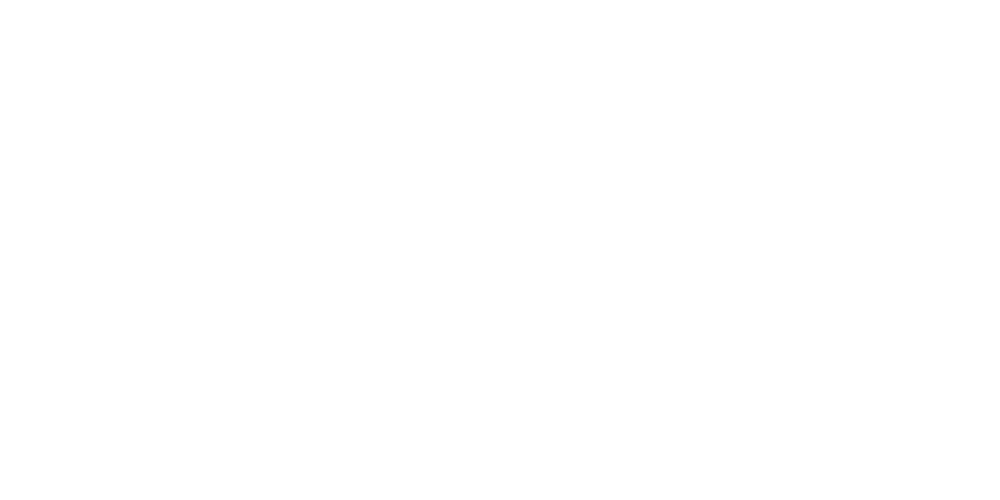

<IPython.core.display.Javascript object>


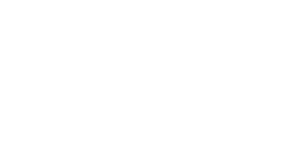

35.46551347410236


In [38]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 8/*.jpg'))

conect=2
mem=5
size=9
mass=30
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=20
rmax=80

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)

ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')


_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 28 features
296.9609059608521 273.60927830462083


<IPython.core.display.Javascript object>


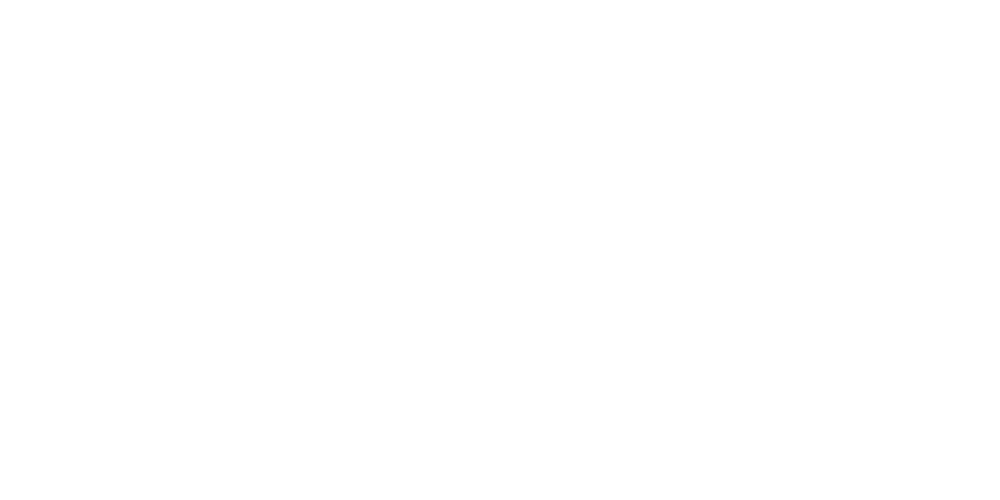

0.6666666666666666


<IPython.core.display.Javascript object>


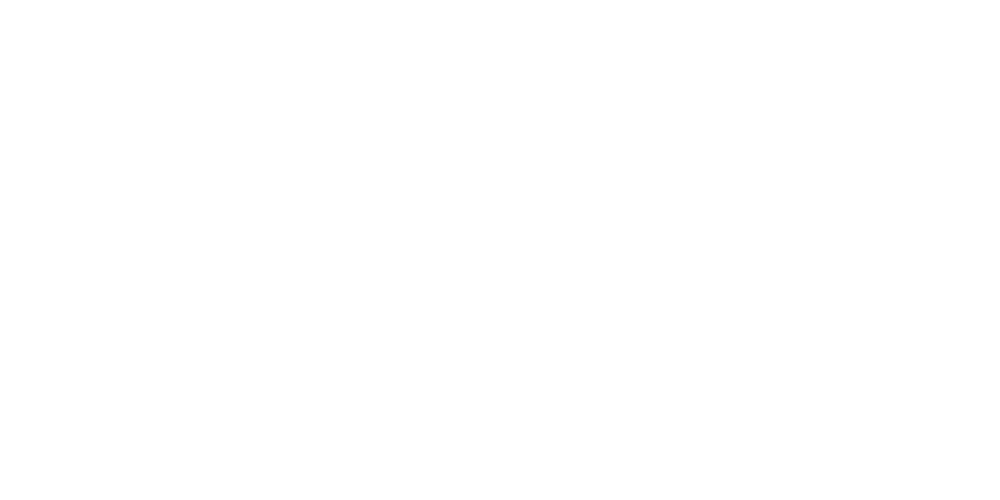

<IPython.core.display.Javascript object>


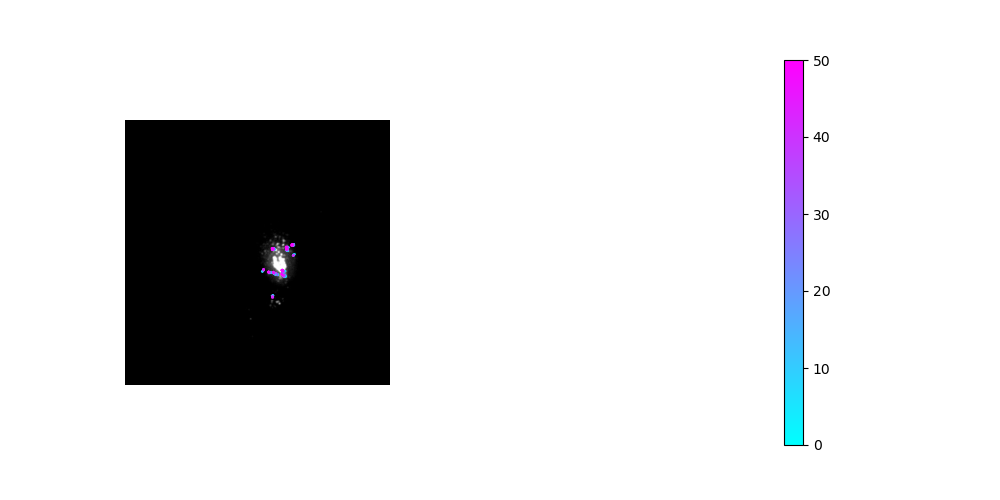

41.84811229816216


In [53]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 9/*.jpg'))

conect=2
mem=3
size=7
mass=50
filt=8
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=20
rmax=70

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)

ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()


_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')



#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


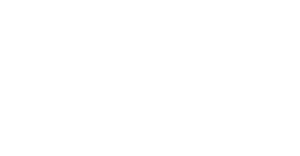

<IPython.core.display.Javascript object>


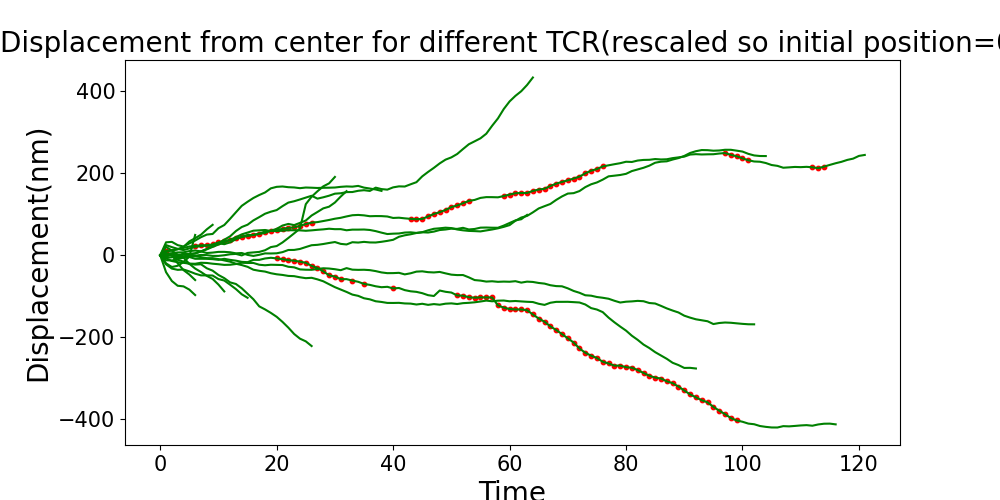

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120., 140.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [55]:
fig, ax = plt.subplots()
window_size=10
%matplotlib notebook

ri2,rf2,iidr2,r_tot=find_rad_distance2(data,x_cm,y_cm)
for pi in range(len(r_tot)):
    
    if len( r_tot[pi])>1 and np.abs(r_tot[pi][0]-r_tot[pi][-1])>=3:
        r_rescaled=[(i-r_tot[pi][0])*41.7 for i in r_tot[pi]]
        smoothed_r_rescaled = smooth_list(r_rescaled, window_size)
        plt.plot(smoothed_r_rescaled,color='green')
        time=[]
        push=[]
        for ind in range(len(smoothed_r_rescaled)-8):
            gradient=abs((smoothed_r_rescaled[ind+8]-smoothed_r_rescaled[ind]))
           # print(gradient)
            if gradient>20:
                time.append(ind+1)
                push.append( smoothed_r_rescaled[ind+1] )
        if len(push)>50:
            plt.scatter(time,push,color='r',s=10)


        
plt.xlabel('Time',fontsize=20, fontname='Arial')
plt.ylabel('Displacement(nm)', fontsize=20, fontname='Arial')
plt.title('Displacement from center for different TCR(rescaled so initial position=0)', fontsize=20, fontname='Arial')

#ax.set_ylabel('radial distance(nm)(rescaled so initial position=0)', fontsize=20, fontname='Arial')
#ax.set_xlabel('time', fontsize=20, fontname='Arial')
#ax.set_title('Radial Distance for different TCR', fontsize=20, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.xticks(fontsize=15, fontname='Arial')

Frame 1: 129 features
271.69923182480295 223.64219919044095


<IPython.core.display.Javascript object>


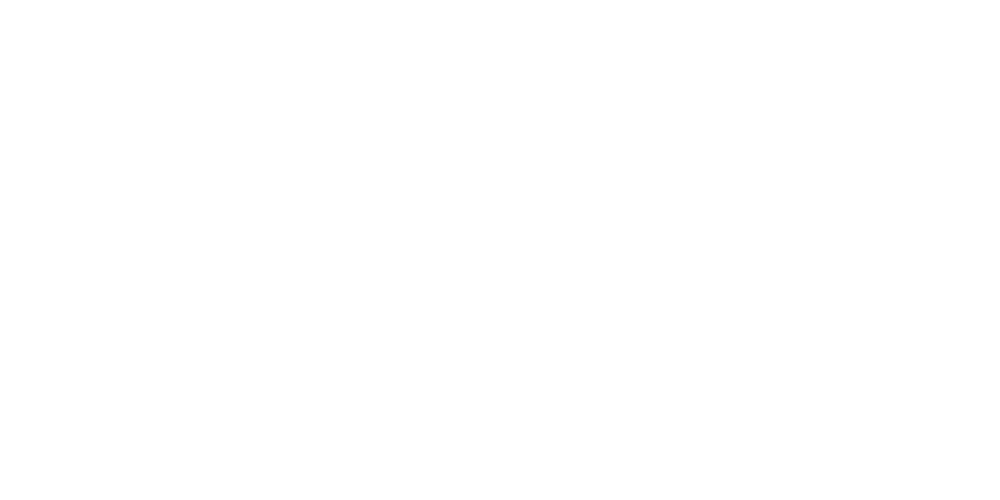

0.5


<IPython.core.display.Javascript object>


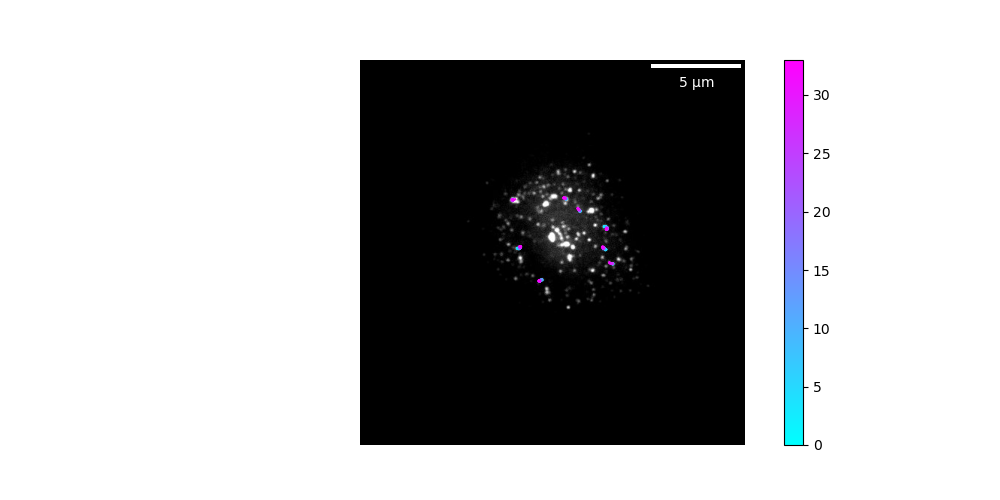

NameError: name 'vel_inout' is not defined

In [5]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 10/*.jpg'))

conect=2
mem=3
size=7
mass=100
filt=8
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=30
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)

ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')


_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')



figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 90 features
202.02072416304676 175.26581001283114


<IPython.core.display.Javascript object>


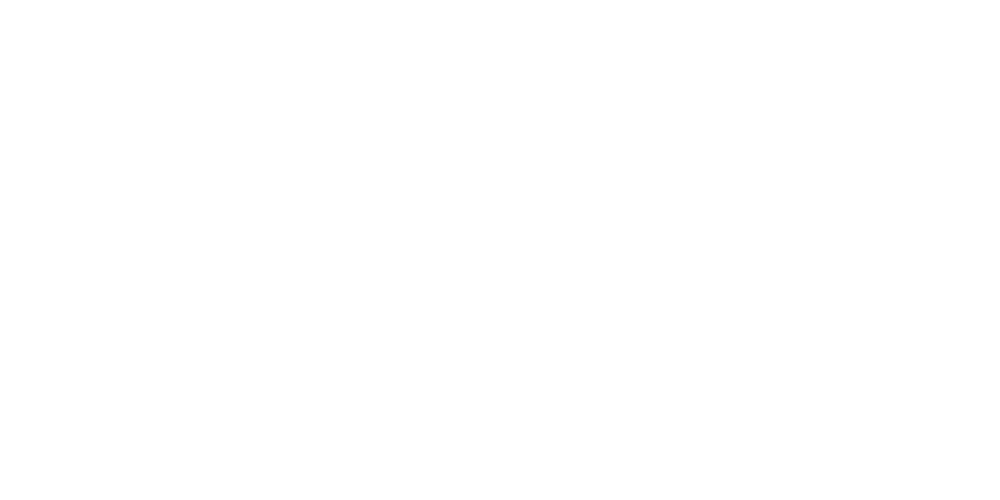

0.35714285714285715


<IPython.core.display.Javascript object>


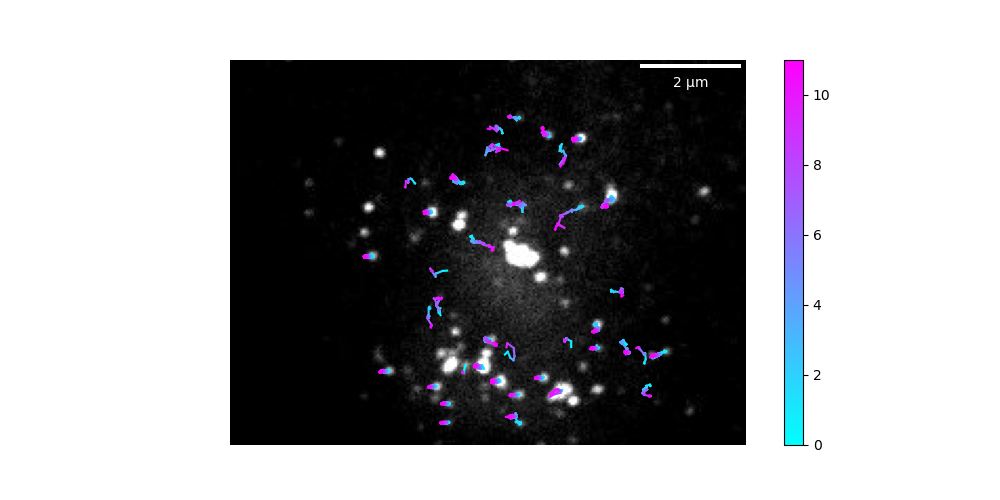

<IPython.core.display.Javascript object>


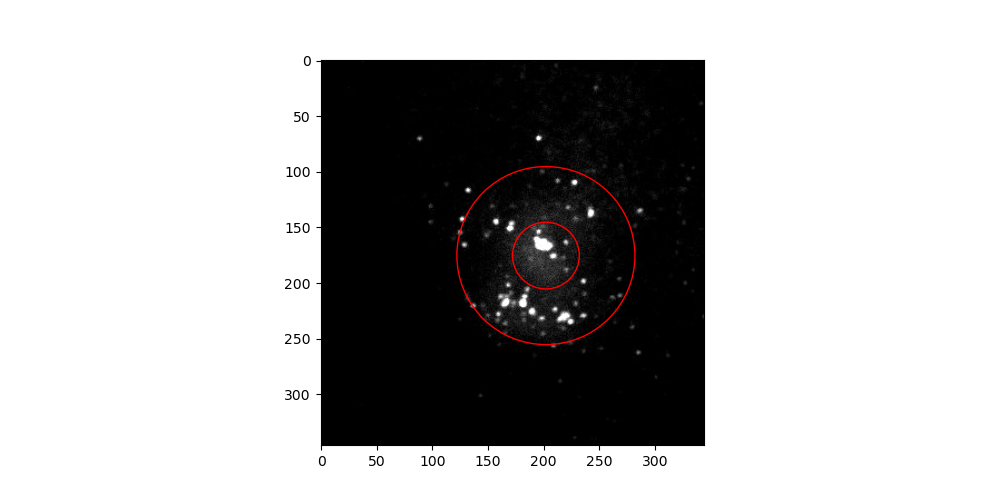

40.71289969723291


In [8]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse wt 11/*.jpg'))

conect=4
mem=3
size=7
mass=80
filt=8
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=30
rmax=80

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)

ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse Wt')


_,V_inout=in_out_vels(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax) 
vel_inout.append(np.mean(V_inout[0]))
vel_label.append('in')
vel_inout.append(np.mean(V_inout[1]))
vel_label.append('out')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

<IPython.core.display.Javascript object>


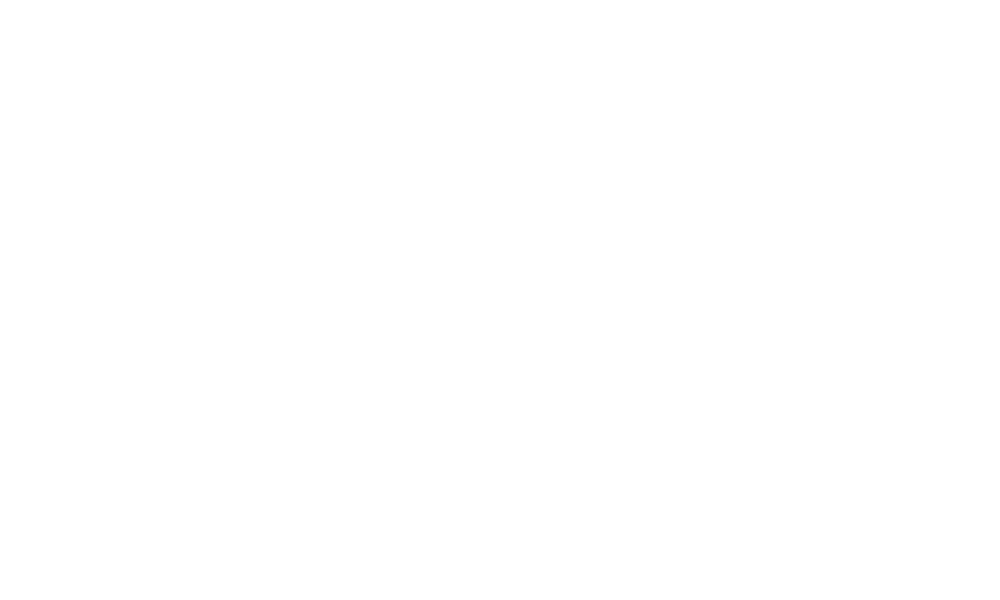

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.font_manager import FontProperties

# Sample data: Replace these with your actual data
values = vel_inout
strings = vel_label # Assuming labels is your list of labels

# Create a DataFrame from your data
data = pd.DataFrame({'strings': strings, 'values': values})

# Create a custom palette dictionary
custom_palette = {}
custom_palette_scatter = {}
for l in strings:
    if l.startswith('in'):
        custom_palette[l] = '#FF00FF'
        custom_palette_scatter[l] = '#990012'
    elif l.startswith('out'):
        custom_palette[l] = '#56A5EC'
        custom_palette_scatter[l] = '#7FFFD4'
    else:
        custom_palette[l] = 'gray'  # Assign a default color for other labels

# Set the font properties for labels and titles
font_properties = FontProperties(family='Arial', size=25)

# Create a violin plot using Seaborn with the custom palette
plt.figure(figsize=(10, 6))
sns.violinplot(x='strings', y='values', data=data, palette=custom_palette)

# Overlay a swarmplot to show individual data points
sns.swarmplot(x='strings', y='values', data=data, palette=custom_palette_scatter, alpha=0.5, size=10)


# Create legend handles
red_patch = plt.Line2D([0], [0], color='#F67280', lw=5, label='Jurkat')
blue_patch = plt.Line2D([0], [0], color='#56A5EC', lw=5, label='Mice')

# Create the plot
ax = plt.gca()

# Set legend font properties
#ax.legend(handles=[red_patch, blue_patch], fontsize=10, title_fontsize=15, prop=font_properties)

# Set title and axis labels with updated font properties
#plt.title('Violin and Swarm Plot by Group', fontproperties=font_properties)
plt.xlabel('Group', fontproperties=font_properties)
plt.ylabel('TCR Velocity (nm/s)', fontproperties=font_properties)
#plt.ylim(0,60)
ax.tick_params(axis='both', labelsize=15)
# Show the plot
plt.show()

In [43]:
print(len(ratios))
print(len(label))
print(len(vel_avg))

24
24
24


<IPython.core.display.Javascript object>


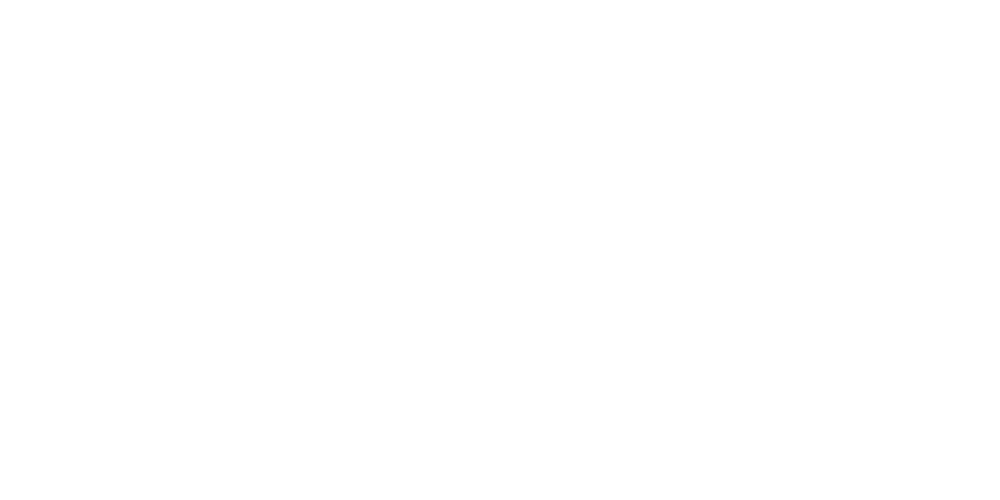

In [44]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse 154035 tcr/*.jpg'))

conect=2
mem=5
size=11
mass=100
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=100
f = tp.locate(frames[n],size,minmass=mass)
tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])


Frame 1: 17 features
267.01244259512754 212.72493258537304


<IPython.core.display.Javascript object>


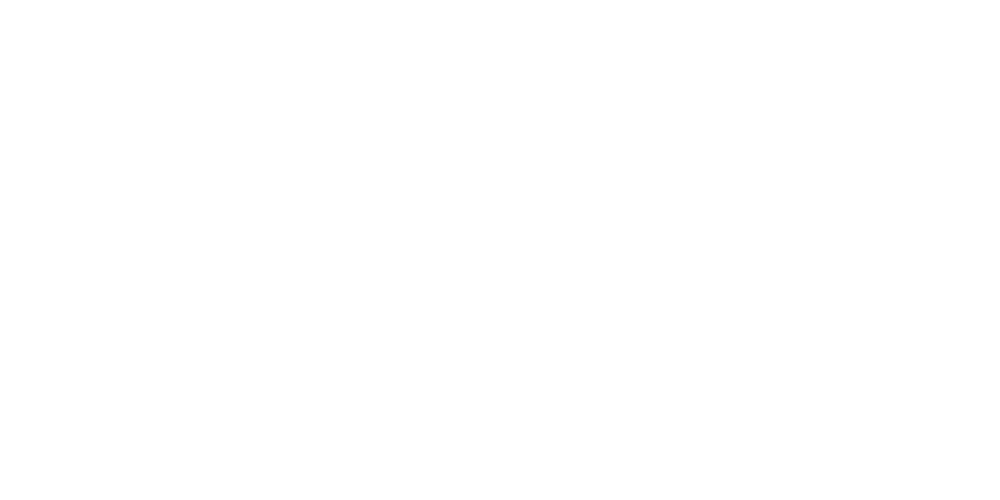

0.4


<IPython.core.display.Javascript object>


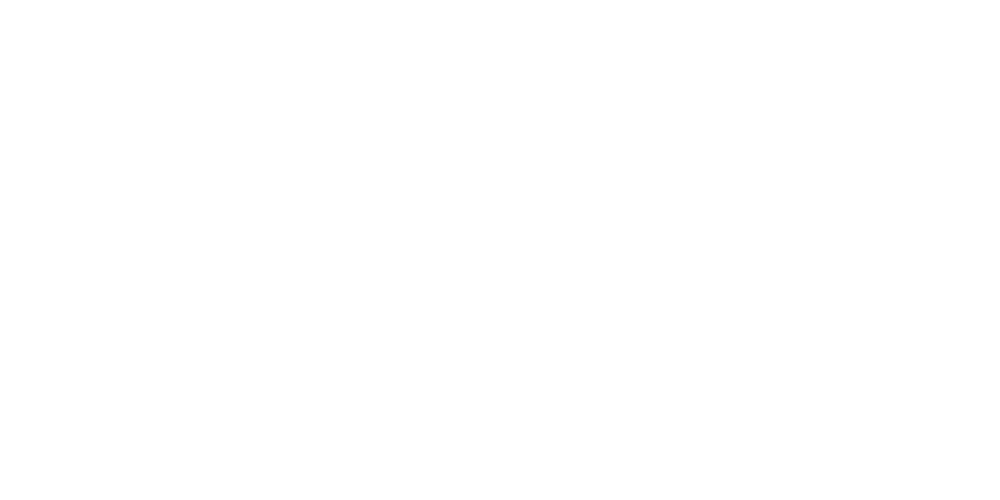

29.2201427805833


/home/samuel/anaconda3/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


In [45]:
ratio_list=[]
rmin=20
rmax=80

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse ck666')


figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)


Frame 1: 42 features
283 248.87928344489043


<IPython.core.display.Javascript object>


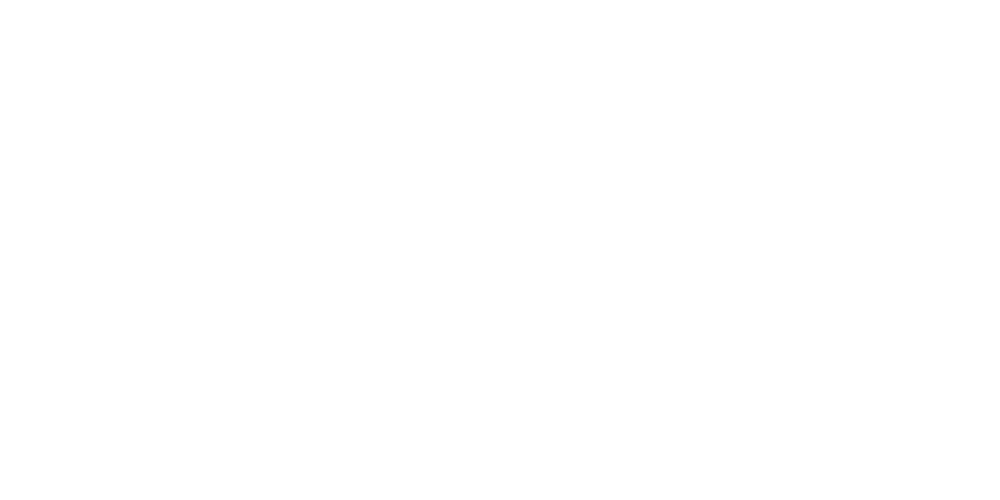

0.6


<IPython.core.display.Javascript object>


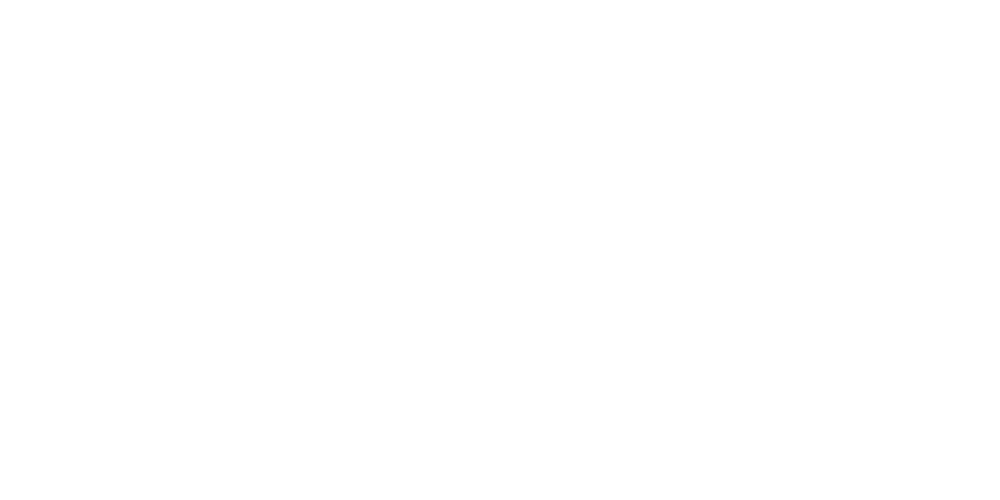

28.956551629490562


In [46]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse 154924 tcr/*.jpg'))

conect=2
mem=5
size=7
mass=200
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=30
rmax=70

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
x_cm=283
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse ck666')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 30 features
244 155.3510705038617


<IPython.core.display.Javascript object>


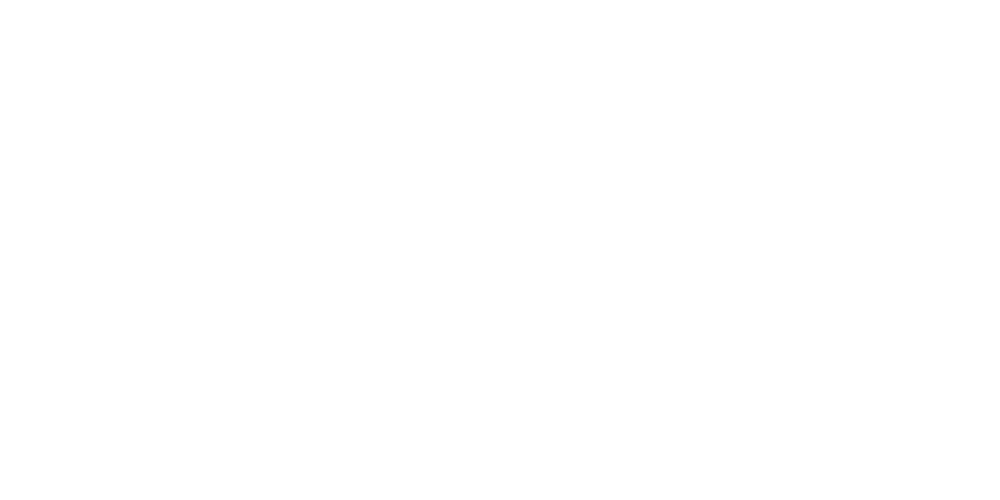

0.625


<IPython.core.display.Javascript object>


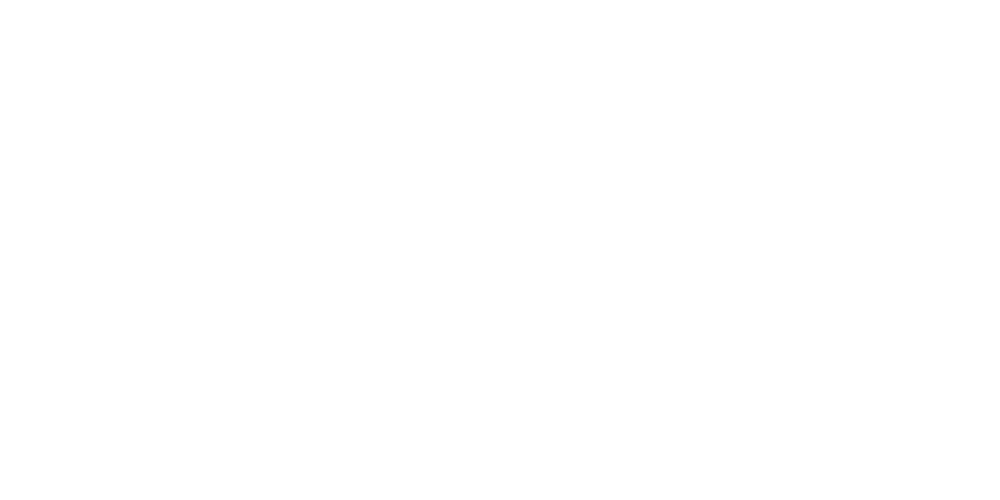

In [47]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse 170321 tcr/*.jpg'))

conect=2
mem=7
size=7
mass=200
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=15
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
x_cm=244
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse ck666')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook

Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))


x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 18 features
285.8267782318935 259.06881489172576


<IPython.core.display.Javascript object>


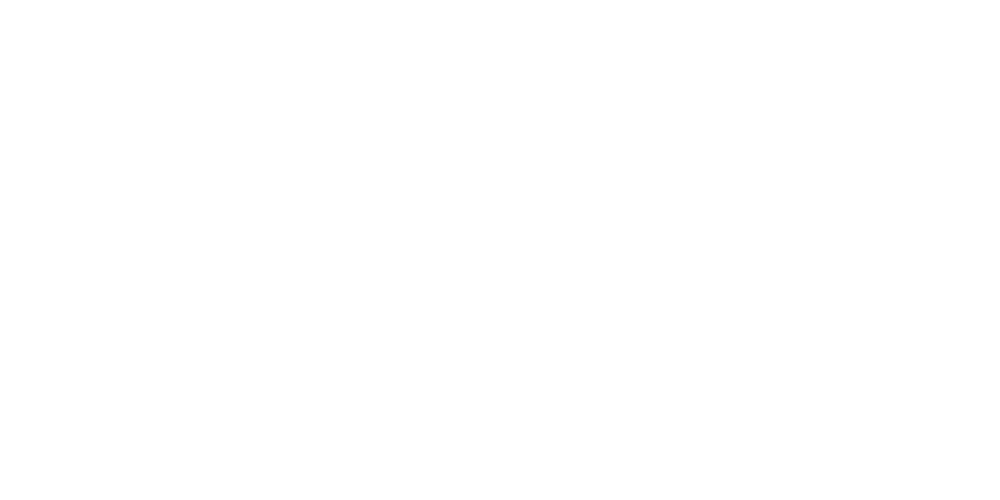

0.625


<IPython.core.display.Javascript object>


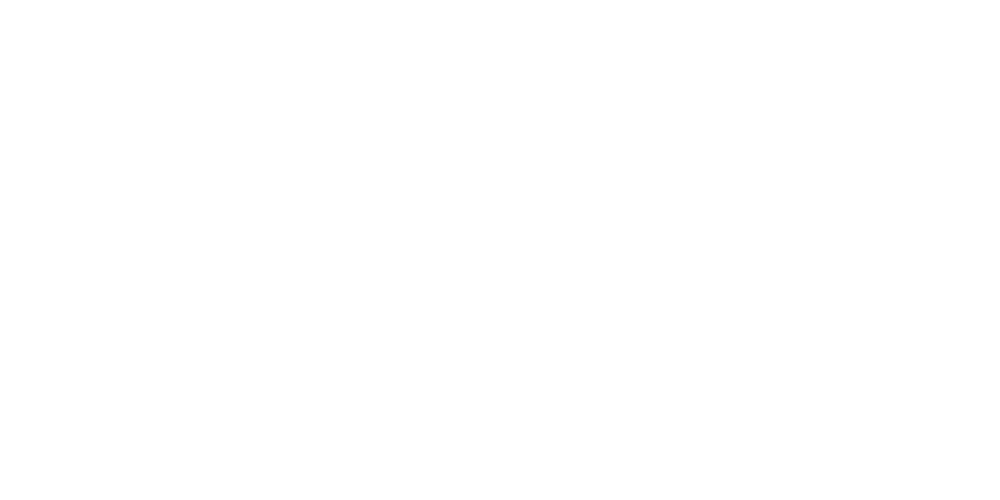

55.11313489150238


In [48]:

%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse ck666 4/*.jpg'))

conect=5
mem=5
size=7
mass=30
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=20
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse ck666')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 7 features
280.6367889389593 230.93516349393153


<IPython.core.display.Javascript object>


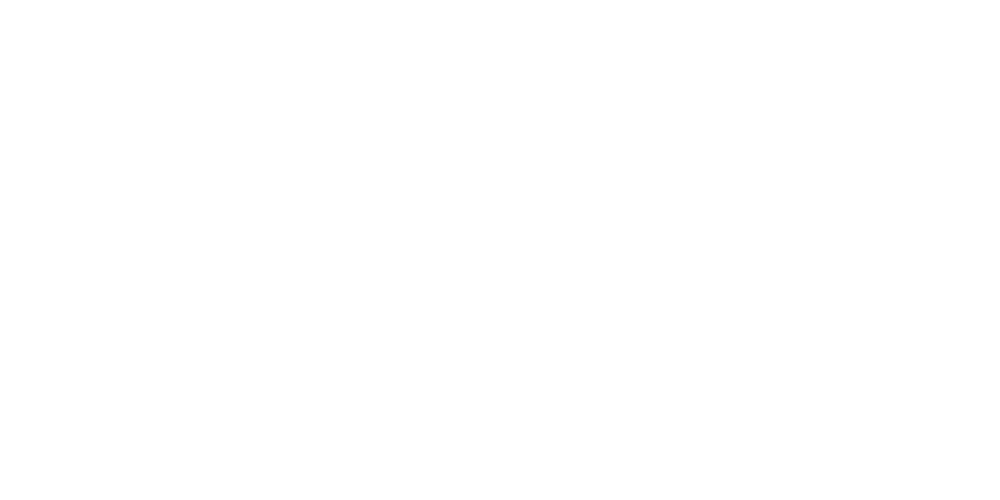

0.5664335664335665


<IPython.core.display.Javascript object>


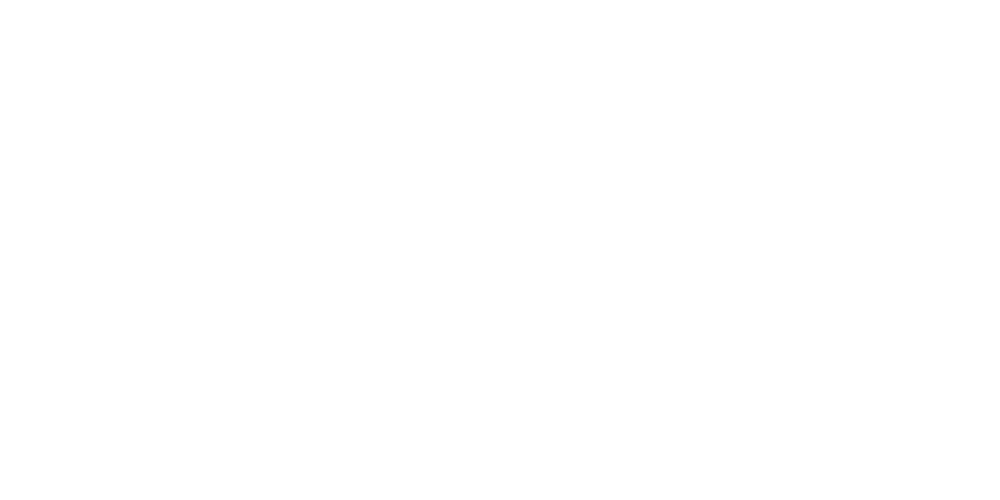

84.83810958223606


In [49]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse ck666 3/*.jpg'))

conect=5
mem=5
size=7
mass=60
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=20
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
#ratios.append(ratio_list[0])
#label.append('Mouse ck666')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
#vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
#vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 16 features
266.9507328752704 271.0729256188137


<IPython.core.display.Javascript object>


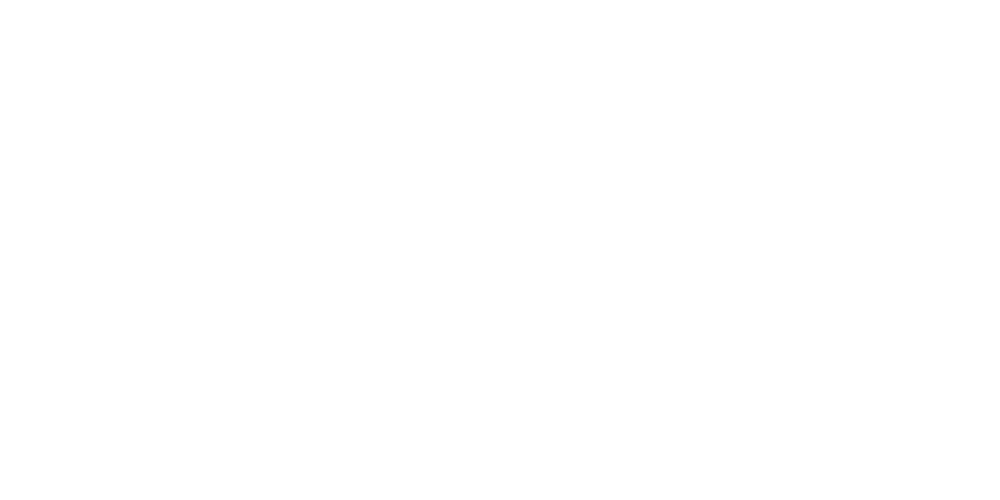

0.5454545454545454


<IPython.core.display.Javascript object>


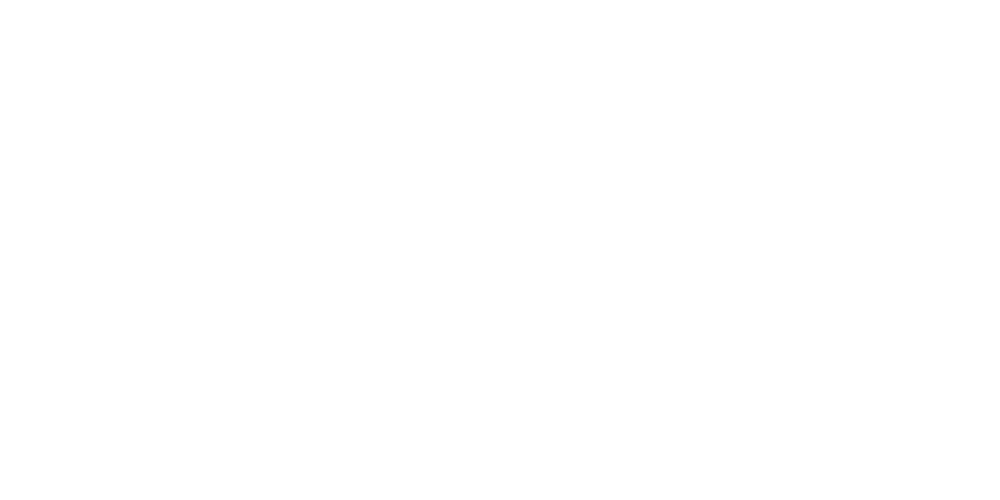

40.80871323581753


In [50]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse ck666 2/*.jpg'))

conect=5
mem=5
size=9
mass=60
filt=5
#tmMwt,dataMwt=find_traj_data(framesMwt,conect,mem,size,mass,filt)
#msd_Mwt,dt_Mwt=find_msd(tmMwt,40)
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])
ratio_list=[]
rmin=20
rmax=80
tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')
print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse ck666')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print(np.mean(Vel))
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)


In [51]:
print(len(label))
print(len(vel_avg))
print(len(ratios))

29
29
29


In [52]:
print(c)

3.5


Frame 1: 25 features
186.14982078181987 171.803346925502


<IPython.core.display.Javascript object>


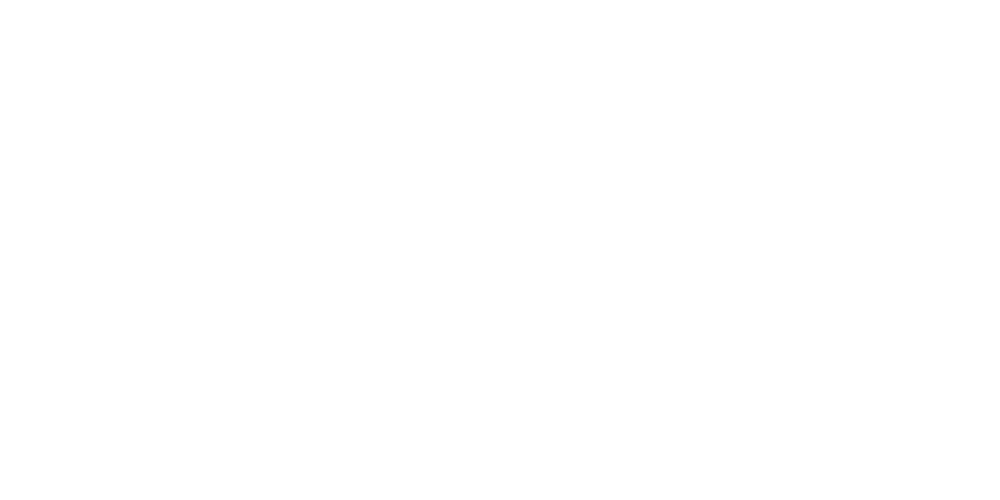

0.8


<IPython.core.display.Javascript object>


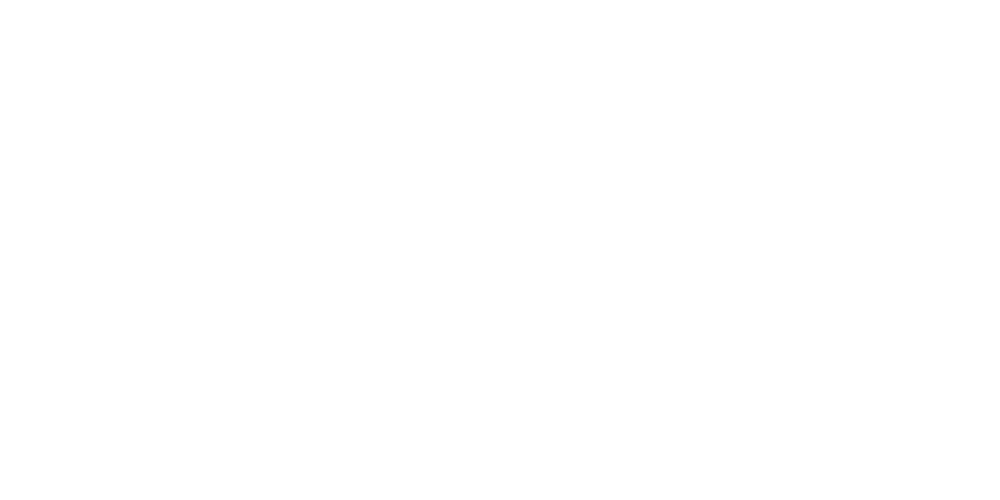

340.2837656653272
0.018252326707362168


In [53]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse waspneg 153426/*.jpg'))

conect=2
mem=5
size=9
mass=70
filt=9
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=15
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')

print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse WASP-neg')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 119 features
263.5020423048835 249.5648833058277


<IPython.core.display.Javascript object>


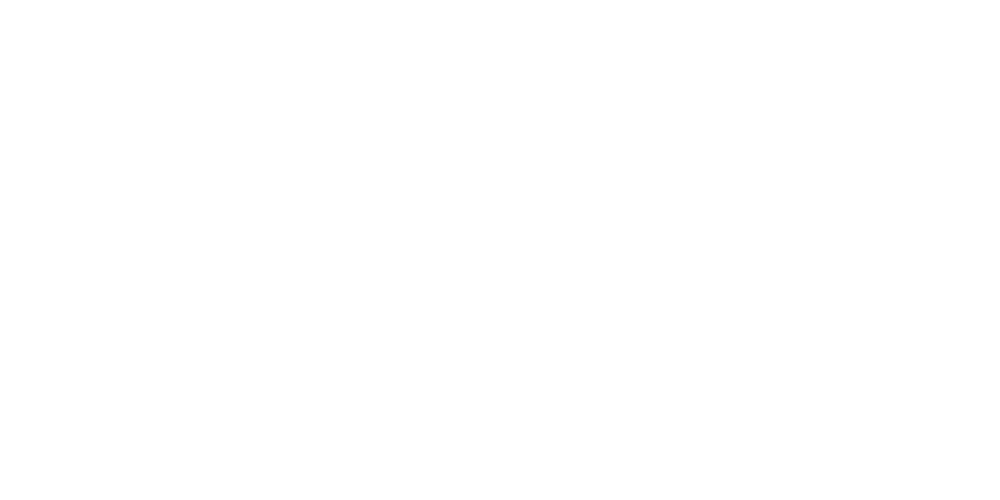

0.8048780487804879


<IPython.core.display.Javascript object>


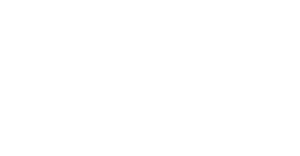

<IPython.core.display.Javascript object>


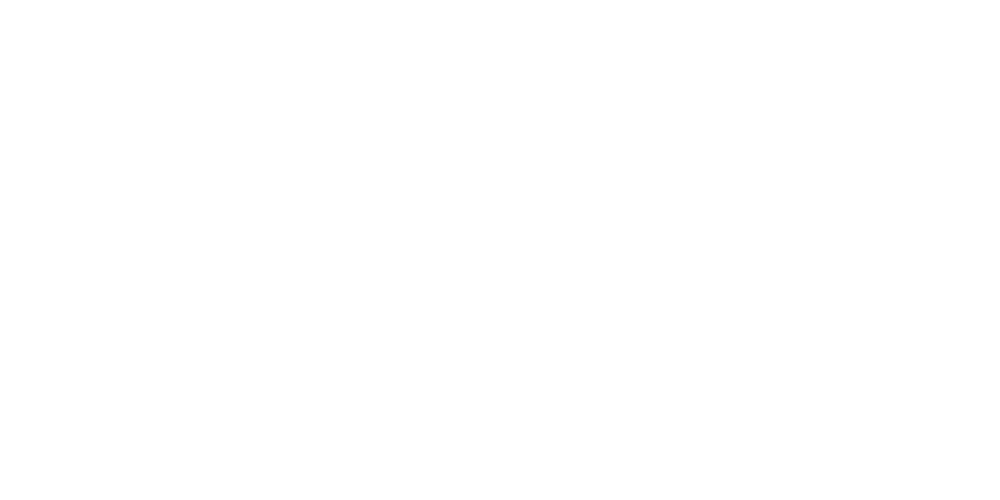

175.0320457517426
0.017755836360996126


In [54]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse waspneg 153942/*.jpg'))

conect=2
mem=5
size=9
mass=50
filt=9
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])


ratio_list=[]
rmin=20
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')

print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse WASP-neg')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 16 features
244.1540313864529 279.4405066981889


<IPython.core.display.Javascript object>


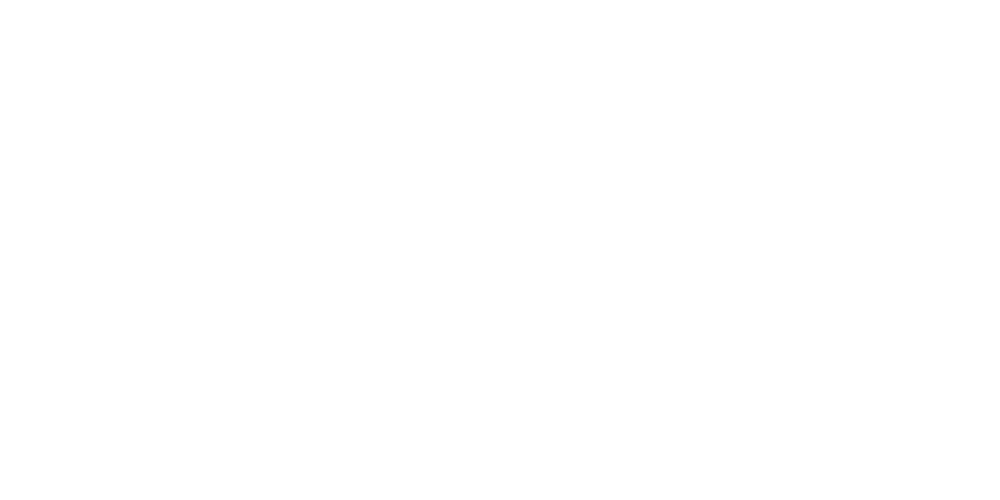

0.6666666666666666


<IPython.core.display.Javascript object>


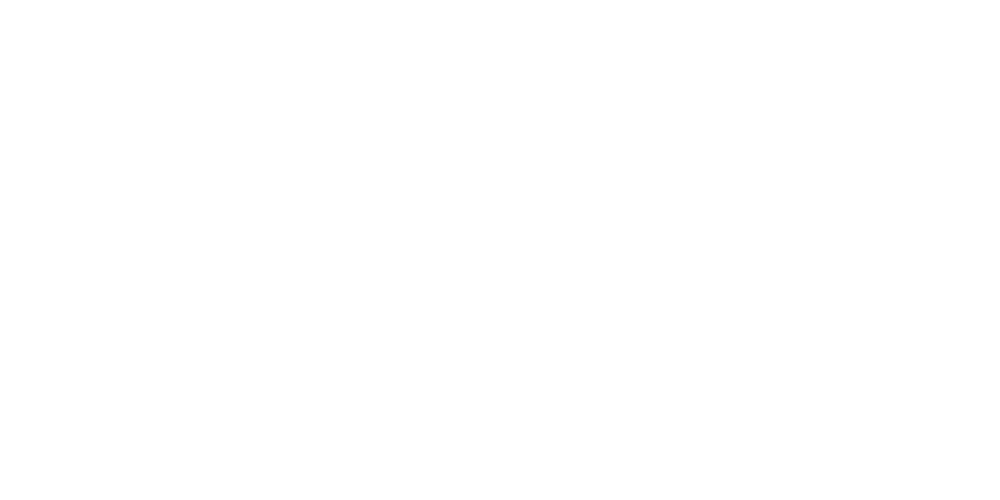

In [55]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse waspneg 154844/*.jpg'))

conect=2
mem=5
size=9
mass=40
filt=6
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=20
rmax=100

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')

print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse WASP-neg')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))


x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 20 features
275.93366249212556 223.97775120818744


<IPython.core.display.Javascript object>


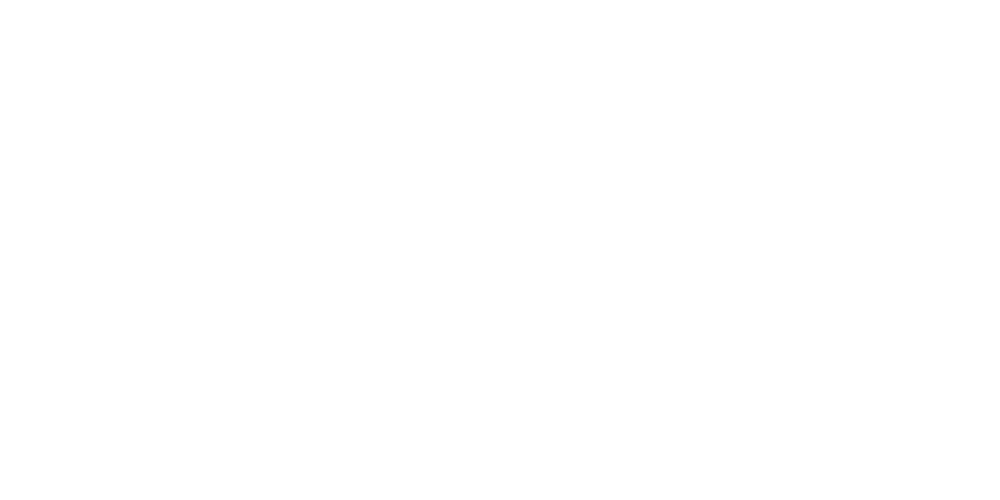

0.7142857142857143


<IPython.core.display.Javascript object>


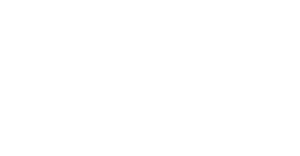

534.7485550554135
0.01762740528998704


In [56]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse waspneg153700/*.jpg'))

conect=2
mem=5
size=7
mass=20
filt=6
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])

ratio_list=[]
rmin=15
rmax=40

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')

print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse WASP-neg')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()

#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

Frame 1: 17 features
126.52346945551338 260.36344801914123


<IPython.core.display.Javascript object>


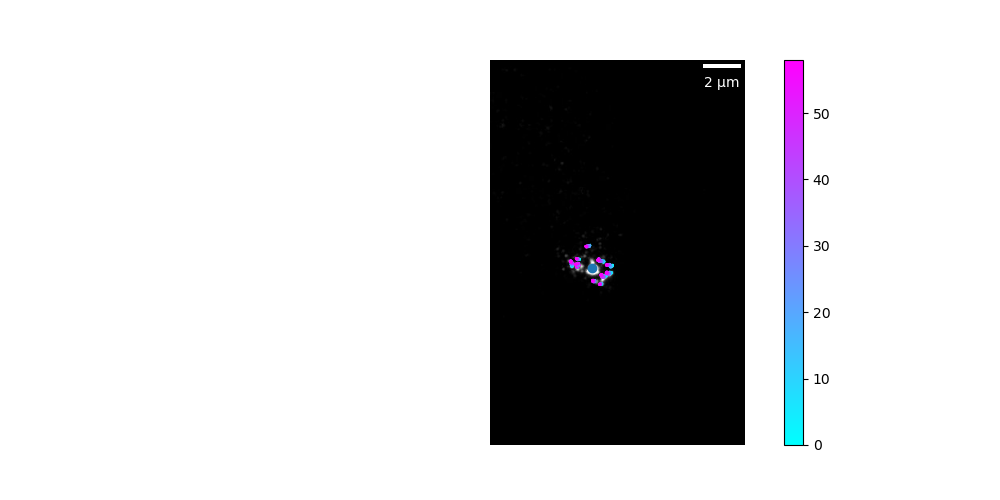

0.7272727272727273


<IPython.core.display.Javascript object>


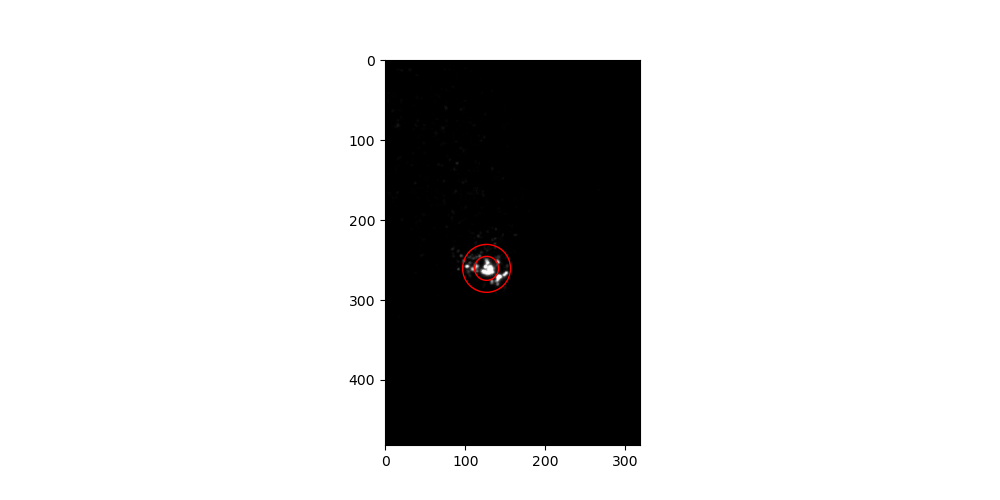

179.31179932726957
0.019722788077694623


In [57]:
%matplotlib notebook
@pims.pipeline
def gray(image):
    return image[:,:, 1]  # Take just the green channel

frames = (pims.open('../Documents/more actin inhib/mouse waspneg153200/*.jpg'))

conect=2
mem=3
size=5
mass=40
filt=5
n=1
f = tp.locate(frames[n],size,minmass=mass)
#tp.annotate(f, frames[n],plot_style={'markersize':10});
plt.imshow(frames[n])


ratio_list=[]
rmin=15
rmax=30

tm,data=find_traj_data(frames,conect,mem,size,mass,filt)

ee,xe,ye,iid=find_ee_distance(data)
x_cm,y_cm=find_cm(frames,tm,size)
plt.scatter(x_cm,y_cm,s=10,color='r')

print(x_cm,y_cm)
ri,rf,iidr=find_rad_distance(data,x_cm,y_cm)
ratio,V=in_out(c,ri,rf,xe,ye,ee,iidr,data,frames,rmin,rmax)  
ratio_list.append(ratio)
print(ratio)
ratios.append(ratio_list[0])
label.append('Mouse WASP-neg')

plt.scatter(x_cm,y_cm)
figure, axes = plt.subplots()
Drawing_uncolored_circle1 = plt.Circle( (x_cm, y_cm ),rmin,fill = False,color='r')
Drawing_uncolored_circle2 = plt.Circle( (x_cm, y_cm ),rmax,fill = False,color='r')
axes.add_artist( Drawing_uncolored_circle1 )
axes.add_artist( Drawing_uncolored_circle2 )
plt.imshow(frames[0])
plt.show()
#%matplotlib notebook
Vel=data['v'].tolist()
y, x, _ = plt.hist(Vel,40,density=True)
vel_avg.append(np.mean(Vel))

print (x.max())
print(y.max())
x_max=x[np.where(y == y.max())]
vel_list.append(x_max)

y2, x2, _ = plt.hist(V,40,density=True)


x2_max=x2[np.where(y2 == y2.max())]
V_moving_list.append(x2_max)

In [58]:
label_save=label


In [59]:
label=label_save

In [60]:
print(len(vel_avg))


print(len(label))

34
34


In [61]:
print(len(ratios))
print(label)



34
['Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat WT', 'Jurkat ck666', 'Jurkat ck666', 'Jurkat ck666', 'Jurkat ck666', 'Mouse Wt', 'Mouse Wt', 'Mouse Wt', 'Mouse Wt', 'Mouse Wt', 'Mouse Wt', 'Mouse Wt', 'Mouse Wt', 'Mouse Wt', 'Mouse Wt', 'Mouse ck666', 'Mouse ck666', 'Mouse ck666', 'Mouse ck666', 'Mouse ck666', 'Mouse WASP-neg', 'Mouse WASP-neg', 'Mouse WASP-neg', 'Mouse WASP-neg', 'Mouse WASP-neg']


In [62]:
print(V_moving_list)
print(len(V_moving_list))

Velsm=[]
for i in range(len(vel_list)):
    Velsm.append(np.max(V_moving_list[i]))
    
        
    

print(Velsm)
print(len(Velsm))

[array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([], dtype=float64)]
35


ValueError: zero-size array to reduction operation maximum which has no identity

Mann-Whitney U Statistic: 276.5
Two-Sided P-Value: 1.8628720095774848e-06


<IPython.core.display.Javascript object>


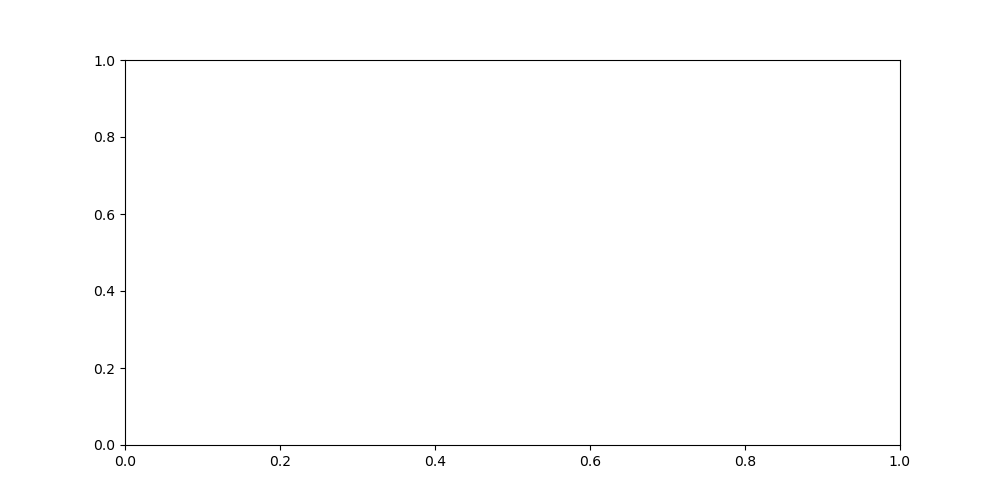

<IPython.core.display.Javascript object>


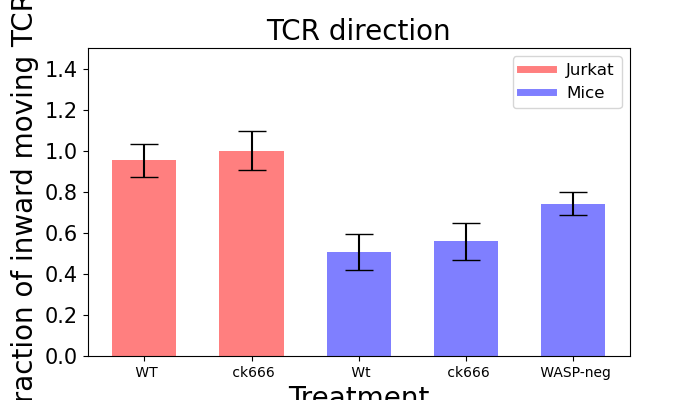

[0 1 2 3 4]
[0.9528534337772524, 1.0, 0.5048812573956887, 0.5590909090909091, 0.7426206314011192]
[0.08171327567579383, 0.09595849349412057, 0.08718247513111052, 0.08914172228458661, 0.05565188278095951]
P-Value for Jurkat WT vs. Jurkat ck666: 0.27802390634565943
P-Value for Jurkat WT vs. Mouse WASP-neg: 0.005813135147984466
P-Value for Jurkat WT vs. Mouse Wt: 0.0001806347208075351
P-Value for Jurkat WT vs. Mouse ck666: 0.0026471109662068656
P-Value for Jurkat ck666 vs. Mouse WASP-neg: 0.045312876841338515
P-Value for Jurkat ck666 vs. Mouse Wt: 0.005554301321981975
P-Value for Jurkat ck666 vs. Mouse ck666: 0.01745104482793073
P-Value for Mouse WASP-neg vs. Mouse Wt: 0.003233194497712169
P-Value for Mouse WASP-neg vs. Mouse ck666: 0.0119252335930176
P-Value for Mouse Wt vs. Mouse ck666: 0.4251551503118347


In [68]:
###   Normalised ###
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
# Create a dictionary to store the sums and counts for each string
values = ratios
strings = label

# Separate data into two groups (e.g., 'Jurkat' and 'Mouse')
jurkat_values = [value for value, string in zip(values, strings) if string.startswith('Jurkat')]
mouse_values = [value for value, string in zip(values, strings) if string.startswith('Mouse')]

# Calculate the Mann-Whitney U statistic and p-value
u_statistic, p_value = mannwhitneyu(jurkat_values, mouse_values, alternative='two-sided')

# Print the results
print("Mann-Whitney U Statistic:", u_statistic)
print("Two-Sided P-Value:", p_value)


# Create a list of unique treatment groups
treatment_groups = np.unique([label.split("_")[0] for label in strings])

# Initialize dictionaries to store p-values for each pair of groups
p_values = {}

# Calculate p-value for each pair of groups using MU test
for i in range(len(treatment_groups)):
    for j in range(i + 1, len(treatment_groups)):
        group1 = treatment_groups[i]
        group2 = treatment_groups[j]
        
        # Extract values for the two groups
        group1_values = [value for value, label in zip(values, strings) if label.startswith(group1)]
        group2_values = [value for value, label in zip(values, strings) if label.startswith(group2)]
        
        # Calculate the t-statistic and p-value using Student's t-test
        _, p_value = mannwhitneyu(group1_values, group2_values,alternative='two-sided')
        
        # Store the p-value for this pair of groups
        p_values[(group1, group2)] = p_value


# Create your bar plot with error bars as before
x = np.arange(len(treatment_groups))
fig, ax = plt.subplots()

# Create a dictionary to store the sums and counts for each string
sums = {}
counts = {}

# Loop over the values and strings lists, updating the sums and counts in the dictionary
for value, string in zip(values, strings):
    if string not in sums:
        sums[string] = 0
        counts[string] = 0
    sums[string] += value
    counts[string] += 1

# Calculate the averages and standard errors for each string
averages = {}
errors = {}
for string in sums:
    averages[string] = sums[string] / counts[string]
    if string.startswith('Jurkat'):
        jurkat_wt_value = averages[string]
    errors[string] = np.sqrt(np.var([value / jurkat_wt_value for value, string2 in zip(values, strings) if string2 == string])) / 1  # Standard error

# Plot the bar chart with error bars
x = np.arange(len(averages))
fig, ax = plt.subplots(figsize=(7,4))

colors = []
short_labels = []
for string in averages.keys():
    if string.startswith('Jurkat'):
        colors.append('#ff0000')
        short_labels.append(string.replace('Jurkat', ''))
    elif string.startswith('Mouse'):
        colors.append('blue')
        short_labels.append(string.replace('Mouse', ''))
    else:
        colors.append('gray')
        short_labels.append(string)

# Normalize values by the Jurkat WT value
normalized_values = [averages[string] / jurkat_wt_value if string.startswith('Jurkat') else averages[string] for string in averages]
normalized_errors = [errors[string] / jurkat_wt_value if string.startswith('Jurkat') else errors[string] for string in errors]

bars = ax.bar(x, normalized_values, yerr=normalized_errors, width=0.6,align='center', alpha=0.5, ecolor='black', capsize=10, color=colors)

ax.set_xticks(x)
ax.set_xticklabels(short_labels)
ax.set_ylabel('fraction of inward moving TCR', fontsize=20, fontname='Arial')
ax.set_xlabel('Treatment', fontsize=20, fontname='Arial')
ax.set_title('TCR direction', fontsize=20, fontname='Arial')
ax.set_ylim(0,1.5)
plt.yticks(fontsize=15, fontname='Arial')

# Create legend handles
red_patch = plt.Line2D([0], [0], color='#ff0000', lw=5, label='Jurkat', alpha=0.5)
blue_patch = plt.Line2D([0], [0], color='blue', lw=5, label='Mice', alpha=0.5)

# Create the plot
ax = plt.gca()

# Set legend font properties
legend_font = FontProperties(family='Arial', size=12)
ax.legend(handles=[red_patch, blue_patch], fontsize=15, title_fontsize=15, prop=legend_font)

plt.show()
print(x)
print(normalized_values)
print(normalized_errors)

# Now, you can print or use the p-values as needed
for group1, group2 in p_values:
    p_value = p_values[(group1, group2)]
    print(f"P-Value for {group1} vs. {group2}: {p_value}")




In [ ]:
%matplotlib notebook
x=[0.0519,0.058,0.732,0.937,1]
y=[0.687,0.694,0.652,1,0.996]

plt.scatter(x,y)

In [ ]:
print(ratios)

In [ ]:
label=label_save
print(ratios)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.font_manager import FontProperties
# Sample data: Replace these with your actual data
values = ratios
strings = label  # Assuming labels is your list of labels

# Create a DataFrame from your data
data = pd.DataFrame({'strings': strings, 'values': values})

# Create a custom palette dictionary
custom_palette = {}
custom_palette_scatter = {}
for l in strings:
    if l.startswith('Jurkat'):
        custom_palette[l] = '#F67280'
        custom_palette_scatter[l]='#990012'
    elif l.startswith('Mouse'):
        custom_palette[l] = '#56A5EC'
        custom_palette_scatter[l]='#2B60DE'
    else:
        custom_palette[l] = 'gray'  # Assign a default color for other labels

# Create a violin plot using Seaborn with the custom palette
plt.figure(figsize=(10, 6))
sns.violinplot(x='strings', y='values', data=data, palette=custom_palette)

# Overlay a swarmplot to show individual data points
sns.swarmplot(x='strings', y='values', data=data, palette=custom_palette_scatter,alpha=0.5,size=10)
# Create legend handles
red_patch = plt.Line2D([0], [0], color='#F67280', lw=5, label='Jurkat')
blue_patch = plt.Line2D([0], [0], color='#56A5EC', lw=5, label='Mice')

# Create the plot
ax = plt.gca()

# Set legend font properties
legend_font = FontProperties(family='Arial', size=15)
ax.legend(handles=[red_patch, blue_patch], fontsize=15, title_fontsize=15, prop=legend_font)

plt.title('Violin and Swarm Plot by Group')
plt.xlabel('Group')
plt.ylabel('Values')

# Show the plot
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.font_manager import FontProperties

# Sample data: Replace these with your actual data
values = ratios
strings = label  # Assuming labels is your list of labels

# Create a DataFrame from your data
data = pd.DataFrame({'strings': strings, 'values': values})

# Create a custom palette dictionary
custom_palette = {}
custom_palette_scatter = {}
for l in strings:
    if l.startswith('Jurkat'):
        custom_palette[l] = '#F67280'
        custom_palette_scatter[l] = '#990012'
    elif l.startswith('Mouse'):
        custom_palette[l] = '#56A5EC'
        custom_palette_scatter[l] = '#2B60DE'
    else:
        custom_palette[l] = 'gray'  # Assign a default color for other labels

# Set the font properties for labels and titles
font_properties = FontProperties(family='Arial', size=25)

# Create a violin plot using Seaborn with the custom palette
plt.figure(figsize=(10, 6))
sns.violinplot(x='strings', y='values', data=data, palette=custom_palette)

# Overlay a swarmplot to show individual data points
sns.swarmplot(x='strings', y='values', data=data, palette=custom_palette_scatter, alpha=0.5, size=10)


# Create legend handles
red_patch = plt.Line2D([0], [0], color='#F67280', lw=5, label='Jurkat')
blue_patch = plt.Line2D([0], [0], color='#56A5EC', lw=5, label='Mice')

# Create the plot
ax = plt.gca()

# Set legend font properties
ax.legend(handles=[red_patch, blue_patch], fontsize=15, title_fontsize=15, prop=font_properties)

# Set title and axis labels with updated font properties
#plt.title('Violin and Swarm Plot by Group', fontproperties=font_properties)
plt.xlabel('Group', fontproperties=font_properties)
plt.ylabel('Fraction of TCR moving inward', fontproperties=font_properties)
plt.ylim(0,1.8)
ax.tick_params(axis='both', labelsize=15)
# Show the plot
plt.show()




<IPython.core.display.Javascript object>


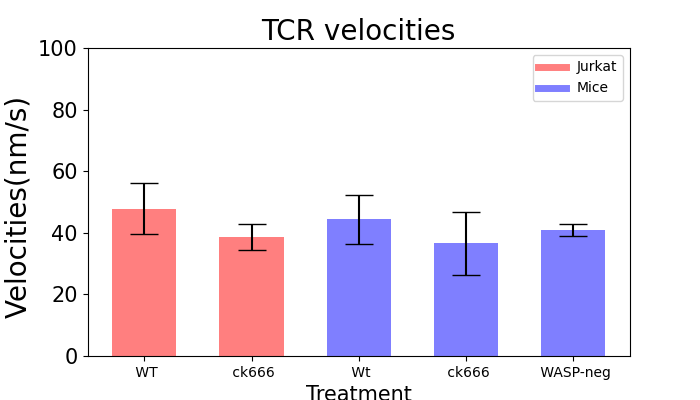

[0 1 2 3 4]
dict_values([47.889200764205, 38.55182146726378, 44.38111160726449, 36.55432306637741, 40.903609768891805])
dict_values([8.285792295191714, 4.265457328163168, 7.898113109307946, 10.35528627507715, 2.001166476525105])
P-Value for Jurkat WT vs. Jurkat ck666: 0.055967351322729335
P-Value for Jurkat WT vs. Mouse WASP-neg: 0.1586236058184476
P-Value for Jurkat WT vs. Mouse Wt: 0.42718148600680117
P-Value for Jurkat WT vs. Mouse ck666: 0.07549130459838524
P-Value for Jurkat ck666 vs. Mouse WASP-neg: 0.5555555555555556
P-Value for Jurkat ck666 vs. Mouse Wt: 0.2397602397602398
P-Value for Jurkat ck666 vs. Mouse ck666: 0.5555555555555556
P-Value for Mouse WASP-neg vs. Mouse Wt: 0.5134865134865134
P-Value for Mouse WASP-neg vs. Mouse ck666: 0.30952380952380953
P-Value for Mouse Wt vs. Mouse ck666: 0.09923409923409923


In [73]:
import numpy as np
import matplotlib.pyplot as plt

# Create a dictionary to store the sums and counts for each string
values = vel_avg
strings = label
# Create a list of unique treatment groups
treatment_groups = np.unique([label.split("_")[0] for label in strings])

# Initialize dictionaries to store p-values for each pair of groups
p_values = {}

# Calculate p-value for each pair of groups using Student's t-test
for i in range(len(treatment_groups)):
    for j in range(i + 1, len(treatment_groups)):
        group1 = treatment_groups[i]
        group2 = treatment_groups[j]
        
        # Extract values for the two groups
        group1_values = [value for value, label in zip(values, strings) if label.startswith(group1)]
        group2_values = [value for value, label in zip(values, strings) if label.startswith(group2)]
        
        # Calculate the t-statistic and p-value using Student's t-test
        _, p_value = mannwhitneyu(group1_values, group2_values,alternative='two-sided')
        
        # Store the p-value for this pair of groups
        p_values[(group1, group2)] = p_value
# Create a dictionary to store the sums and counts for each string
sums = {}
counts = {}

# Loop over the values and strings lists, updating the sums and counts in the dictionary
for value, string in zip(values, strings):
    if string not in sums:
        sums[string] = 0
        counts[string] = 0
    sums[string] += value
    counts[string] += 1

# Calculate the averages and standard errors for each string
averages = {}
errors = {}
for string in sums:
    averages[string] = sums[string] / counts[string]
    errors[string] = np.sqrt(np.var([value for value, string2 in zip(values, strings) if string2 == string])) / 1  # Standard error

# Plot the bar chart with error bars
x = np.arange(len(averages))
fig, ax = plt.subplots(figsize=(7,4))

colors = []
short_labels = []
for string in averages.keys():
    if string.startswith('Jurkat'):
        colors.append('#ff0000')
        short_labels.append(string.replace('Jurkat', ''))
    elif string.startswith('Mouse'):
        colors.append('blue')
        short_labels.append(string.replace('Mouse', ''))
    else:
        colors.append('gray')
        short_labels.append(string)

bars = ax.bar(x, averages.values(), yerr=errors.values(), width = 0.6, align='center', alpha=0.5, ecolor='black', capsize=10, color=colors)

ax.set_xticks(x)
ax.set_xticklabels(short_labels)
ax.set_ylabel('Velocities(nm/s) ',fontsize=20, fontname='Arial')
ax.set_xlabel('Treatment',fontsize=15, fontname='Arial')
ax.set_title('TCR velocities',fontsize=20, fontname='Arial')
ax.set_ylim(0,100)
plt.yticks(fontsize=15, fontname='Arial')




# Create legends
red_patch = plt.Line2D([0], [0], color='#ff0000', lw=5, label='Jurkat',alpha=0.5)
blue_patch = plt.Line2D([0], [0], color='blue', lw=5, label='Mice',alpha=0.5)
ax.legend(handles=[red_patch, blue_patch])

plt.show()

print(x)
print(averages.values())
print(errors.values())
# Now, you can print or use the p-values as needed
for group1, group2 in p_values:
    p_value = p_values[(group1, group2)]
    print(f"P-Value for {group1} vs. {group2}: {p_value}")

plt.show()

In [ ]:
print(len(vel_avg),len(label))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.font_manager import FontProperties

# Sample data: Replace these with your actual data
values = vel_avg
strings = label  # Assuming labels is your list of labels

# Create a DataFrame from your data
data = pd.DataFrame({'strings': strings, 'values': values})

# Create a custom palette dictionary
custom_palette = {}
custom_palette_scatter = {}
for l in strings:
    if l.startswith('Jurkat'):
        custom_palette[l] = '#F67280'
        custom_palette_scatter[l] = '#990012'
    elif l.startswith('Mouse'):
        custom_palette[l] = '#56A5EC'
        custom_palette_scatter[l] = '#2B60DE'
    else:
        custom_palette[l] = 'gray'  # Assign a default color for other labels

# Set the font properties for labels and titles
font_properties = FontProperties(family='Arial', size=25)

# Create a violin plot using Seaborn with the custom palette
plt.figure(figsize=(10, 6))
sns.violinplot(x='strings', y='values', data=data, palette=custom_palette)

# Overlay a swarmplot to show individual data points
sns.swarmplot(x='strings', y='values', data=data, palette=custom_palette_scatter, alpha=0.5, size=10)


# Create legend handles
red_patch = plt.Line2D([0], [0], color='#F67280', lw=5, label='Jurkat')
blue_patch = plt.Line2D([0], [0], color='#56A5EC', lw=5, label='Mice')

# Create the plot
ax = plt.gca()

# Set legend font properties
ax.legend(handles=[red_patch, blue_patch], fontsize=10, title_fontsize=15, prop=font_properties)

# Set title and axis labels with updated font properties
#plt.title('Violin and Swarm Plot by Group', fontproperties=font_properties)
plt.xlabel('Group', fontproperties=font_properties)
plt.ylabel('TCR Velocity (nm/s)', fontproperties=font_properties)
plt.ylim(0,60)
ax.tick_params(axis='both', labelsize=15)
# Show the plot
plt.show()

In [ ]:
%matplotlib notebook
model=['hypothesis0','hyp1_spiral_attraction','hyp1_spiral_binding','hyp1_wave','hypothesis2']
ratios_m=[0.01,0.753,0.794,0.309,1]
# creating the bar plot
plt.bar(model, ratios_m, color ='blue',width = 0.7)




plt.xlabel('Model',fontsize=15, fontname='Arial')
plt.ylabel('fraction of inward moving TCR ',fontsize=20, fontname='Arial')
plt.title('TCR direction',fontsize=20, fontname='Arial')
plt.show()

In [ ]:
list0=['J wt','J ck666 smihf2','J smihf2','J ck666','J bleb','M wt','M ck666','M smihf2','M ck66 smihf2','M bleb']
list1 = [0.863293650793651, 0.8388888888888889, 0.9523809523809524, 0.7989923469387755, 0.774657894736842, 0.5775730332618878, 0.6170707070707071, 0.6333333333333333, 0.603030303030303, 0.48412698412698413]
list2 = [0.1109985611936012, 0.10137937550497032, 0.0673435029701474, 0.09372457572096758, 0.03840306596524467, 0.13638399118939554, 0.035546802182381, 0.33993463423951903, 0.2202344522497772, 0.13232803175026242]
list3 = [0.18699914061747827, 0.2170033009209667, 0.1446905464173018, 0.18426577356288887, 0.15068411352329245, 0.14007134612800792, 0.09272991003808365, 0.12904244709156223, 0.09214006867039753, 0.15259149727116306]
list4= [0.026253033616300013, 0.04036957874332296, 0.047728922882625514, 0.029095476754635887, 0.0020135403807815975, 0.04257972548265021, 0.028458665333610373, 0.038286110682430985, 0.02965613422266955, 0.040116490573852706]
list5= [.21171773508661337, 0.2577337773285935, 0.14132516742822407, 0.17117120263662838, 0.17341270768604608, 0.19154430455998445, 0.09384856123316969, 0.45626986366605954, 0.06856327783261877, 0.20038159169898284]
list6=[0.04652071596429624, 0.1188207390448652, 0.012439000110832063, 0.025126036154287833, 0.032198781486009, 0.03379061777554657, 0.05301593770508618, 0.5089056884273082, 0.03198966994787618, 0.028565035629982128]
def lists_to_dataframe(list0,list1, list2, list3, list4, list5, list6):
    df = pd.DataFrame()
    df['Treatment'] = pd.Series(list0)
    df['TCR in ratio'] = pd.Series(list1)
    df['TCR in ratio SEM'] = pd.Series(list2)
    df['TCR velocity all'] = pd.Series(list3)
    df['TCR velocity all SEM'] = pd.Series(list4)
    df['TCR velocity filtered'] = pd.Series(list5)
    df['TCR velocity filtered SEM'] = pd.Series(list6)
    return df
df = lists_to_dataframe(list0,list1, list2, list3, list4, list5, list6)
(df)

In [ ]:
df.to_csv('data TCR.csv', index=False)

print('DataFrame has been exported to data.csv file.')

In [ ]:
%matplotlib notebook
ratios_save2=ratios
treatment=['no SMIHF2','nock66 SMIHF','nock666 SMIHF','SMIHF2','actin','actin','bleb','bleb','M ck666','M ck666','M SMIHF2','M SMIHF2','M no bleb','M bleb']
print(len(treatment))
plt.scatter(treatment,ratios_save2)
y1 = 0.64
y2 = 0.58
plt.axhspan(y1, y2, color='green', alpha=0.2, lw=0)
y3 = 0.9
y4 = 0.8
plt.axhspan(y4, y3, color='blue', alpha=0.2, lw=0)
plt.ylabel('ratio going toward CSMAC')

plt.title('Blue: Jurkat wt error bar for different trials   green:Mouse wt ')

In [ ]:
%matplotlib notebook
r=[0.87,0.8125, 0.75, 0.888, 0.6046511627906976, 0.629, 0.6, 0.6666666666666666, 0.7894736842105263, 0.72, 0.5416666666666666, 0.4489795918367347,0.73,0.64,0.61]
treat=['J wild type','J no SMIHF2','J nockSMIHF','J SMIHF2','J ck666','J bleb','M ck666','M ck666','M SMIHF2','M SMIHF2','M no bleb','M bleb','M SMIHF2','M ck666','M wt']

plt.scatter(treat,r)
y1 = 0.64
y2 = 0.58
plt.axhspan(y1, y2, color='green', alpha=0.2, lw=0)
y3 = 0.9
y4 = 0.8
plt.axhspan(y4, y3, color='blue', alpha=0.2, lw=0)
plt.ylabel('ratio going toward CSMAC')

plt.title('Blue: Jurkat wt error bar for different trials   green:Mouse wt ')

In [ ]:
%matplotlib notebook
r=[0.85,0.624,0.629,0.877,0.829,0.6225,0.595,0.483,0.78,0.77]
treat=['J wild type','J ck666','J bleb','J SMIHF2','J ck666+SMIHF2','M wt','M ck666','M bleb','M SMIHF2*','M SMIHF2+ck666']
error=[0.07,0.02,0.03,0.05,0.07,0.01,0.07,0.12,0,0]

plt.scatter(treat,r)
y1 = 0.64
y2 = 0.58
plt.axhspan(y1, y2, color='green', alpha=0.2, lw=0)
y3 = 0.9
y4 = 0.8
plt.axhspan(y4, y3, color='blue', alpha=0.2, lw=0)
plt.ylabel('ratio going toward CSMAC')

plt.title('Blue: Jurkat wt error bar for different trials   green:Mouse wt ')

In [ ]:
x_pos = np.arange(len(r))
fig, ax = plt.subplots()
ax.bar(treat,r,yerr=error,alpha=0.8)
ax.set_ylabel('ratio TCR going towards CSMAC')

ax.set_title('Blue: Jurkat wt error bar for different trials   green:Mouse wt')
ax.yaxis.grid(True)
y1 = 0.625
y2 = 0.605
plt.axhspan(y1, y2, color='green', alpha=0.2, lw=0)
y3 = 0.92
y4 = 0.78
plt.axhspan(y4, y3, color='blue', alpha=0.2, lw=0)
# Save the figure and show


plt.show()

In [ ]:
%matplotlib notebook
v=[0.217,0.153,0.1512,0.167,0.2136,0.172,0.096,0.114,0.14,0.107]
treat=['J wild type','J ck666','J bleb','J SMIHF2','J ck666+SMIHF2','M wt','M ck666','M bleb','M SMIHF2*','M SMIHF2+ck666*']
error=[0.01,0.002,0.004,0.04,0.002,0.001,0.007,0.04,0,0]


fig, ax = plt.subplots()
ax.bar(treat,v,yerr=error,alpha=0.8)
ax.set_ylabel('Vel(pix/time)')

ax.set_title('Maxima of Velocity Distributions')
ax.yaxis.grid(True)

In [ ]:
list0=['J wt','J ck666 smihf2','J smihf2','J ck666','J bleb','M wt','M ck666','M smihf2','M ck66 smihf2','M bleb']
list1 = [0.48759896299324046, 0.6240354612644915, 0.5207064618807463, 0.5779805265981816, 0.5509839776182083, 0.5421699445816063, 0.39924070303785314, 0.35670659346777994, 0.5890629876626314, 0.5320134080583085]
list2=[0.038177833264286726, 0.17763609811225817, 0.06664501980217985, 0.09091815839936968, 0.03254739875471084, 0.10582358667134485, 0.07911283279423809, 0.05761113891266034, 0.0, 0.036944783535647924]
def lists_to_dataframe(list0,list1,list2):
    df = pd.DataFrame()
    df['Treatment'] = pd.Series(list0)
    
    df['TCR velocity all'] = pd.Series(list1)
    df['TCR velocity error'] = pd.Series(list2)
    return df
df = lists_to_dataframe(list0,list1,list2)
(df)

In [ ]:
df.to_csv('vel replicate TCR.csv', index=False)

print('DataFrame has been exported to data.csv file.')

In [ ]:
asd=[1,2,2,2,1,4,5]
test=np.unique(asd)
test